In [1]:
import pandas as pd
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
from sklearn import model_selection
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
%matplotlib inline
import seaborn as sns
import pandas as pd
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

In [2]:
df=pd.read_csv('file:///C:/Users/Md%20Asif%20Ikbal/Downloads/Life%20Expectancy%20Data.csv')
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [3]:
df.isnull().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
 BMI                                34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
 HIV/AIDS                            0
GDP                                448
Population                         652
 thinness  1-19 years               34
 thinness 5-9 years                 34
Income composition of resources    167
Schooling                          163
dtype: int64

In [4]:
df=df.fillna(0)

In [5]:
df.shape

(2938, 22)

In [6]:
df.isnull().sum()

Country                            0
Year                               0
Status                             0
Life expectancy                    0
Adult Mortality                    0
infant deaths                      0
Alcohol                            0
percentage expenditure             0
Hepatitis B                        0
Measles                            0
 BMI                               0
under-five deaths                  0
Polio                              0
Total expenditure                  0
Diphtheria                         0
 HIV/AIDS                          0
GDP                                0
Population                         0
 thinness  1-19 years              0
 thinness 5-9 years                0
Income composition of resources    0
Schooling                          0
dtype: int64

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2938 non-null   float64
 4   Adult Mortality                  2938 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2938 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2938 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2938 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [8]:
df.describe()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
count,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2.938000e+03,2938.000000,2938.000000,2938.00000,2938.000000
mean,2007.518720,68.989312,164.235534,30.303948,4.298928,738.251295,65.705582,2419.592240,37.877774,42.035739,82.016338,5.481406,81.791695,1.742103,6342.091419,9.923150e+06,4.783696,4.813955,0.59188,11.327434
std,4.613841,10.327437,124.451093,117.926501,4.079748,1987.914858,38.878316,11467.272489,20.344920,160.445548,24.271835,2.875063,24.544100,5.077785,13409.501883,5.407586e+07,4.424924,4.512880,0.25114,4.265626
min,2000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.100000,0.000000,0.000000e+00,0.000000,0.000000,0.00000,0.000000
25%,2004.000000,63.000000,73.000000,0.000000,0.470000,4.685343,24.000000,0.000000,19.000000,0.000000,77.000000,3.740000,78.000000,0.100000,190.174435,5.874250e+03,1.500000,1.500000,0.46500,9.500000
50%,2008.000000,72.000000,144.000000,3.000000,3.130000,64.912906,87.000000,17.000000,43.000000,4.000000,93.000000,5.540000,93.000000,0.100000,1171.983435,5.393575e+05,3.300000,3.300000,0.66200,12.100000
75%,2012.000000,75.600000,227.000000,22.000000,7.390000,441.534144,96.000000,360.250000,56.100000,28.000000,97.000000,7.330000,97.000000,0.800000,4779.405190,4.584371e+06,7.100000,7.200000,0.77200,14.100000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.600000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.94800,20.700000


In [9]:
df.corr().describe().T

,count,mean,std,min,25%,50%,75%,max
Year,20.0,0.076630,0.252241,-0.156086,-0.058958,0.022654,0.133461,1.0
Life expectancy,20.0,0.134345,0.426783,-0.609053,-0.181017,0.179924,0.430676,1.0
Adult Mortality,20.0,-0.051839,0.368521,-0.609053,-0.280947,-0.122066,0.083512,1.0
infant deaths,20.0,0.124047,0.392019,-0.224995,-0.144861,-0.091989,0.462405,1.0
Alcohol,20.0,0.114654,0.321454,-0.381284,-0.102875,0.096988,0.305333,1.0
percentage expenditure,20.0,0.145058,0.345088,-0.246709,-0.090353,0.088445,0.353870,1.0
Hepatitis B,20.0,0.098656,0.292392,-0.152917,-0.116100,-0.041063,0.207874,1.0
Measles,20.0,0.072431,0.301029,-0.170780,-0.127773,-0.062941,0.221331,1.0
BMI,20.0,0.097384,0.383180,-0.501069,-0.227733,0.190811,0.298277,1.0
under-five deaths,20.0,0.119047,0.396316,-0.235946,-0.159539,-0.093643,0.463676,1.0


In [10]:
df.mean()

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  """Entry point for launching an IPython kernel.


Year                               2.007519e+03
Life expectancy                    6.898931e+01
Adult Mortality                    1.642355e+02
infant deaths                      3.030395e+01
Alcohol                            4.298928e+00
percentage expenditure             7.382513e+02
Hepatitis B                        6.570558e+01
Measles                            2.419592e+03
 BMI                               3.787777e+01
under-five deaths                  4.203574e+01
Polio                              8.201634e+01
Total expenditure                  5.481406e+00
Diphtheria                         8.179170e+01
 HIV/AIDS                          1.742103e+00
GDP                                6.342091e+03
Population                         9.923150e+06
 thinness  1-19 years              4.783696e+00
 thinness 5-9 years                4.813955e+00
Income composition of resources    5.918802e-01
Schooling                          1.132743e+01
dtype: float64

In [11]:
df.min()

Country                            Afghanistan
Year                                      2000
Status                               Developed
Life expectancy                            0.0
Adult Mortality                            0.0
infant deaths                                0
Alcohol                                    0.0
percentage expenditure                     0.0
Hepatitis B                                0.0
Measles                                      0
 BMI                                       0.0
under-five deaths                            0
Polio                                      0.0
Total expenditure                          0.0
Diphtheria                                 0.0
 HIV/AIDS                                  0.1
GDP                                        0.0
Population                                 0.0
 thinness  1-19 years                      0.0
 thinness 5-9 years                        0.0
Income composition of resources            0.0
Schooling    

In [12]:
df.max()

Country                                Zimbabwe
Year                                       2015
Status                               Developing
Life expectancy                            89.0
Adult Mortality                           723.0
infant deaths                              1800
Alcohol                                   17.87
percentage expenditure              19479.91161
Hepatitis B                                99.0
Measles                                  212183
 BMI                                       87.3
under-five deaths                          2500
Polio                                      99.0
Total expenditure                          17.6
Diphtheria                                 99.0
 HIV/AIDS                                  50.6
GDP                                 119172.7418
Population                         1293859294.0
 thinness  1-19 years                      27.7
 thinness 5-9 years                        28.6
Income composition of resources         

In [13]:
df.skew()

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  """Entry point for launching an IPython kernel.


Year                               -0.006409
Life expectancy                    -1.456754
Adult Mortality                     1.171507
infant deaths                       9.786963
Alcohol                             0.668736
percentage expenditure              4.652051
Hepatitis B                        -0.883719
Measles                             9.441332
 BMI                               -0.219261
under-five deaths                   9.495065
Polio                              -2.063185
Total expenditure                   0.177209
Diphtheria                         -2.037212
 HIV/AIDS                           5.396112
GDP                                 3.504229
Population                         17.936155
 thinness  1-19 years               1.709069
 thinness 5-9 years                 1.775103
Income composition of resources    -1.097371
Schooling                          -1.039966
dtype: float64

In [14]:
for i  in df.columns:
    print(f'unique values in column "{i}" is\n {df[i].value_counts()}')
    print('-------------------------------------------------')

unique values in column "Country" is
 Afghanistan              16
Peru                     16
Nicaragua                16
Niger                    16
Nigeria                  16
                         ..
Niue                      1
San Marino                1
Nauru                     1
Saint Kitts and Nevis     1
Dominica                  1
Name: Country, Length: 193, dtype: int64
-------------------------------------------------
unique values in column "Year" is
 2013    193
2015    183
2014    183
2012    183
2011    183
2010    183
2009    183
2008    183
2007    183
2006    183
2005    183
2004    183
2003    183
2002    183
2001    183
2000    183
Name: Year, dtype: int64
-------------------------------------------------
unique values in column "Status" is
 Developing    2426
Developed      512
Name: Status, dtype: int64
-------------------------------------------------
unique values in column "Life expectancy " is
 73.0    45
75.0    33
78.0    31
73.6    28
73.9    25
       

In [16]:
object_col=[]
num_col=[]
for i in df.columns:
    if df[i].dtype=='object':
        object_col.append(i)
    else:
        num_col.append(i)

In [17]:
object_col

['Country', 'Status']

In [18]:
num_col

['Year',
 'Life expectancy ',
 'Adult Mortality',
 'infant deaths',
 'Alcohol',
 'percentage expenditure',
 'Hepatitis B',
 'Measles ',
 ' BMI ',
 'under-five deaths ',
 'Polio',
 'Total expenditure',
 'Diphtheria ',
 ' HIV/AIDS',
 'GDP',
 'Population',
 ' thinness  1-19 years',
 ' thinness 5-9 years',
 'Income composition of resources',
 'Schooling']

In [19]:
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2938 non-null   float64
 4   Adult Mortality                  2938 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2938 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2938 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2938 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [20]:
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

In [21]:
from sklearn.preprocessing import LabelEncoder

In [22]:
le=LabelEncoder()

In [26]:
df['Status']=le.fit_transform(df['Status'])

In [27]:
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,1,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,1,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,1,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,1,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,1,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   int32  
 3   Life expectancy                  2938 non-null   float64
 4   Adult Mortality                  2938 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2938 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2938 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2938 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [41]:
x=df.drop(['Country'],axis='columns')
y=df.Country.values

In [42]:
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.3)

In [47]:
tre=DecisionTreeClassifier()
tre.fit(xtrain,ytrain)
pred_tre=tre.predict(xtest)
accu_tre=accuracy_score(ytest,pred_tre)*100
accu_tre

88.20861678004536

In [44]:
print(classification_report(ytest,pred_tre))

                                                      precision    recall  f1-score   support

                                         Afghanistan       1.00      1.00      1.00         5
                                             Albania       1.00      0.80      0.89         5
                                             Algeria       1.00      0.67      0.80         6
                                              Angola       1.00      0.80      0.89         5
                                 Antigua and Barbuda       1.00      1.00      1.00         3
                                           Argentina       1.00      1.00      1.00         6
                                             Armenia       0.89      1.00      0.94         8
                                           Australia       1.00      0.75      0.86         4
                                             Austria       0.80      1.00      0.89         4
                                          Azerbaijan       

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [48]:
kne=KNeighborsClassifier()
kne.fit(xtrain,ytrain)
pred_kne=kne.predict(xtest)
accu_kne=accuracy_score(ytest,pred_kne)*100
accu_kne

20.634920634920633

In [49]:
print(classification_report(ytest,pred_kne))

                                                      precision    recall  f1-score   support

                                         Afghanistan       0.08      0.20      0.11         5
                                             Albania       0.04      0.20      0.07         5
                                             Algeria       0.00      0.00      0.00         6
                                              Angola       0.00      0.00      0.00         5
                                 Antigua and Barbuda       0.33      1.00      0.50         3
                                           Argentina       0.25      0.33      0.29         6
                                             Armenia       0.17      0.12      0.14         8
                                           Australia       0.00      0.00      0.00         4
                                             Austria       0.44      1.00      0.62         4
                                          Azerbaijan       

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [50]:
from sklearn.ensemble import AdaBoostClassifier

In [52]:
ada=AdaBoostClassifier()
ada.fit(xtrain,ytrain)
pred_ada=ada.predict(xtest)
accu_ada=accuracy_score(ytest,pred_ada)*100
accu_ada

0.45351473922902497

In [53]:
print(classification_report(ytest,pred_ada))

                                                      precision    recall  f1-score   support

                                         Afghanistan       0.00      0.00      0.00         5
                                             Albania       0.00      0.00      0.00         5
                                             Algeria       0.00      0.00      0.00         6
                                              Angola       0.00      0.00      0.00         5
                                 Antigua and Barbuda       0.00      0.00      0.00         3
                                           Argentina       0.00      0.00      0.00         6
                                             Armenia       0.00      0.00      0.00         8
                                           Australia       0.00      0.00      0.00         4
                                             Austria       0.00      0.00      0.00         4
                                          Azerbaijan       

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [54]:
lo=LogisticRegression()
lo.fit(xtrain,ytrain)
pred_lo=lo.predict(xtest)
accu_lo=accuracy_score(ytest,pred_lo)*100
accu_lo

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


0.3401360544217687

In [55]:
print(classification_report(ytest,pred_lo))

                                                      precision    recall  f1-score   support

                                         Afghanistan       0.00      0.00      0.00         5
                                             Albania       0.00      0.00      0.00         5
                                             Algeria       0.00      0.00      0.00         6
                                              Angola       0.00      0.00      0.00         5
                                 Antigua and Barbuda       0.00      0.00      0.00         3
                                           Argentina       0.00      0.00      0.00         6
                                             Armenia       0.00      0.00      0.00         8
                                           Australia       0.00      0.00      0.00         4
                                             Austria       0.00      0.00      0.00         4
                                          Azerbaijan       

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [56]:
from sklearn.ensemble import BaggingClassifier

In [57]:
bag=BaggingClassifier()
bag.fit(xtrain,ytrain)
pred_bag=bag.predict(xtest)
accu_bag=accuracy_score(ytest,pred_bag)*100
accu_bag

94.10430839002267

In [58]:
print(classification_report(ytest,pred_bag))

                                                      precision    recall  f1-score   support

                                         Afghanistan       1.00      1.00      1.00         5
                                             Albania       1.00      1.00      1.00         5
                                             Algeria       1.00      0.67      0.80         6
                                              Angola       1.00      1.00      1.00         5
                                 Antigua and Barbuda       1.00      0.67      0.80         3
                                           Argentina       1.00      1.00      1.00         6
                                             Armenia       1.00      1.00      1.00         8
                                           Australia       1.00      1.00      1.00         4
                                             Austria       1.00      1.00      1.00         4
                                          Azerbaijan       

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [59]:
from sklearn.naive_bayes import GaussianNB

In [60]:
gau=GaussianNB()
gau.fit(xtrain,ytrain)
pred_gau=gau.predict(xtest)
accu_l=accuracy_score(ytest,pred_gau)*100
accu_l

11.45124716553288

In [61]:
print(classification_report(ytest,pred_gau))

                                                      precision    recall  f1-score   support

                                         Afghanistan       0.33      0.20      0.25         5
                                             Albania       0.00      0.00      0.00         5
                                             Algeria       0.00      0.00      0.00         6
                                              Angola       0.00      0.00      0.00         5
                                 Antigua and Barbuda       0.40      0.67      0.50         3
                                           Argentina       0.20      0.17      0.18         6
                                             Armenia       0.00      0.00      0.00         8
                                           Australia       0.00      0.00      0.00         4
                                             Austria       0.67      0.50      0.57         4
                                          Azerbaijan       

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [62]:
from sklearn.ensemble import ExtraTreesClassifier

In [63]:
etc=ExtraTreesClassifier()
etc.fit(xtrain,ytrain)
pred_etc=etc.predict(xtest)
accu_etc=accuracy_score(ytest,pred_etc)*100
accu_etc

97.73242630385488

In [64]:
print(classification_report(ytest,pred_etc))

                                                      precision    recall  f1-score   support

                                         Afghanistan       1.00      1.00      1.00         5
                                             Albania       1.00      1.00      1.00         5
                                             Algeria       1.00      1.00      1.00         6
                                              Angola       1.00      1.00      1.00         5
                                 Antigua and Barbuda       1.00      1.00      1.00         3
                                           Argentina       1.00      1.00      1.00         6
                                             Armenia       1.00      1.00      1.00         8
                                           Australia       0.80      1.00      0.89         4
                                             Austria       1.00      1.00      1.00         4
                                          Azerbaijan       

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [65]:
from sklearn.svm import SVC

In [66]:
svc=SVC()
svc.fit(xtrain,ytrain)
pred_svc=svc.predict(xtest)
accu_svc=accuracy_score(ytest,pred_svc)*100
accu_svc

1.473922902494331

In [67]:
print(classification_report(ytest,pred_svc))

                                                      precision    recall  f1-score   support

                                         Afghanistan       0.00      0.00      0.00         5
                                             Albania       0.00      0.00      0.00         5
                                             Algeria       0.00      0.00      0.00         6
                                              Angola       0.00      0.00      0.00         5
                                 Antigua and Barbuda       0.00      0.00      0.00         3
                                           Argentina       0.00      0.00      0.00         6
                                             Armenia       0.00      0.00      0.00         8
                                           Australia       0.00      0.00      0.00         4
                                             Austria       0.00      0.00      0.00         4
                                          Azerbaijan       

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [68]:
from sklearn.ensemble import RandomForestClassifier

In [69]:
rnd=RandomForestClassifier()
rnd.fit(xtrain,ytrain)
pred_rnd=rnd.predict(xtest)
accu_rnd=accuracy_score(ytest,pred_rnd)*100
accu_rnd

98.1859410430839

In [70]:
print(classification_report(ytest,pred_rnd))

                                                      precision    recall  f1-score   support

                                         Afghanistan       1.00      1.00      1.00         5
                                             Albania       1.00      1.00      1.00         5
                                             Algeria       1.00      1.00      1.00         6
                                              Angola       1.00      1.00      1.00         5
                                 Antigua and Barbuda       1.00      1.00      1.00         3
                                           Argentina       1.00      1.00      1.00         6
                                             Armenia       1.00      1.00      1.00         8
                                           Australia       0.80      1.00      0.89         4
                                             Austria       0.80      1.00      0.89         4
                                          Azerbaijan       

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [71]:
from catboost import CatBoostClassifier

In [72]:
cat=CatBoostClassifier()
cat.fit(xtrain,ytrain)

Learning rate set to 0.082089
0:	learn: 5.1126381	total: 1.88s	remaining: 31m 18s
1:	learn: 5.0183073	total: 3.06s	remaining: 25m 24s
2:	learn: 4.9017956	total: 4.23s	remaining: 23m 25s
3:	learn: 4.7782163	total: 5.45s	remaining: 22m 36s
4:	learn: 4.6310098	total: 6.89s	remaining: 22m 51s
5:	learn: 4.4879110	total: 8.16s	remaining: 22m 31s
6:	learn: 4.3887068	total: 9.45s	remaining: 22m 20s
7:	learn: 4.2824812	total: 11.4s	remaining: 23m 38s
8:	learn: 4.1788101	total: 13.2s	remaining: 24m 13s
9:	learn: 4.0918447	total: 14.6s	remaining: 24m 1s
10:	learn: 4.0224386	total: 15.9s	remaining: 23m 45s
11:	learn: 3.9336583	total: 17s	remaining: 23m 21s
12:	learn: 3.8414734	total: 18.9s	remaining: 23m 55s
13:	learn: 3.7084920	total: 20.4s	remaining: 23m 59s
14:	learn: 3.6294914	total: 22s	remaining: 24m 2s
15:	learn: 3.5387010	total: 23.2s	remaining: 23m 44s
16:	learn: 3.4411793	total: 24.4s	remaining: 23m 31s
17:	learn: 3.3942776	total: 25.6s	remaining: 23m 17s
18:	learn: 3.3182434	total: 26.9

153:	learn: 0.4405151	total: 3m 30s	remaining: 19m 14s
154:	learn: 0.4374722	total: 3m 31s	remaining: 19m 11s
155:	learn: 0.4339710	total: 3m 32s	remaining: 19m 9s
156:	learn: 0.4302492	total: 3m 33s	remaining: 19m 7s
157:	learn: 0.4273160	total: 3m 34s	remaining: 19m 5s
158:	learn: 0.4246585	total: 3m 36s	remaining: 19m 2s
159:	learn: 0.4204377	total: 3m 37s	remaining: 19m
160:	learn: 0.4170804	total: 3m 38s	remaining: 18m 58s
161:	learn: 0.4140059	total: 3m 39s	remaining: 18m 56s
162:	learn: 0.4115525	total: 3m 40s	remaining: 18m 53s
163:	learn: 0.4077506	total: 3m 41s	remaining: 18m 51s
164:	learn: 0.4039785	total: 3m 43s	remaining: 18m 49s
165:	learn: 0.4014530	total: 3m 44s	remaining: 18m 47s
166:	learn: 0.3974614	total: 3m 45s	remaining: 18m 45s
167:	learn: 0.3942855	total: 3m 46s	remaining: 18m 43s
168:	learn: 0.3906333	total: 3m 47s	remaining: 18m 41s
169:	learn: 0.3869716	total: 3m 49s	remaining: 18m 39s
170:	learn: 0.3840072	total: 3m 50s	remaining: 18m 37s
171:	learn: 0.3796

304:	learn: 0.1821506	total: 6m 36s	remaining: 15m 2s
305:	learn: 0.1812074	total: 6m 37s	remaining: 15m 1s
306:	learn: 0.1805057	total: 6m 38s	remaining: 14m 59s
307:	learn: 0.1799171	total: 6m 39s	remaining: 14m 58s
308:	learn: 0.1792188	total: 6m 40s	remaining: 14m 56s
309:	learn: 0.1780539	total: 6m 42s	remaining: 14m 55s
310:	learn: 0.1776094	total: 6m 43s	remaining: 14m 53s
311:	learn: 0.1768026	total: 6m 44s	remaining: 14m 52s
312:	learn: 0.1760258	total: 6m 45s	remaining: 14m 50s
313:	learn: 0.1751450	total: 6m 46s	remaining: 14m 49s
314:	learn: 0.1746338	total: 6m 48s	remaining: 14m 47s
315:	learn: 0.1740989	total: 6m 49s	remaining: 14m 45s
316:	learn: 0.1732283	total: 6m 50s	remaining: 14m 44s
317:	learn: 0.1723821	total: 6m 51s	remaining: 14m 43s
318:	learn: 0.1717352	total: 6m 53s	remaining: 14m 41s
319:	learn: 0.1709721	total: 6m 54s	remaining: 14m 40s
320:	learn: 0.1702048	total: 6m 55s	remaining: 14m 38s
321:	learn: 0.1695153	total: 6m 56s	remaining: 14m 37s
322:	learn: 

455:	learn: 0.1060541	total: 9m 42s	remaining: 11m 35s
456:	learn: 0.1058443	total: 9m 44s	remaining: 11m 33s
457:	learn: 0.1055633	total: 9m 45s	remaining: 11m 32s
458:	learn: 0.1052916	total: 9m 46s	remaining: 11m 31s
459:	learn: 0.1050901	total: 9m 47s	remaining: 11m 29s
460:	learn: 0.1047333	total: 9m 48s	remaining: 11m 28s
461:	learn: 0.1046137	total: 9m 50s	remaining: 11m 27s
462:	learn: 0.1044883	total: 9m 51s	remaining: 11m 26s
463:	learn: 0.1042401	total: 9m 52s	remaining: 11m 24s
464:	learn: 0.1040407	total: 9m 53s	remaining: 11m 23s
465:	learn: 0.1037637	total: 9m 55s	remaining: 11m 21s
466:	learn: 0.1034695	total: 9m 56s	remaining: 11m 20s
467:	learn: 0.1031096	total: 9m 57s	remaining: 11m 19s
468:	learn: 0.1028602	total: 9m 58s	remaining: 11m 17s
469:	learn: 0.1025233	total: 9m 59s	remaining: 11m 16s
470:	learn: 0.1023430	total: 10m 1s	remaining: 11m 15s
471:	learn: 0.1021454	total: 10m 2s	remaining: 11m 13s
472:	learn: 0.1017482	total: 10m 3s	remaining: 11m 12s
473:	learn

604:	learn: 0.0740434	total: 12m 53s	remaining: 8m 25s
605:	learn: 0.0739169	total: 12m 54s	remaining: 8m 23s
606:	learn: 0.0738145	total: 12m 55s	remaining: 8m 22s
607:	learn: 0.0736746	total: 12m 57s	remaining: 8m 21s
608:	learn: 0.0735876	total: 12m 58s	remaining: 8m 19s
609:	learn: 0.0734568	total: 12m 59s	remaining: 8m 18s
610:	learn: 0.0732839	total: 13m	remaining: 8m 17s
611:	learn: 0.0730940	total: 13m 1s	remaining: 8m 15s
612:	learn: 0.0729515	total: 13m 3s	remaining: 8m 14s
613:	learn: 0.0727739	total: 13m 4s	remaining: 8m 13s
614:	learn: 0.0725986	total: 13m 5s	remaining: 8m 11s
615:	learn: 0.0724442	total: 13m 6s	remaining: 8m 10s
616:	learn: 0.0722706	total: 13m 7s	remaining: 8m 9s
617:	learn: 0.0721804	total: 13m 9s	remaining: 8m 7s
618:	learn: 0.0719835	total: 13m 10s	remaining: 8m 6s
619:	learn: 0.0718244	total: 13m 11s	remaining: 8m 5s
620:	learn: 0.0716622	total: 13m 12s	remaining: 8m 3s
621:	learn: 0.0715478	total: 13m 13s	remaining: 8m 2s
622:	learn: 0.0714558	total

755:	learn: 0.0556548	total: 15m 59s	remaining: 5m 9s
756:	learn: 0.0555961	total: 16m 1s	remaining: 5m 8s
757:	learn: 0.0555576	total: 16m 2s	remaining: 5m 7s
758:	learn: 0.0554965	total: 16m 3s	remaining: 5m 5s
759:	learn: 0.0554214	total: 16m 4s	remaining: 5m 4s
760:	learn: 0.0553384	total: 16m 5s	remaining: 5m 3s
761:	learn: 0.0552060	total: 16m 7s	remaining: 5m 2s
762:	learn: 0.0551308	total: 16m 8s	remaining: 5m
763:	learn: 0.0550567	total: 16m 9s	remaining: 4m 59s
764:	learn: 0.0549608	total: 16m 10s	remaining: 4m 58s
765:	learn: 0.0548608	total: 16m 11s	remaining: 4m 56s
766:	learn: 0.0547628	total: 16m 13s	remaining: 4m 55s
767:	learn: 0.0547013	total: 16m 14s	remaining: 4m 54s
768:	learn: 0.0546318	total: 16m 15s	remaining: 4m 53s
769:	learn: 0.0545587	total: 16m 16s	remaining: 4m 51s
770:	learn: 0.0544639	total: 16m 18s	remaining: 4m 50s
771:	learn: 0.0543677	total: 16m 19s	remaining: 4m 49s
772:	learn: 0.0542924	total: 16m 20s	remaining: 4m 47s
773:	learn: 0.0542259	total: 

906:	learn: 0.0444586	total: 19m 10s	remaining: 1m 57s
907:	learn: 0.0444145	total: 19m 11s	remaining: 1m 56s
908:	learn: 0.0443563	total: 19m 13s	remaining: 1m 55s
909:	learn: 0.0443103	total: 19m 14s	remaining: 1m 54s
910:	learn: 0.0442305	total: 19m 15s	remaining: 1m 52s
911:	learn: 0.0441700	total: 19m 16s	remaining: 1m 51s
912:	learn: 0.0441197	total: 19m 17s	remaining: 1m 50s
913:	learn: 0.0440678	total: 19m 18s	remaining: 1m 49s
914:	learn: 0.0439994	total: 19m 20s	remaining: 1m 47s
915:	learn: 0.0439389	total: 19m 21s	remaining: 1m 46s
916:	learn: 0.0439010	total: 19m 22s	remaining: 1m 45s
917:	learn: 0.0438167	total: 19m 23s	remaining: 1m 43s
918:	learn: 0.0437320	total: 19m 25s	remaining: 1m 42s
919:	learn: 0.0436719	total: 19m 26s	remaining: 1m 41s
920:	learn: 0.0436069	total: 19m 27s	remaining: 1m 40s
921:	learn: 0.0435711	total: 19m 28s	remaining: 1m 38s
922:	learn: 0.0434843	total: 19m 29s	remaining: 1m 37s
923:	learn: 0.0434065	total: 19m 31s	remaining: 1m 36s
924:	learn

In [73]:
cat.score(xtest,ytest)*100

92.51700680272108

In [76]:
models = pd.DataFrame({
    'Model': ['LogisticRegression','DecisionTreeClassifier','KNeighborsClassifier' , 
             'AdaBoostClassifier','BaggingClassifier','GaussianNB','ExtraTreesClassifier','SVM','RandomForestClassifier'],
    'Score': [accu_lo,accu_tre, accu_kne, accu_ada,accu_bag,accu_l,accu_etc,accu_svc,accu_rnd]
})

models.sort_values(by = 'Score', ascending = False)

,Model,Score
8,RandomForestClassifier,98.185941
6,ExtraTreesClassifier,97.732426
4,BaggingClassifier,94.104308
1,DecisionTreeClassifier,88.208617
2,KNeighborsClassifier,20.634921
5,GaussianNB,11.451247
7,SVM,1.473923
3,AdaBoostClassifier,0.453515
0,LogisticRegression,0.340136


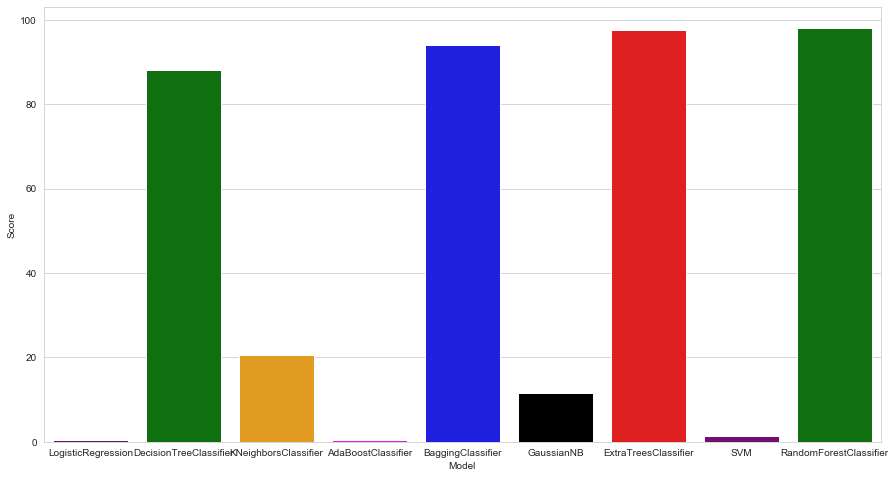

In [77]:
colors = ["purple", "green", "orange", "magenta","blue","black","red"]

sns.set_style("whitegrid")
plt.figure(figsize=(15,8))
plt.ylabel("Accuracy %")
plt.xlabel("Algorithms")
sns.barplot(x=models['Model'],y=models['Score'], palette=colors )
plt.show()

In [78]:
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,1,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,1,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,1,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,1,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,1,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [80]:
list(df.columns)

['Country',
 'Year',
 'Status',
 'Life expectancy ',
 'Adult Mortality',
 'infant deaths',
 'Alcohol',
 'percentage expenditure',
 'Hepatitis B',
 'Measles ',
 ' BMI ',
 'under-five deaths ',
 'Polio',
 'Total expenditure',
 'Diphtheria ',
 ' HIV/AIDS',
 'GDP',
 'Population',
 ' thinness  1-19 years',
 ' thinness 5-9 years',
 'Income composition of resources',
 'Schooling']

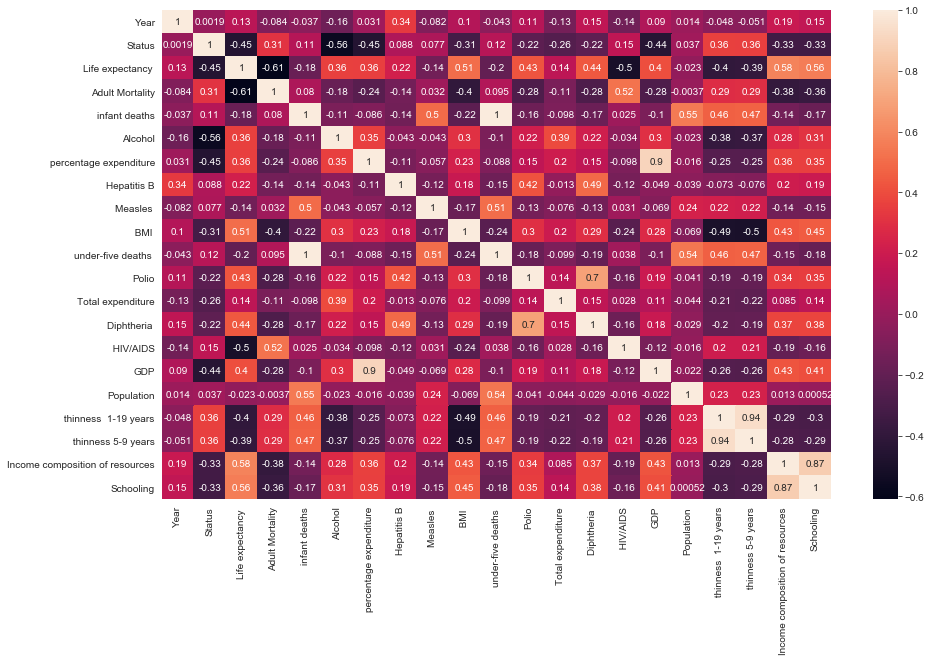

In [81]:
plt.figure(figsize=(15,9))
sns.heatmap(df.corr(),annot=True)

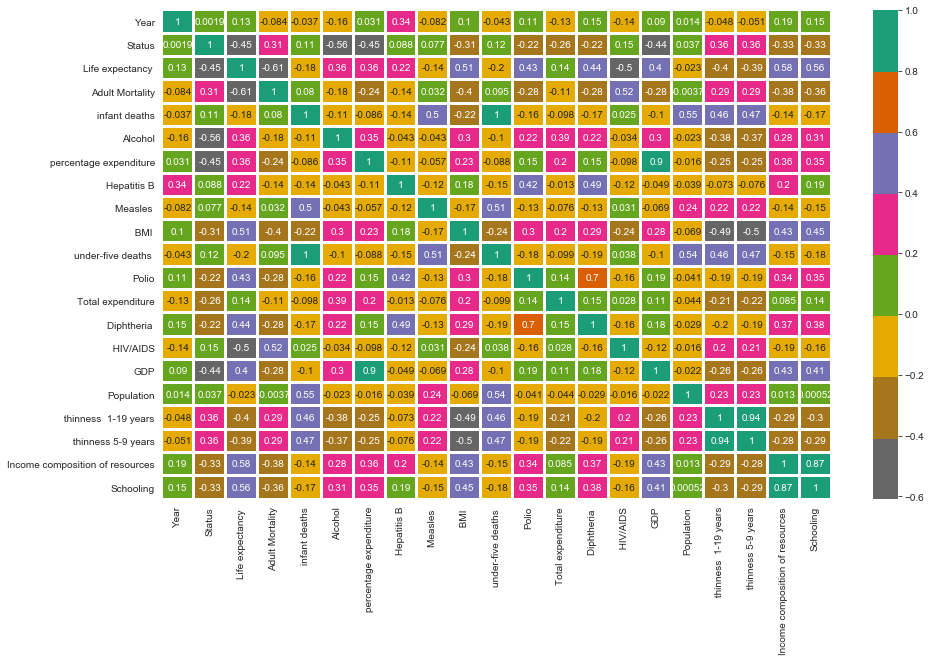

In [82]:
plt.figure(figsize=(15,9))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(df.corr(),annot=True,cmap='Dark2_r',linewidths=2)
plt.show()

In [83]:
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

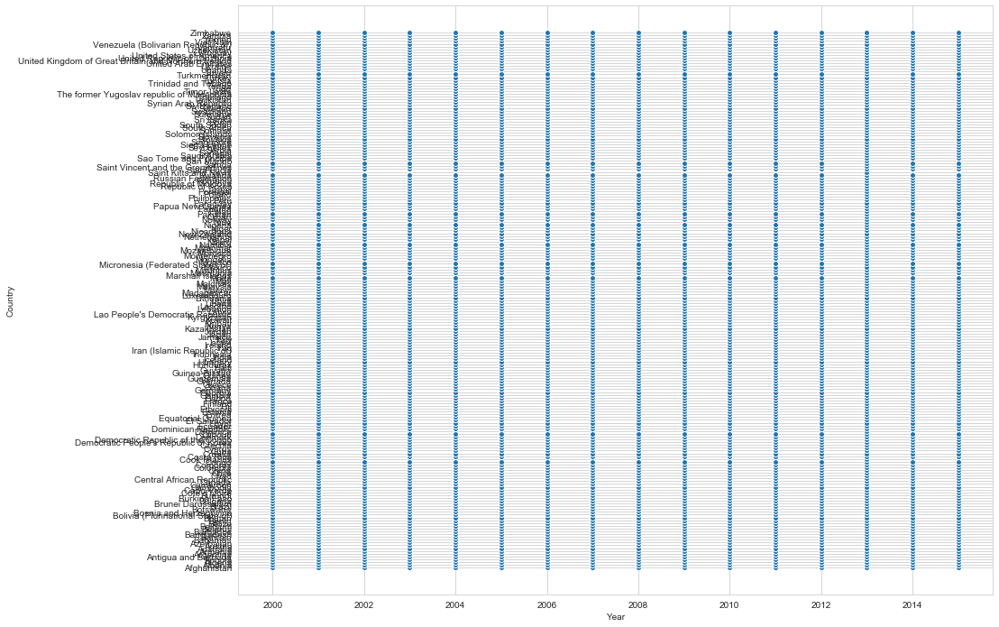

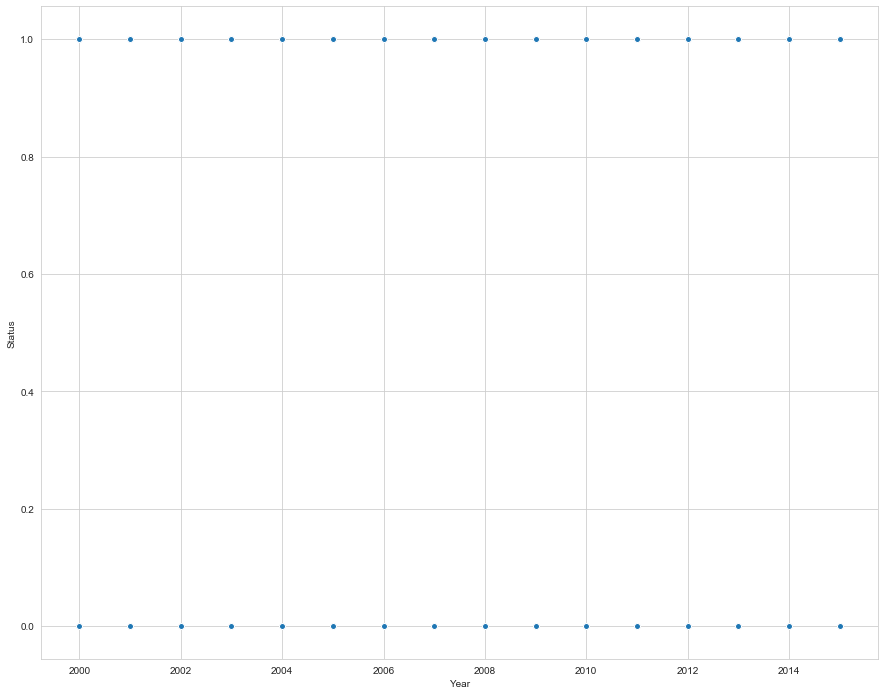

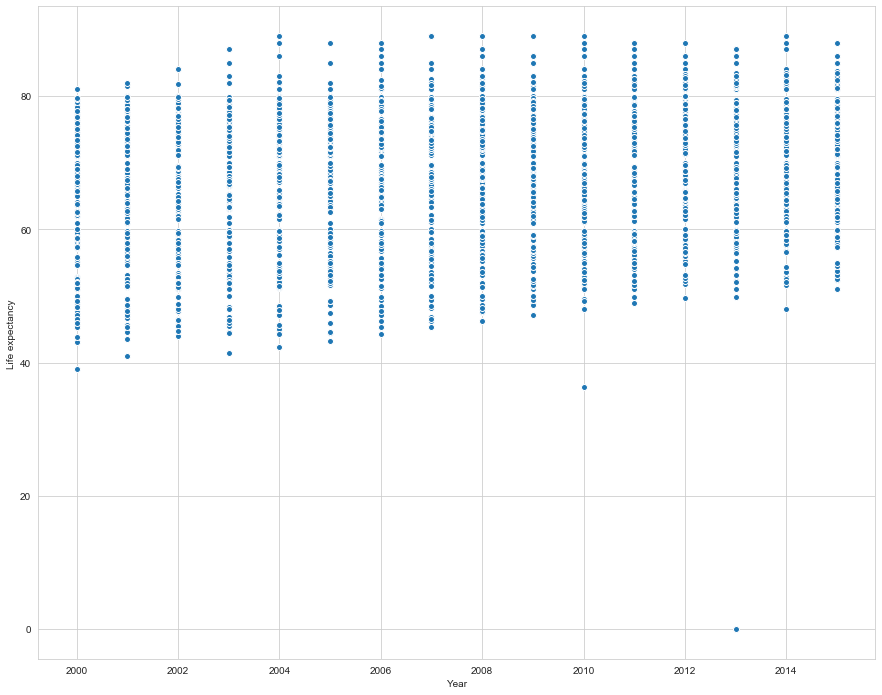

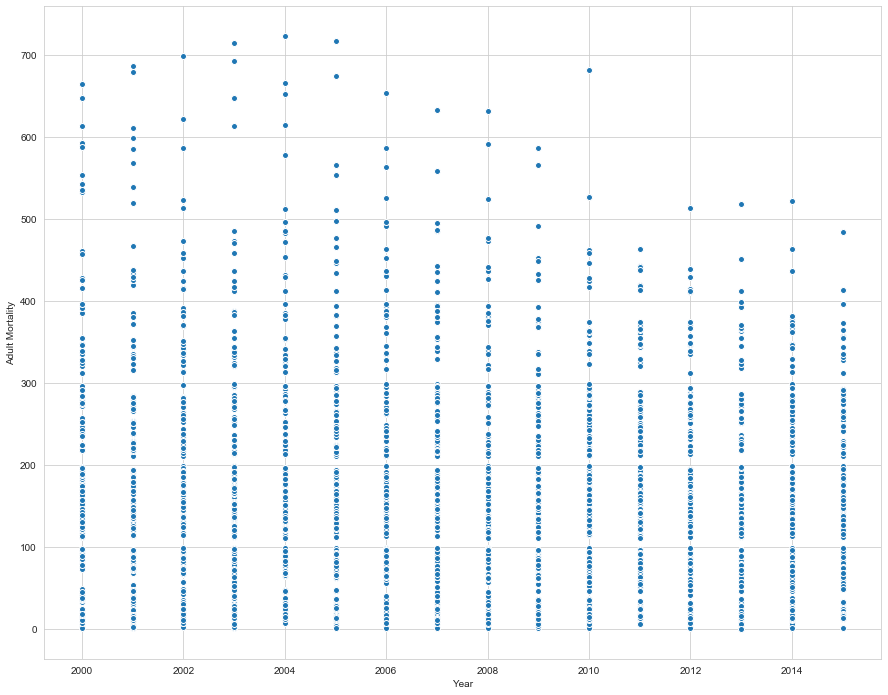

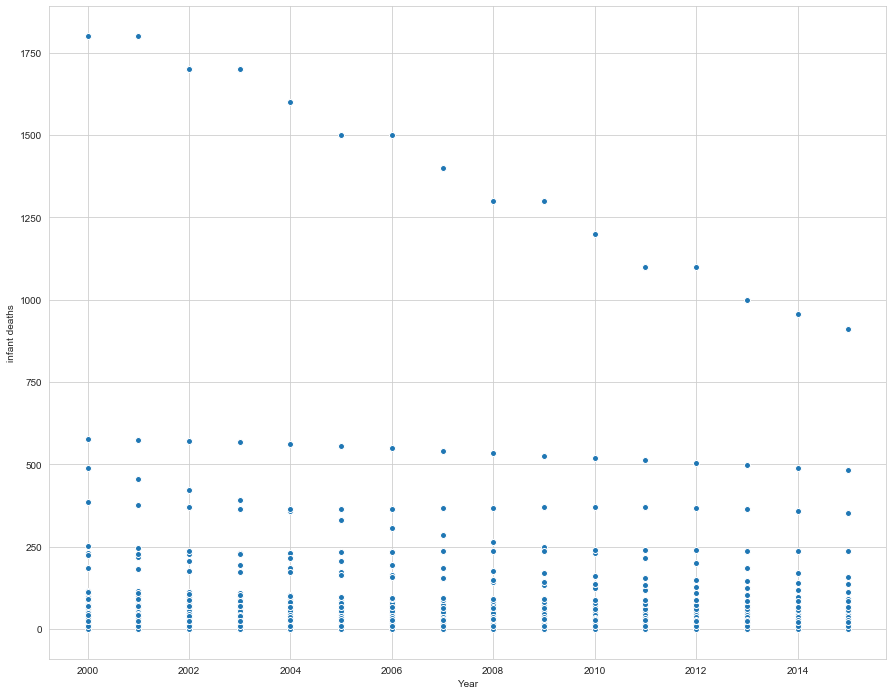

...

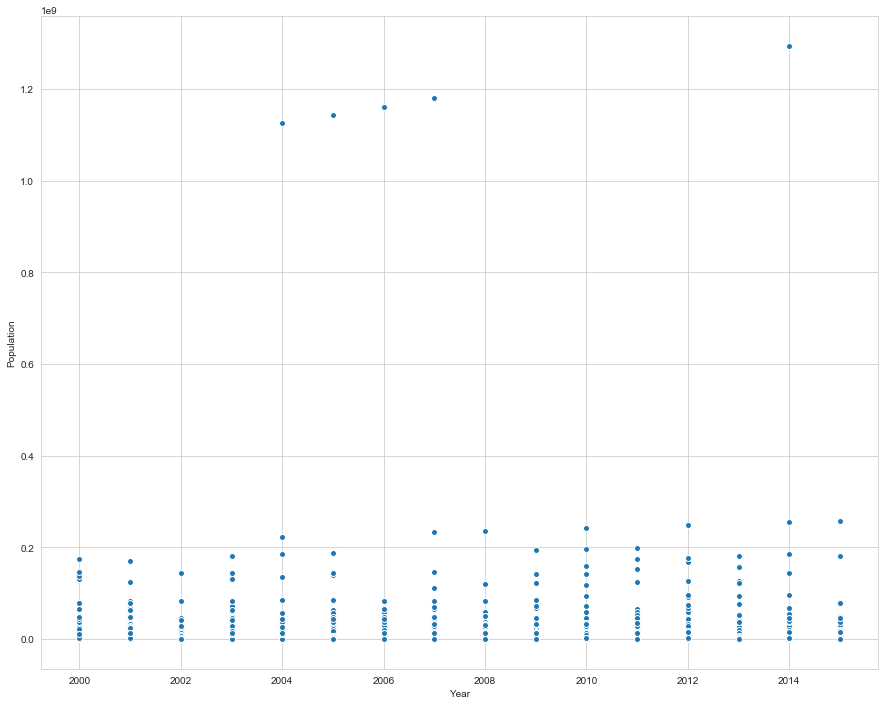

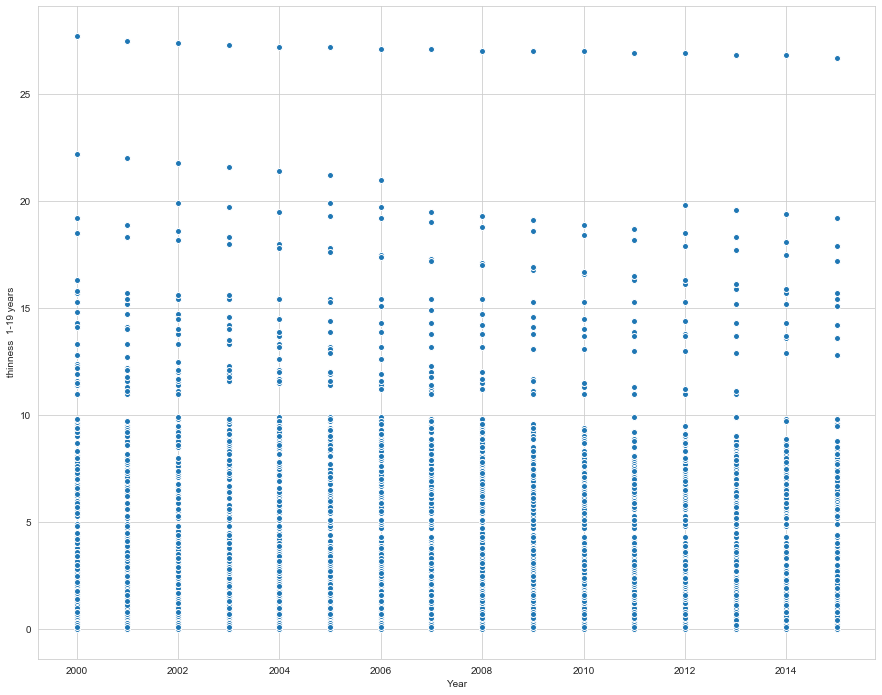

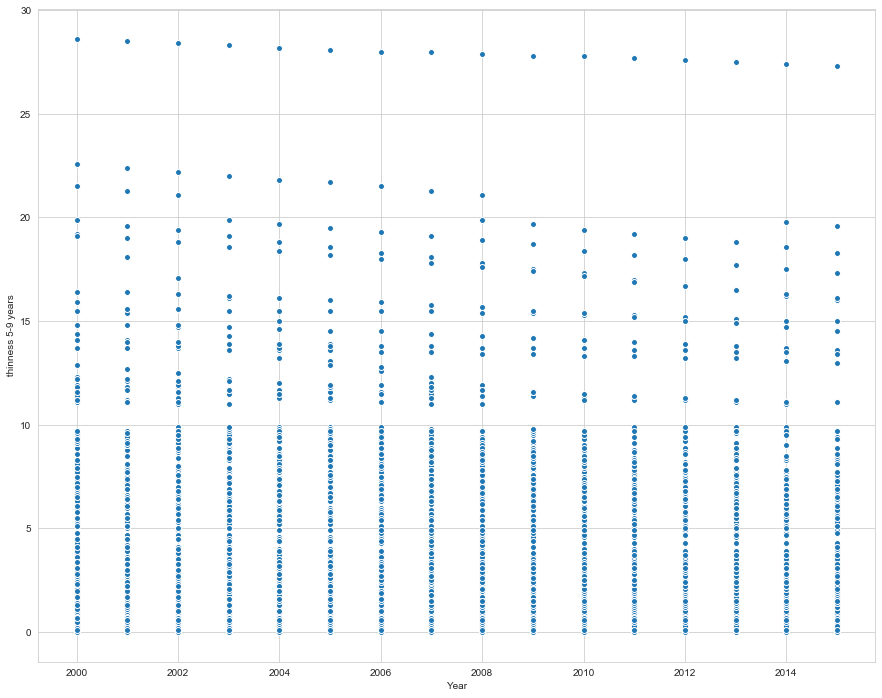

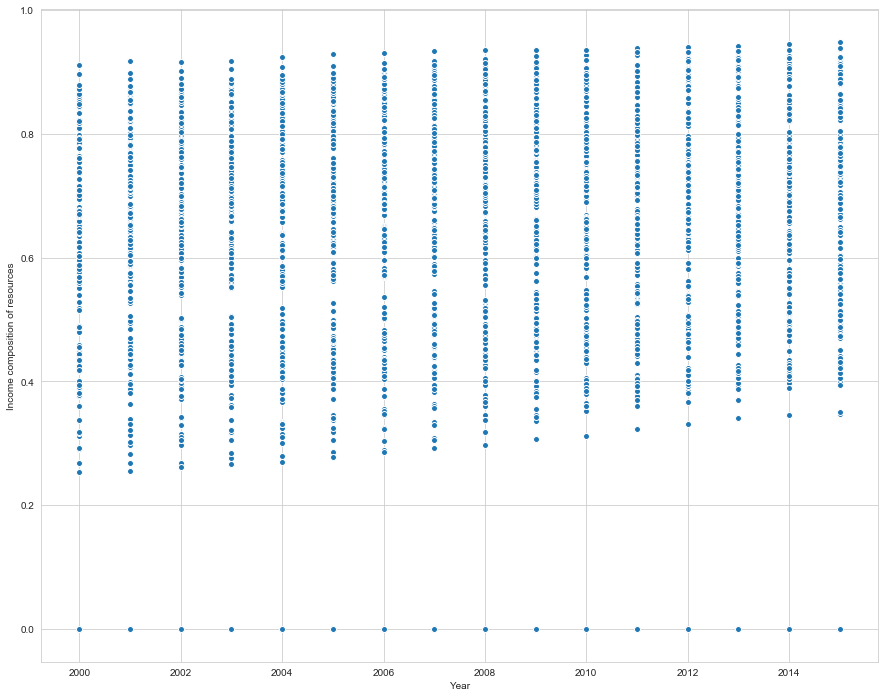

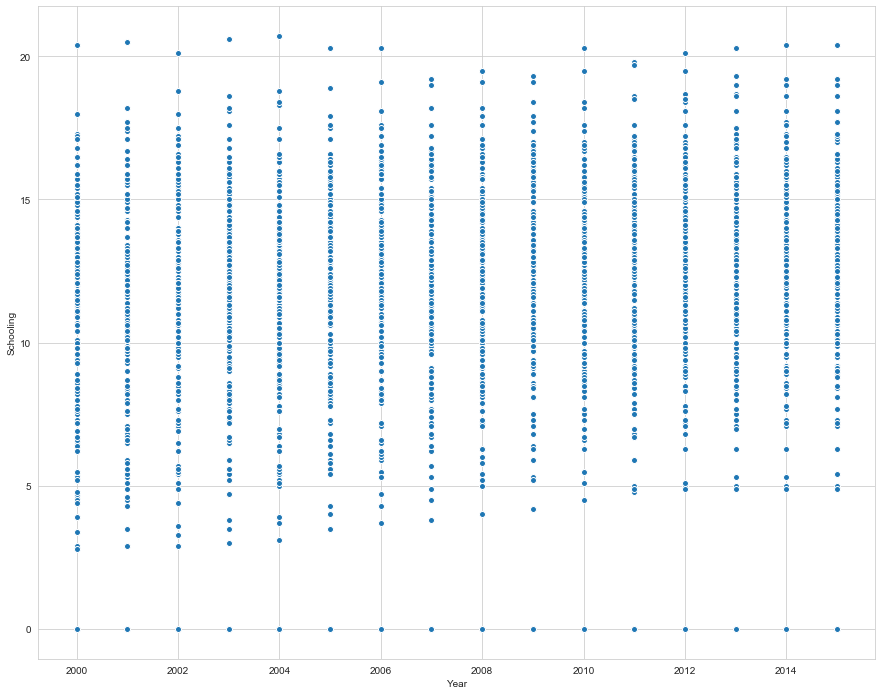

In [88]:
for i in [ 'Country', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling']:
    plt.figure(figsize=(15,12))
    sns.scatterplot(x=df.Year,y=df[i],data=df,linewidth=1)
    plt.show()

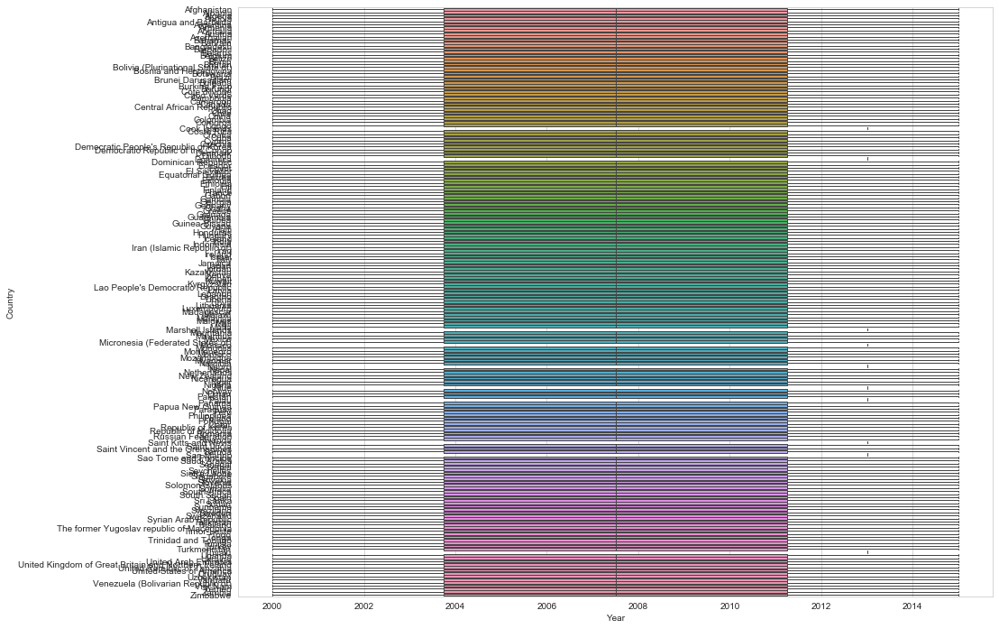

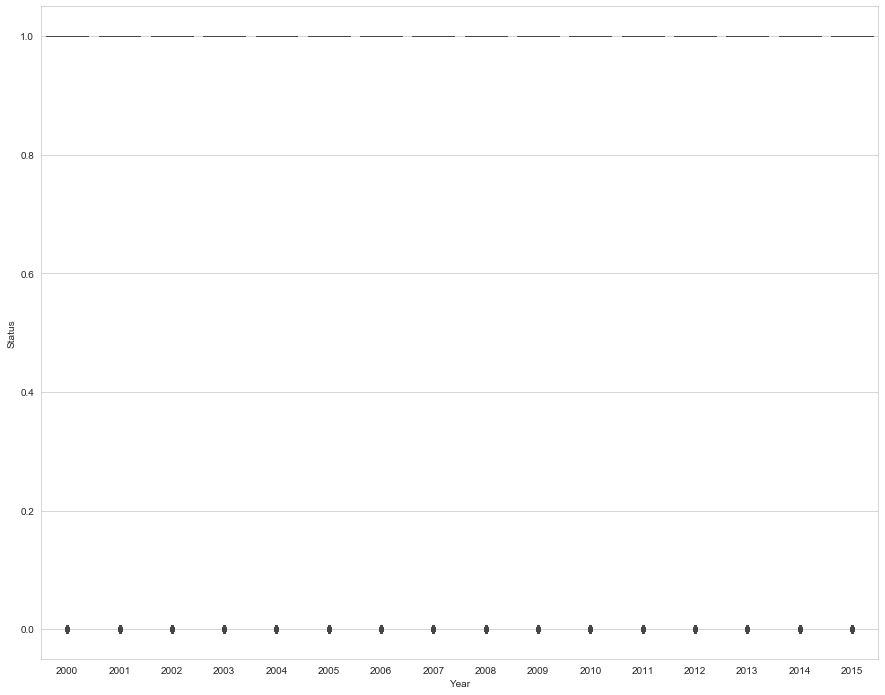

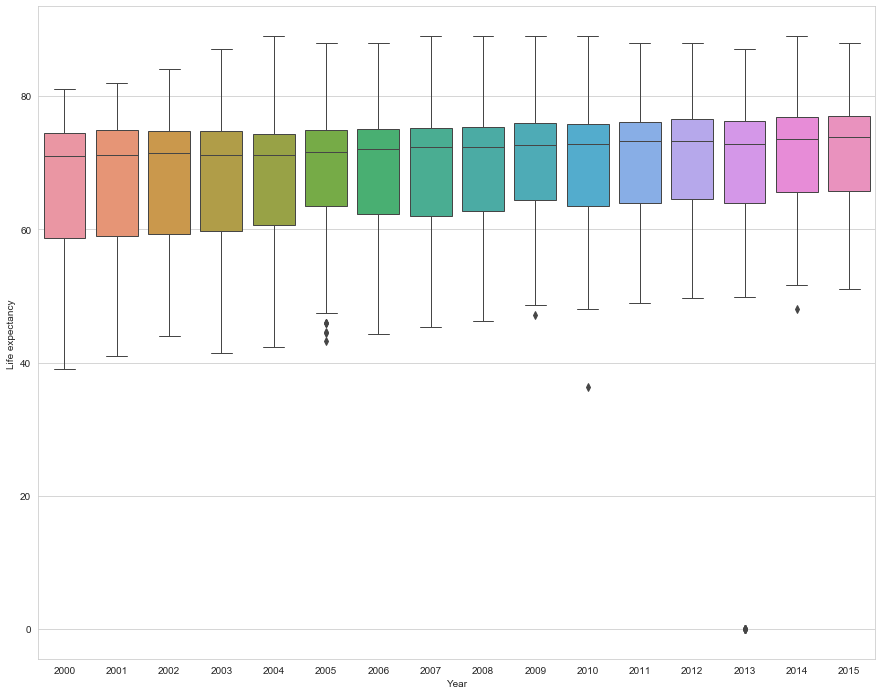

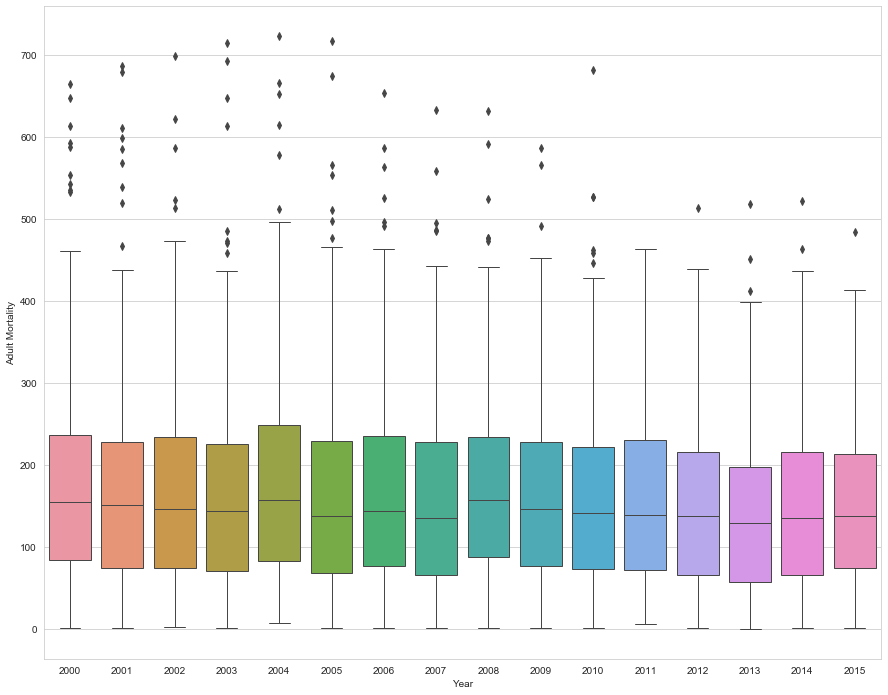

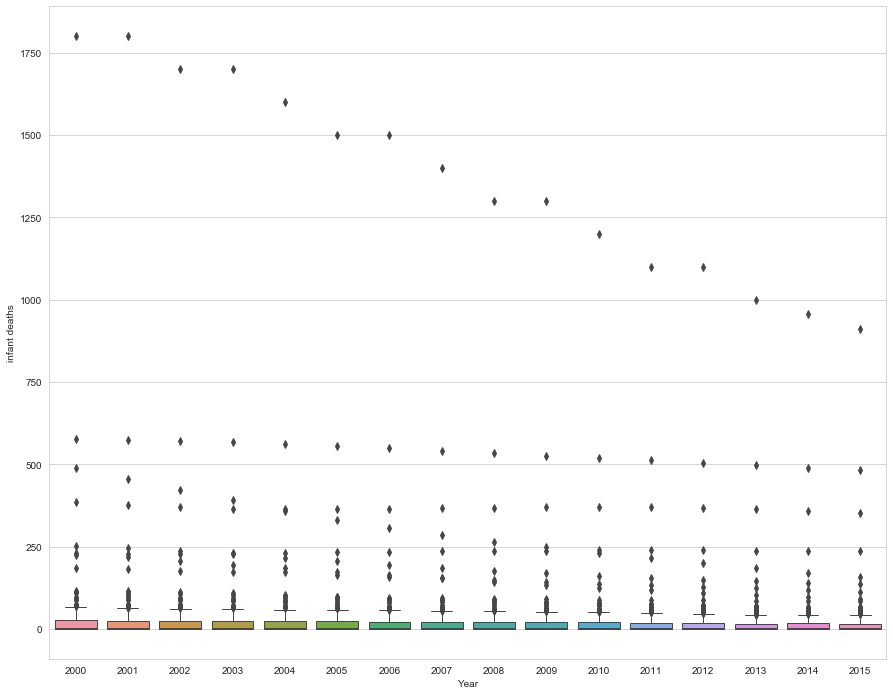

...

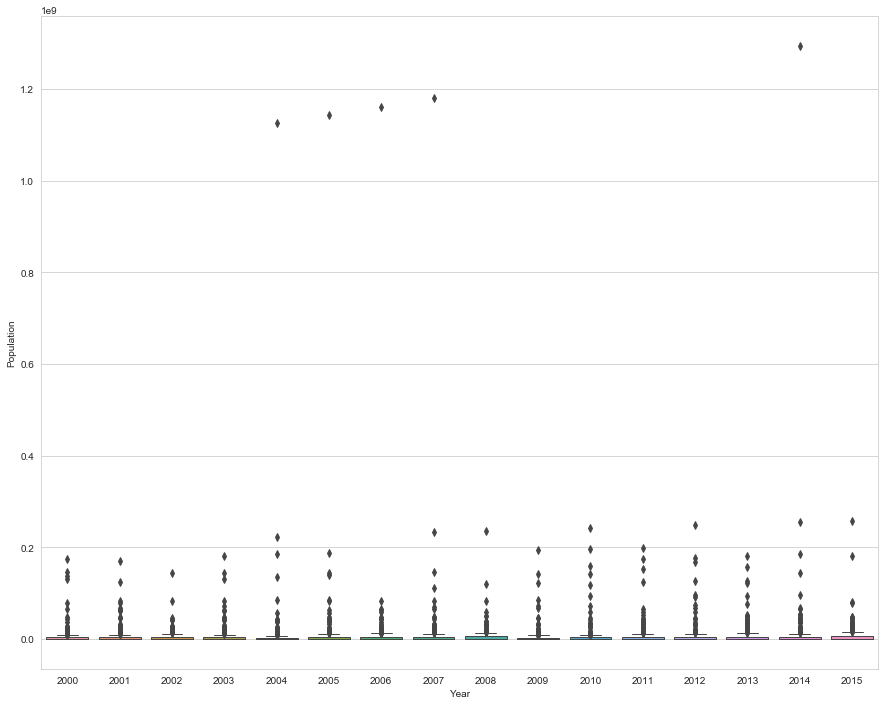

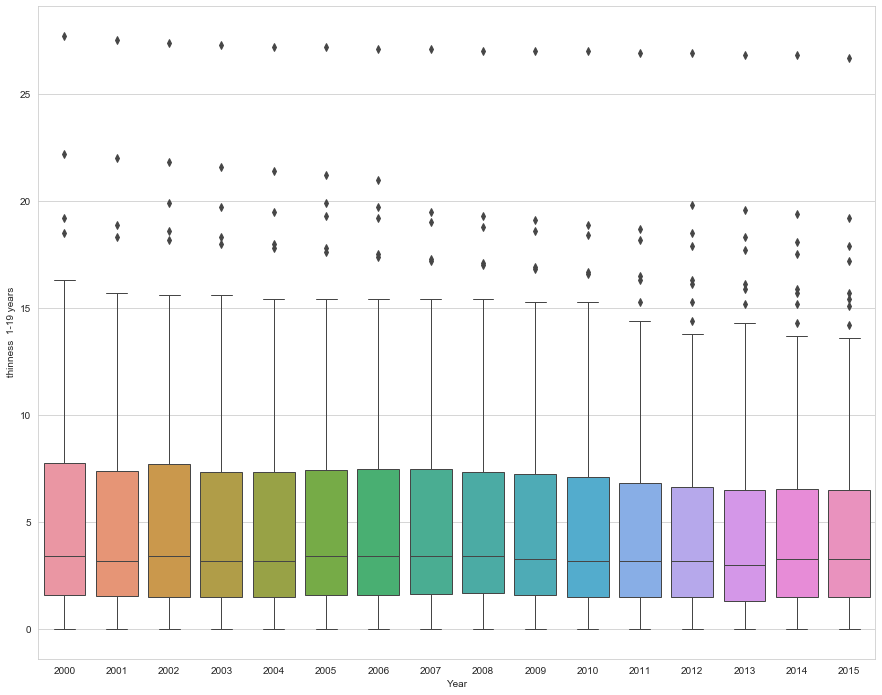

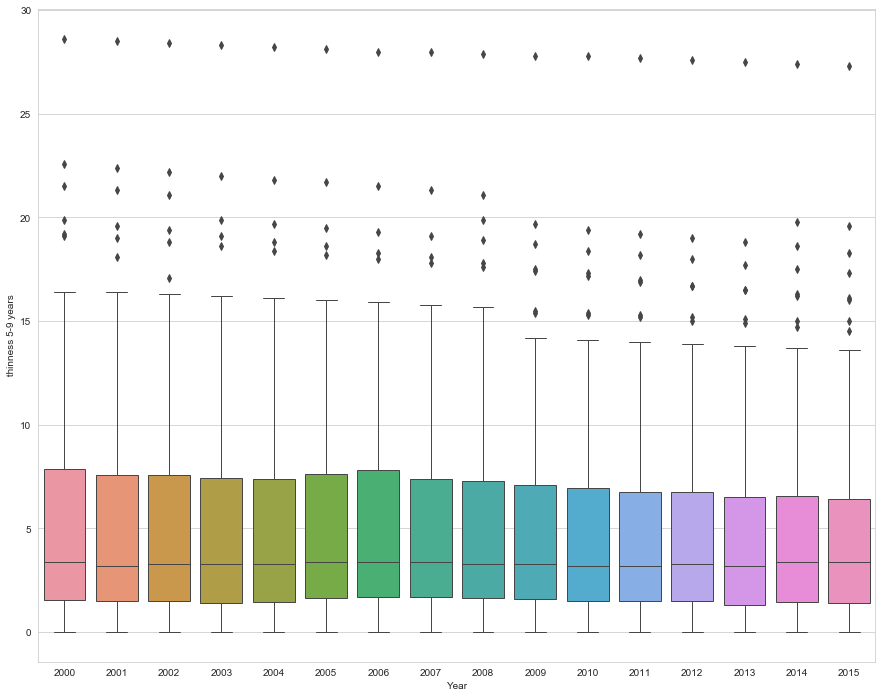

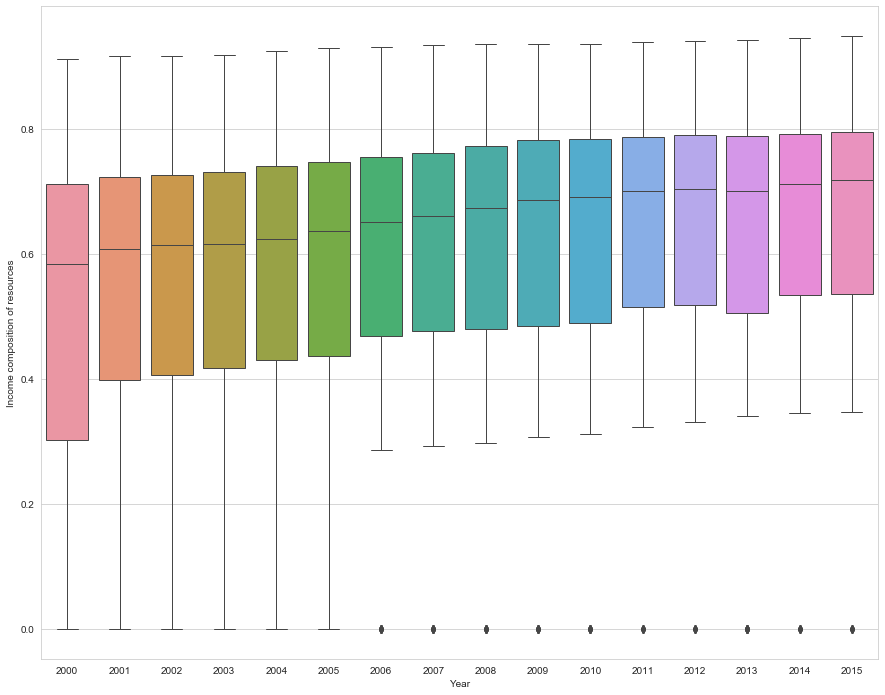

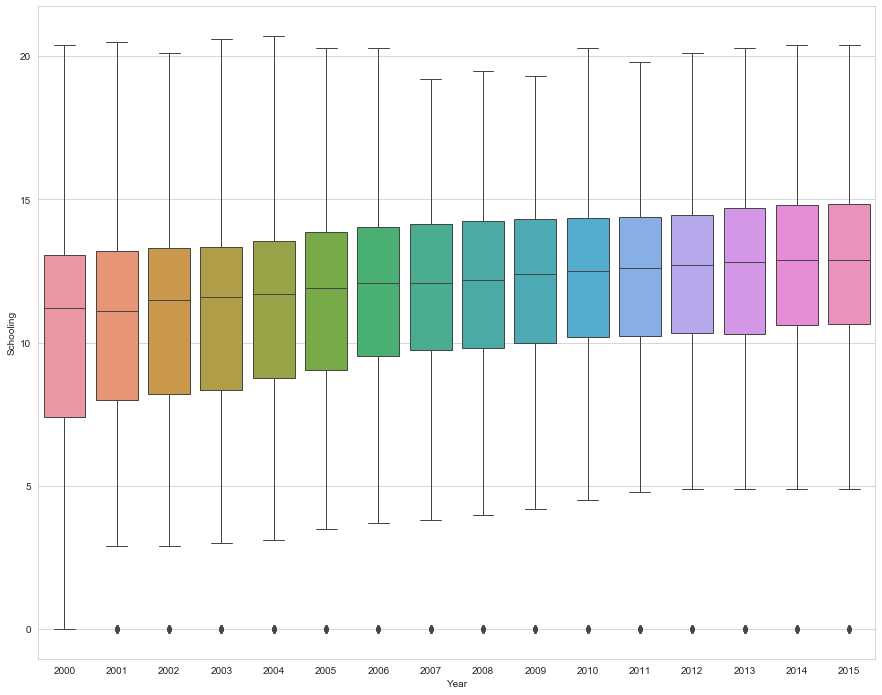

In [87]:
for i in [ 'Country', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling']:
    plt.figure(figsize=(15,12))
    sns.boxplot(x=df.Year,y=df[i],data=df,linewidth=1)
    plt.show()

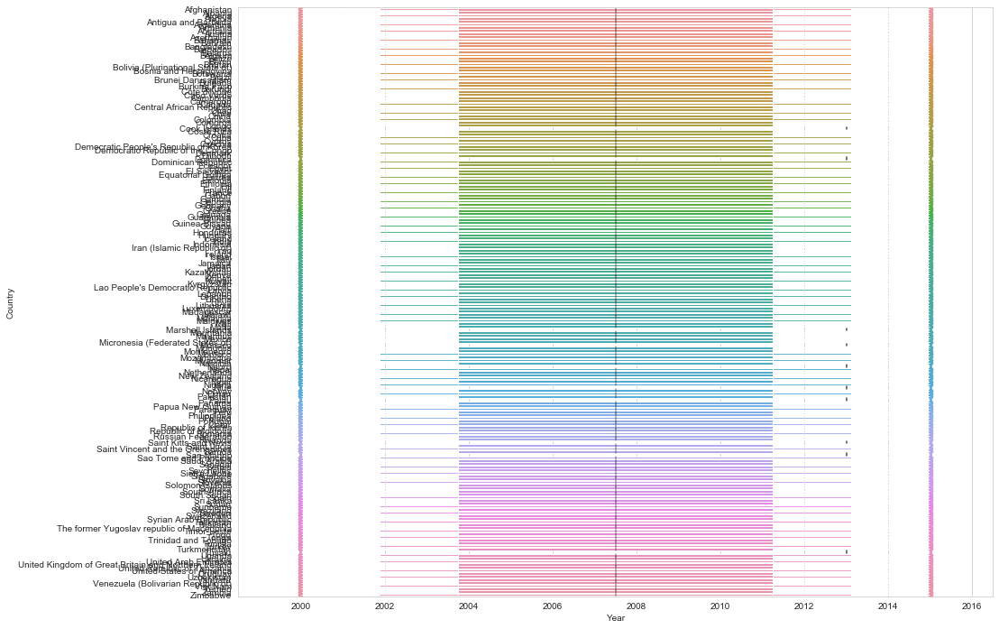

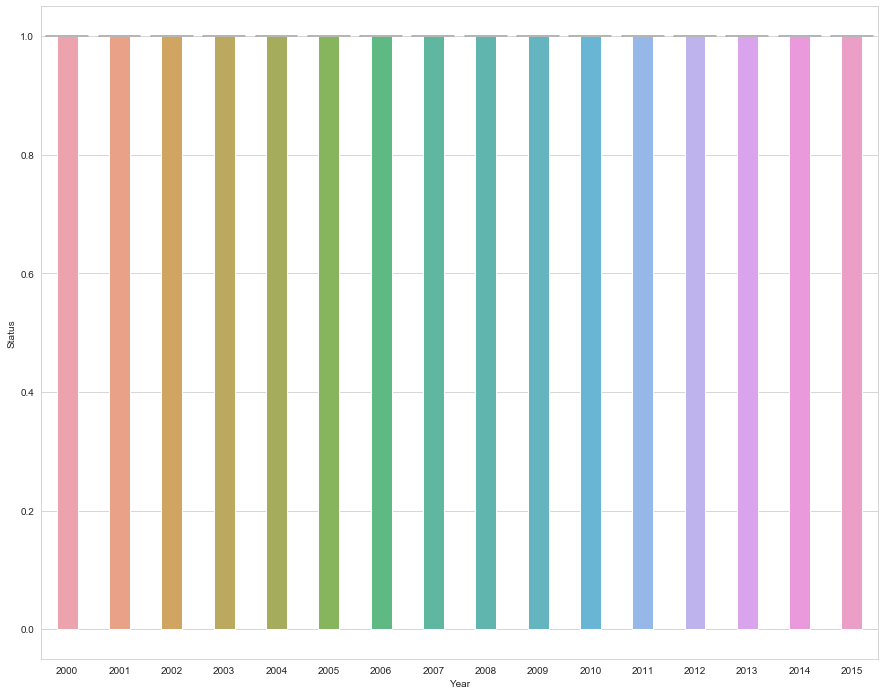

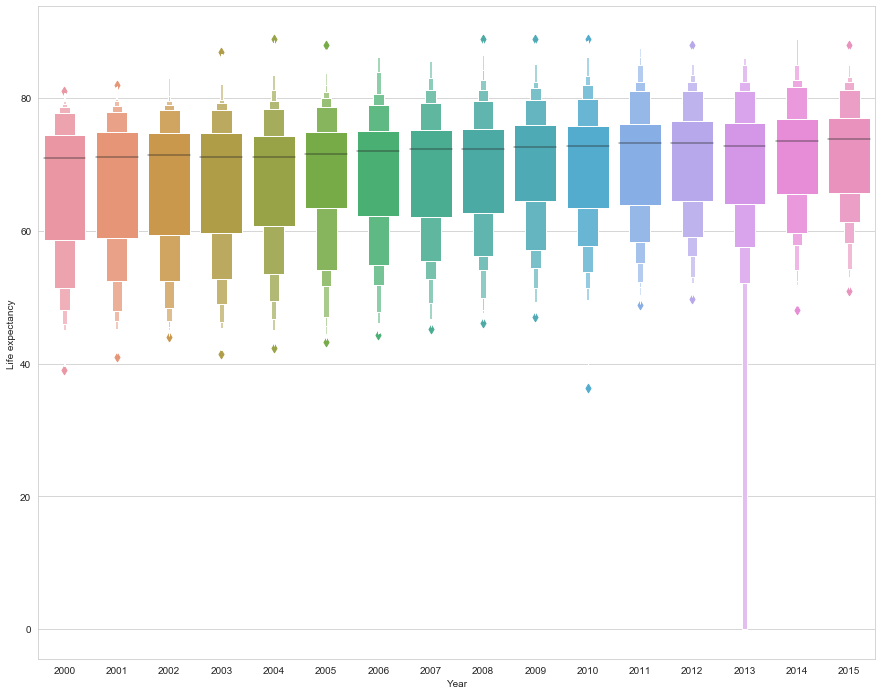

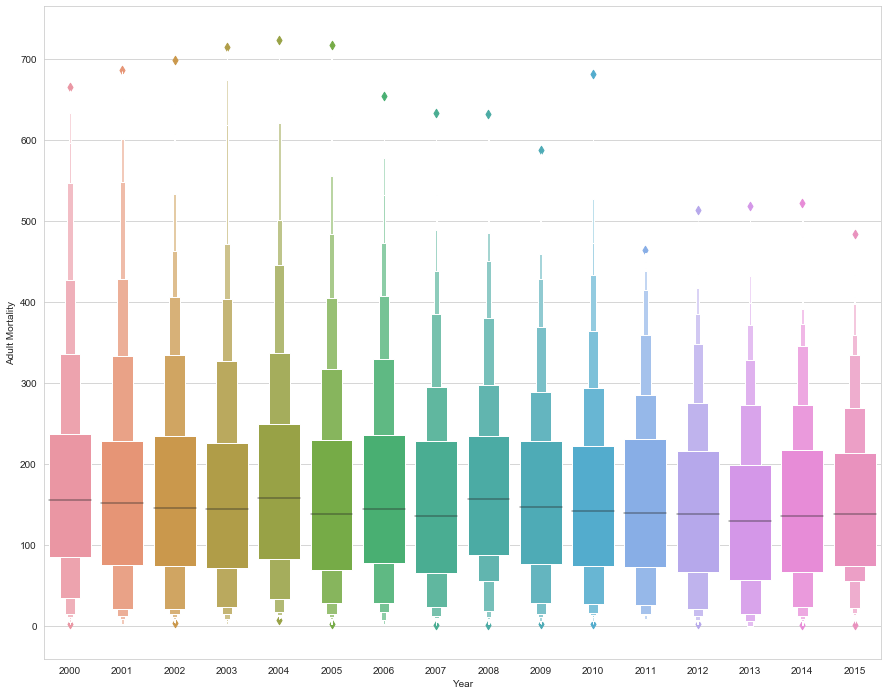

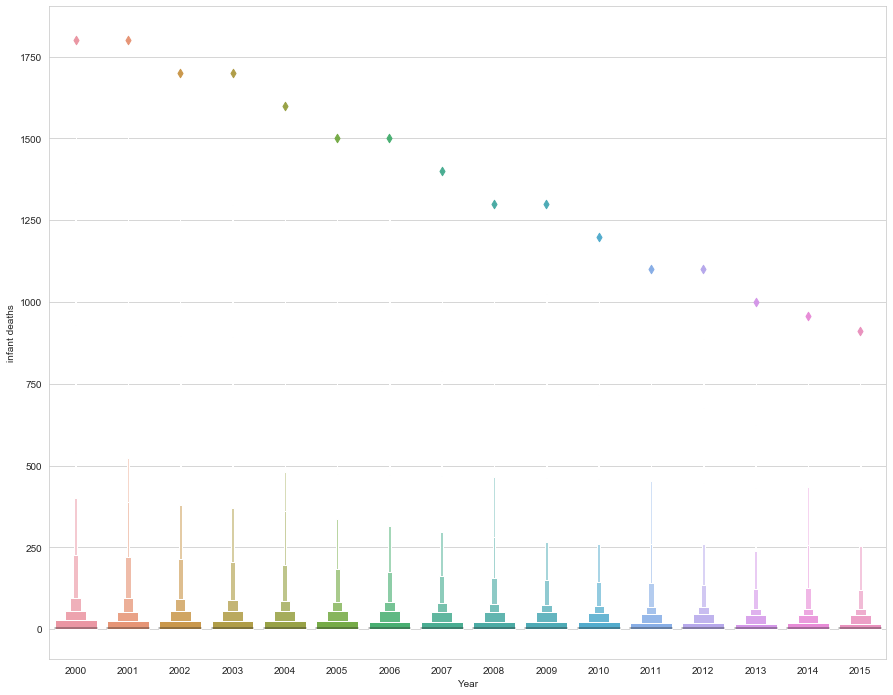

...

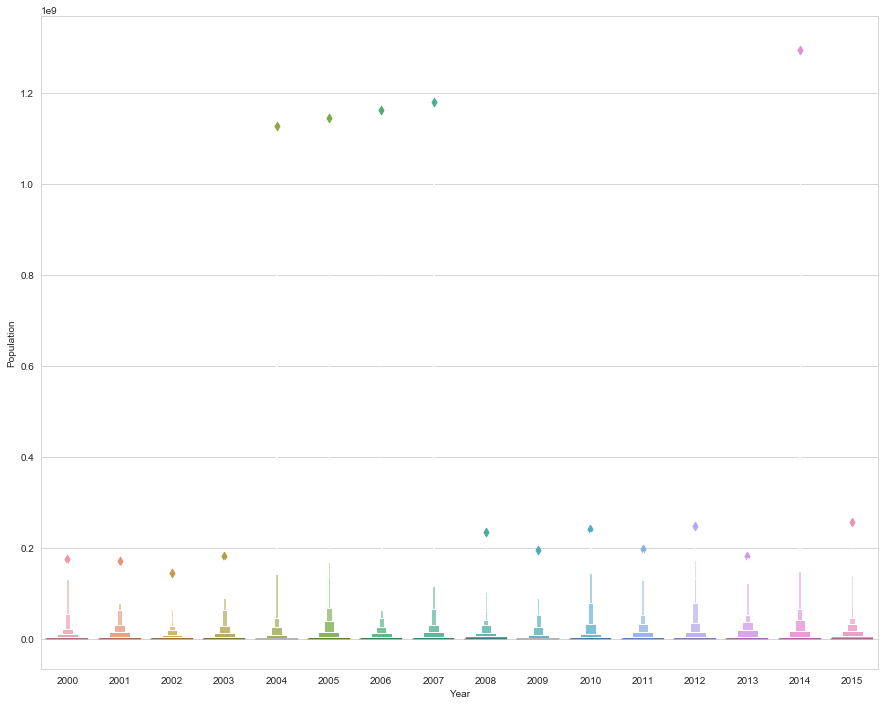

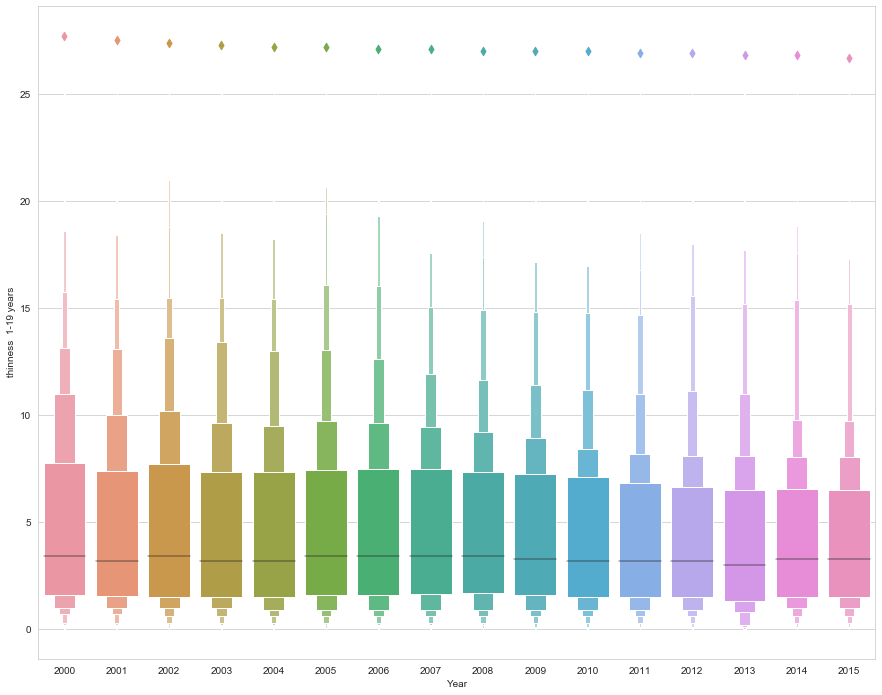

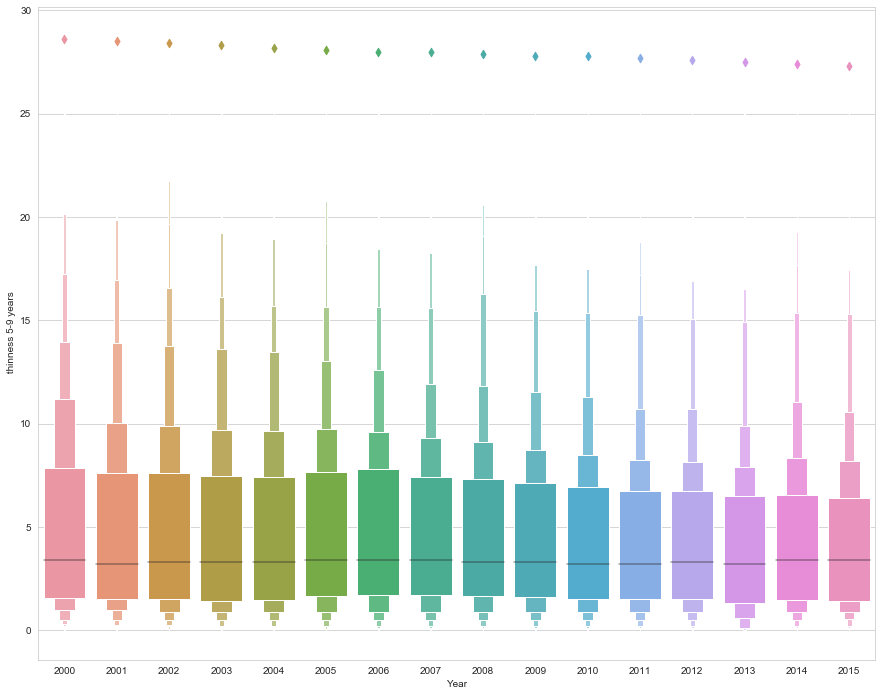

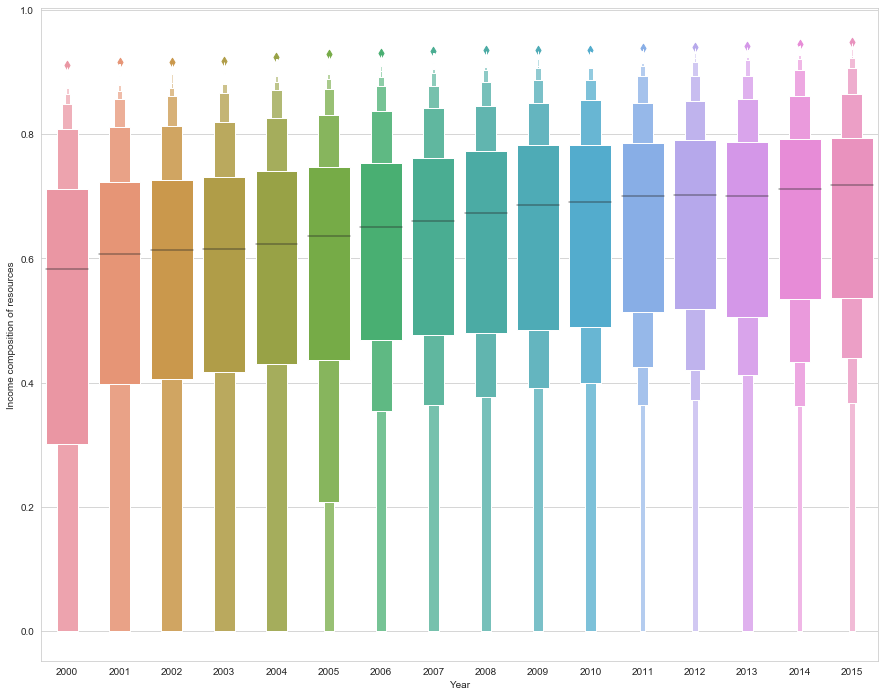

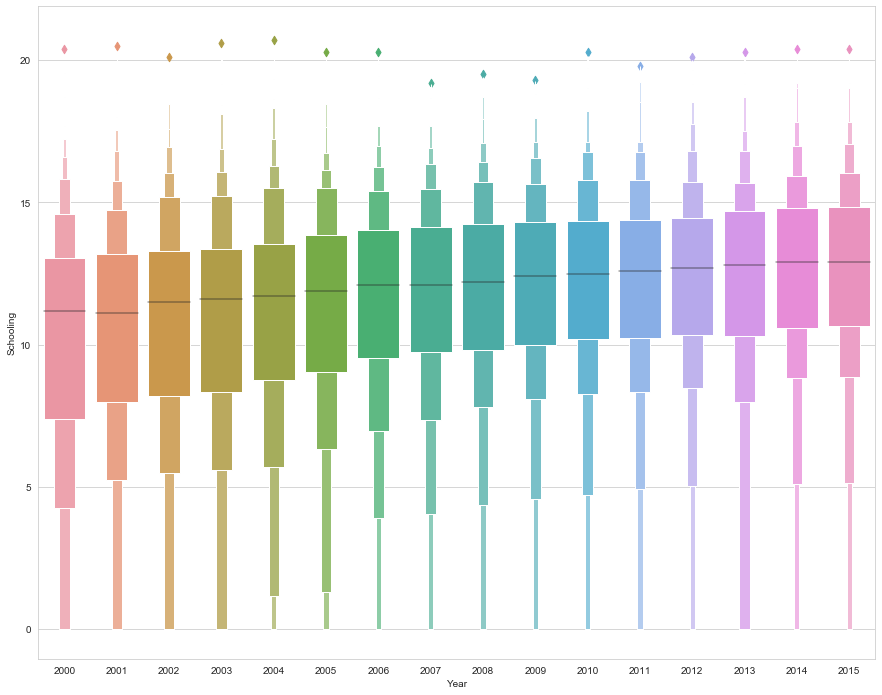

In [89]:
for i in [ 'Country', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling']:
    plt.figure(figsize=(15,12))
    sns.boxenplot(x=df.Year,y=df[i],data=df,linewidth=1)
    plt.show()

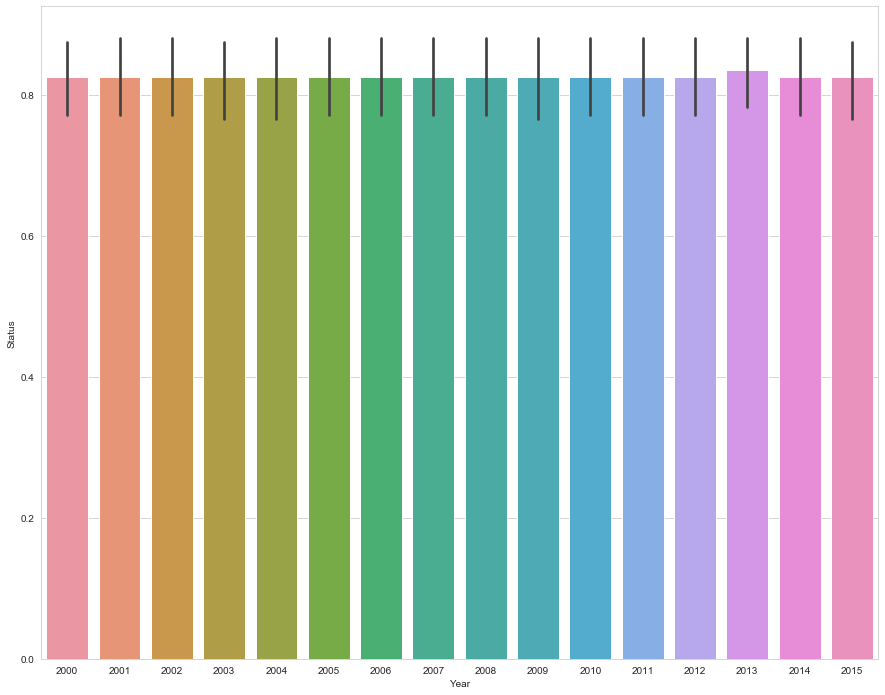

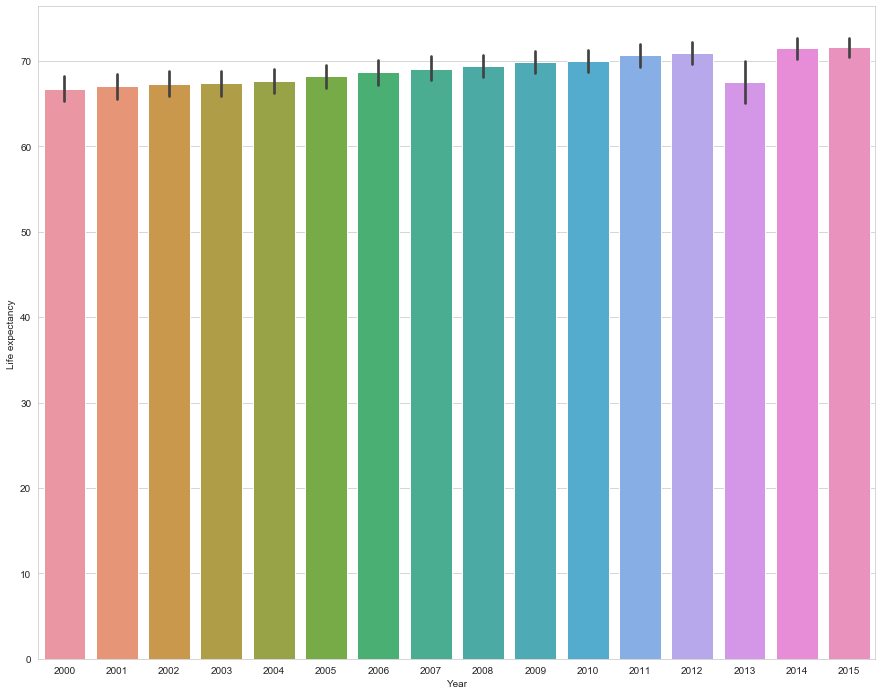

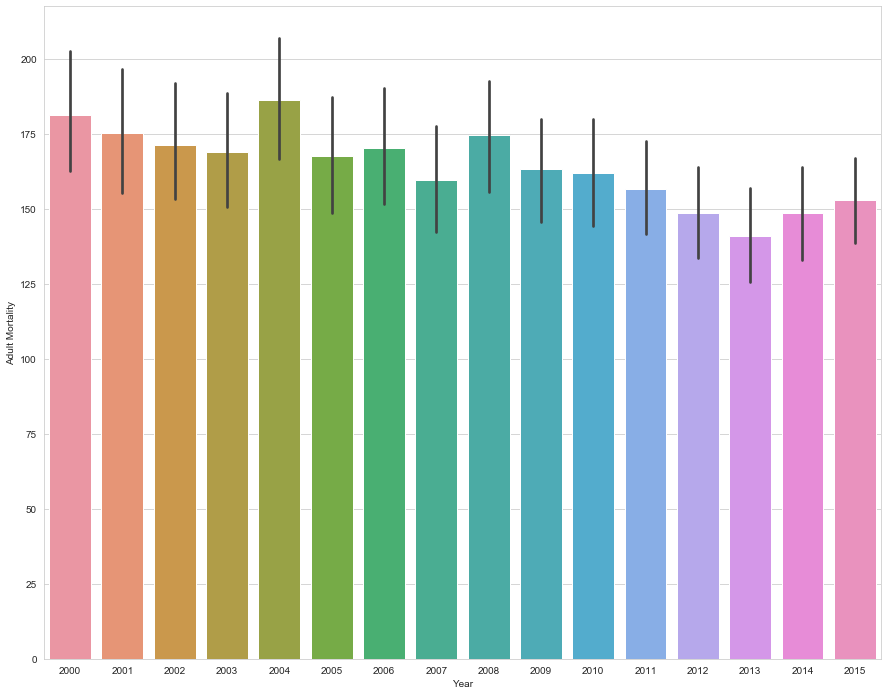

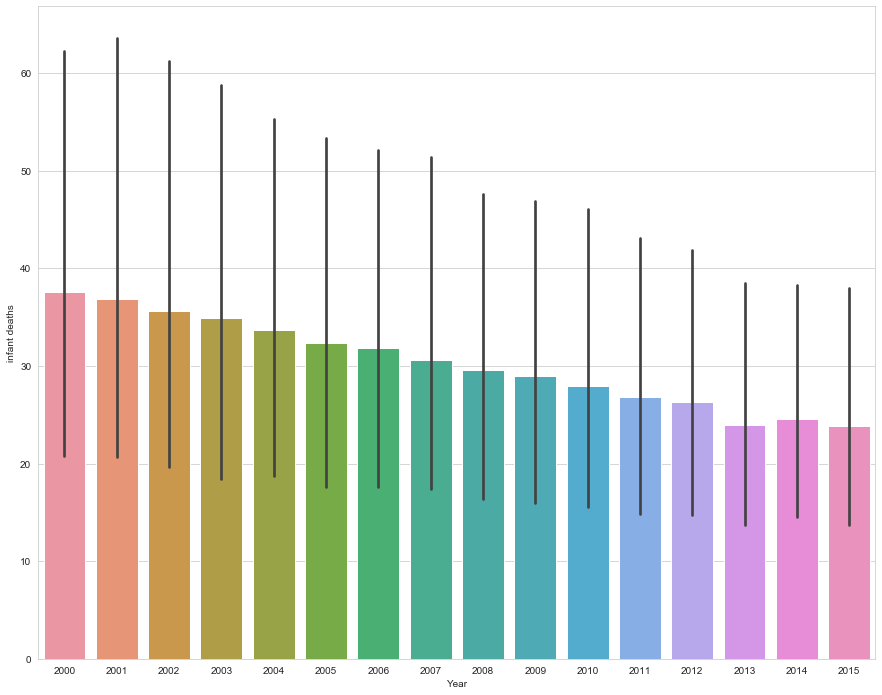

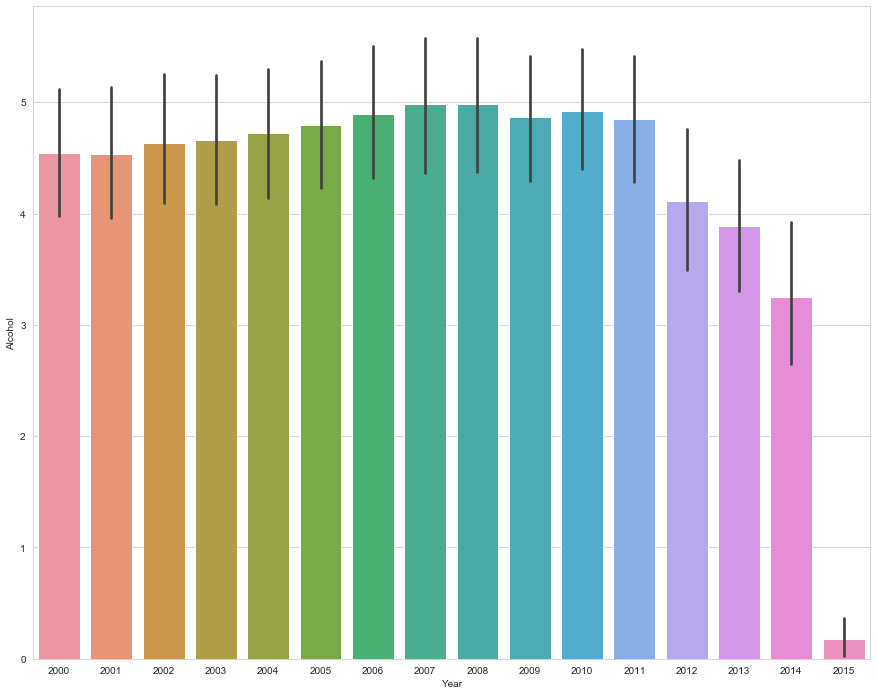

...

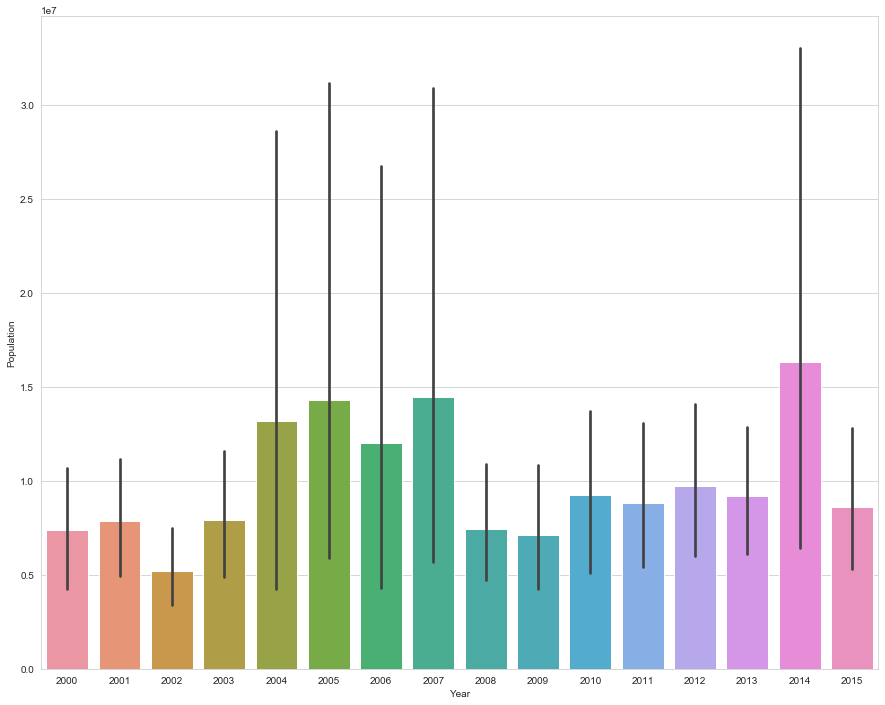

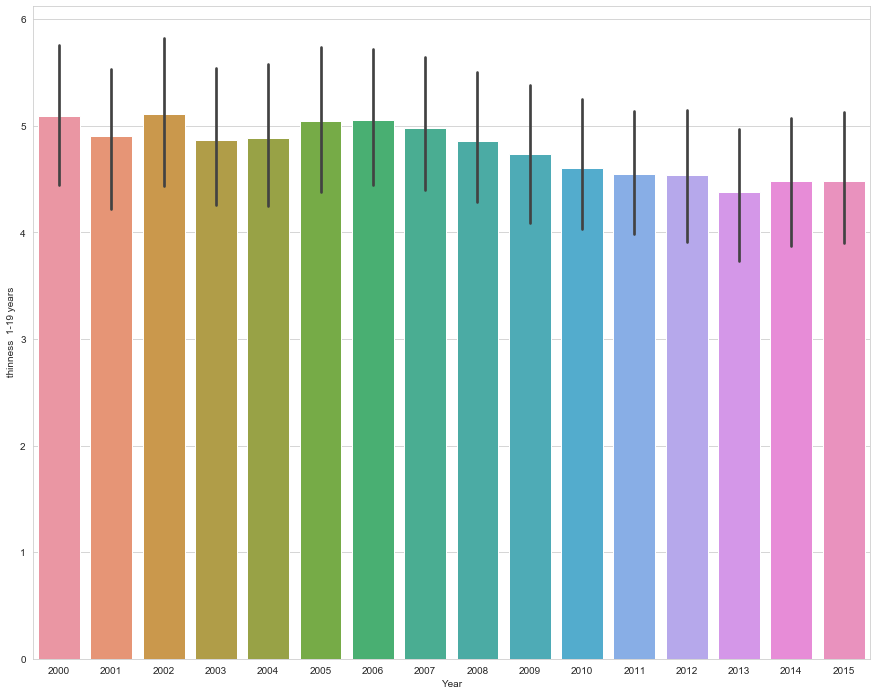

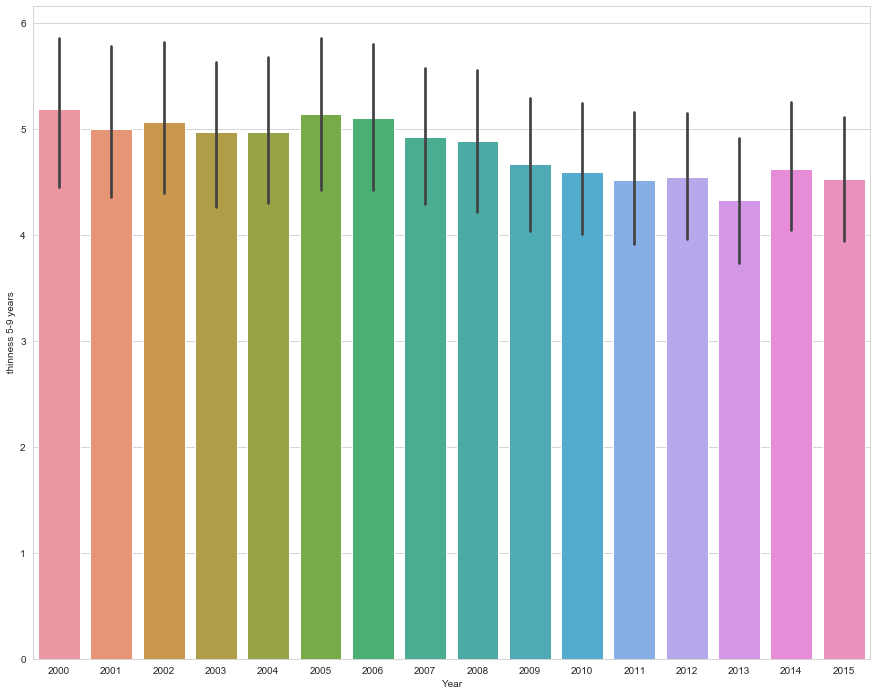

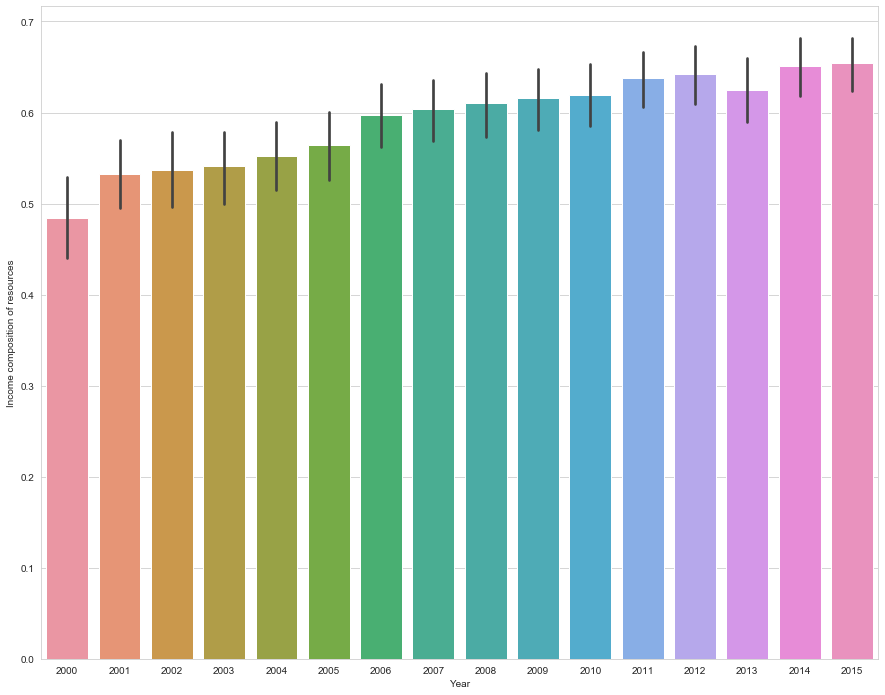

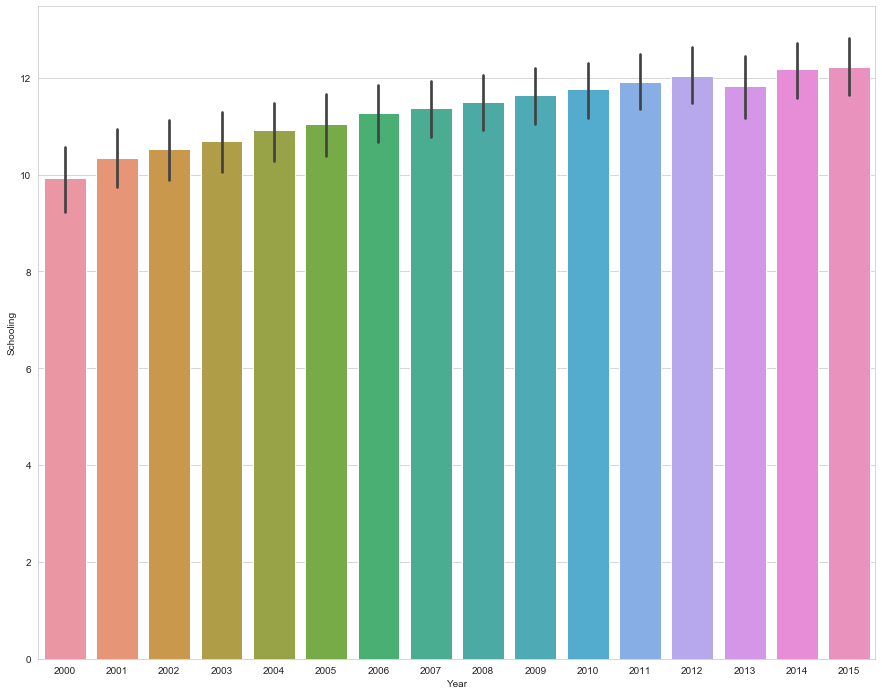

In [96]:
for i in [ 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling']:
    plt.figure(figsize=(15,12))
    sns.barplot(x=df.Year,y=df[i],data=df,linewidth=1)
    plt.show()

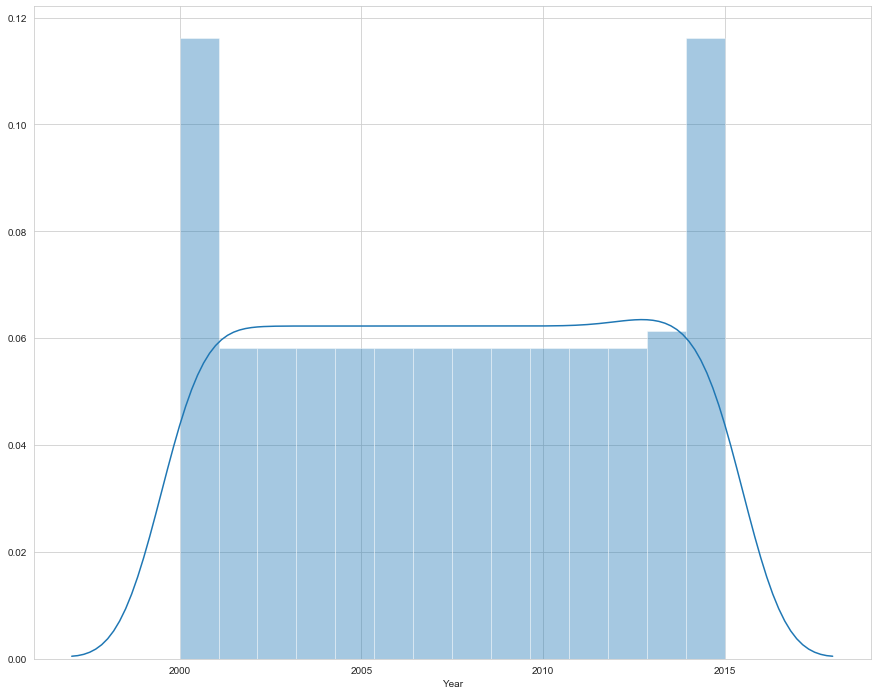

In [97]:
plt.figure(figsize=(15,12))
sns.distplot(df['Year'])

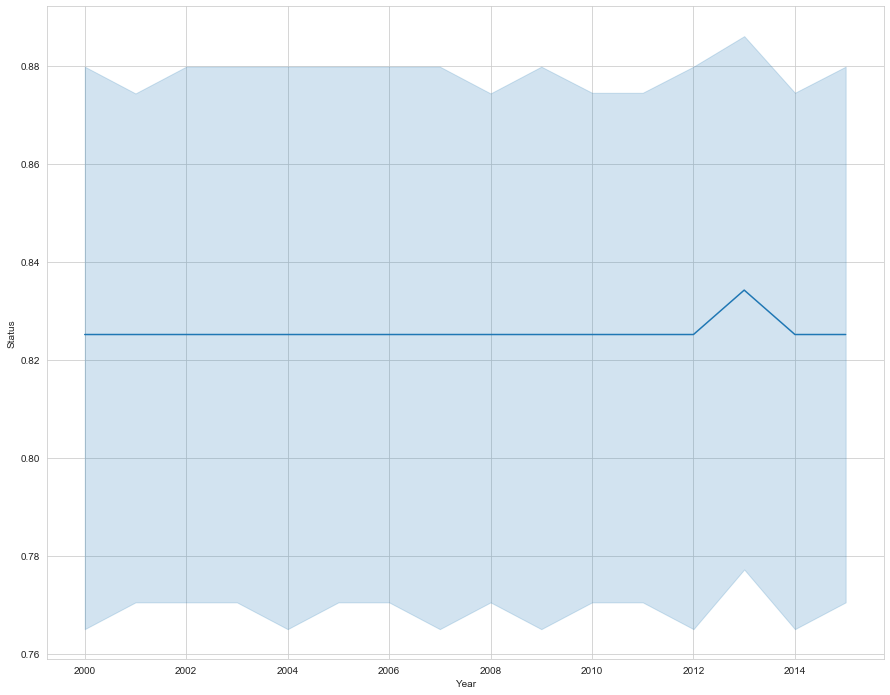

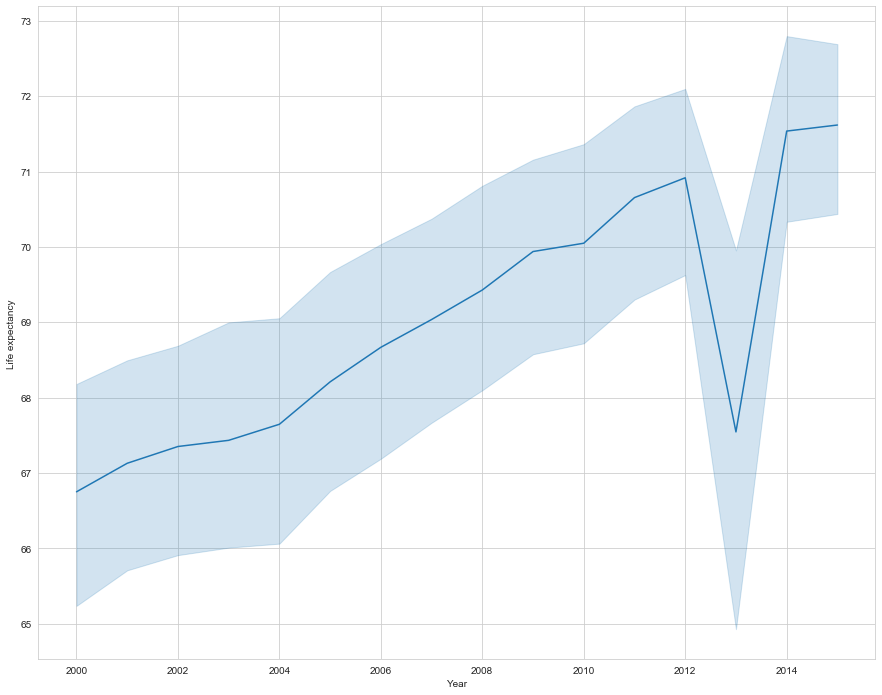

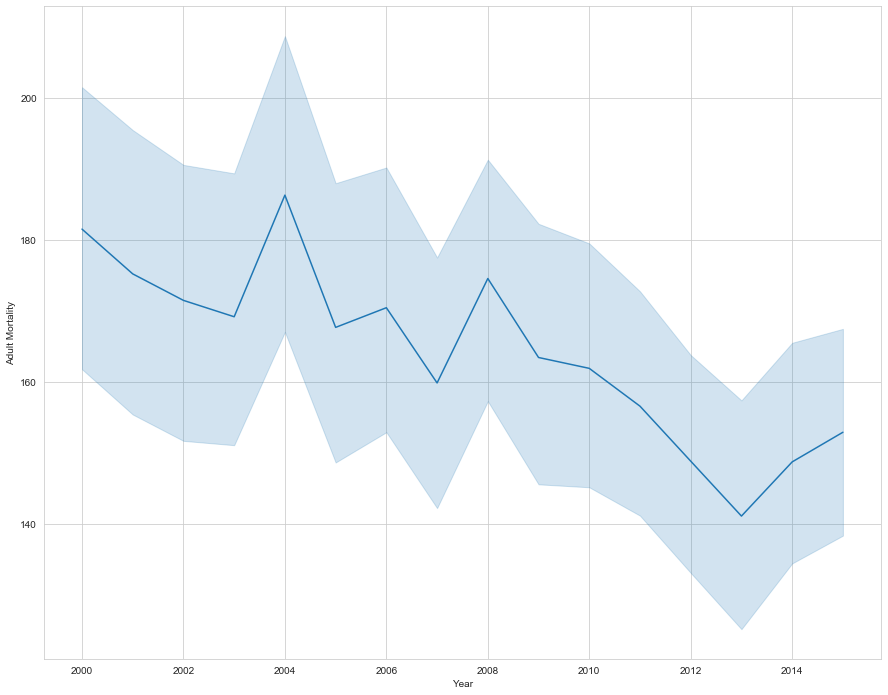

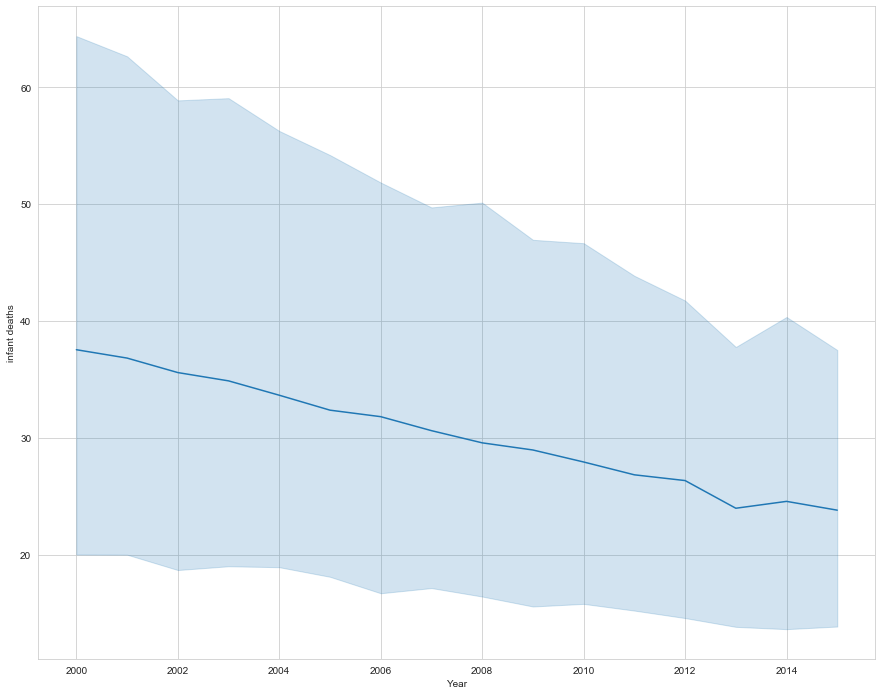

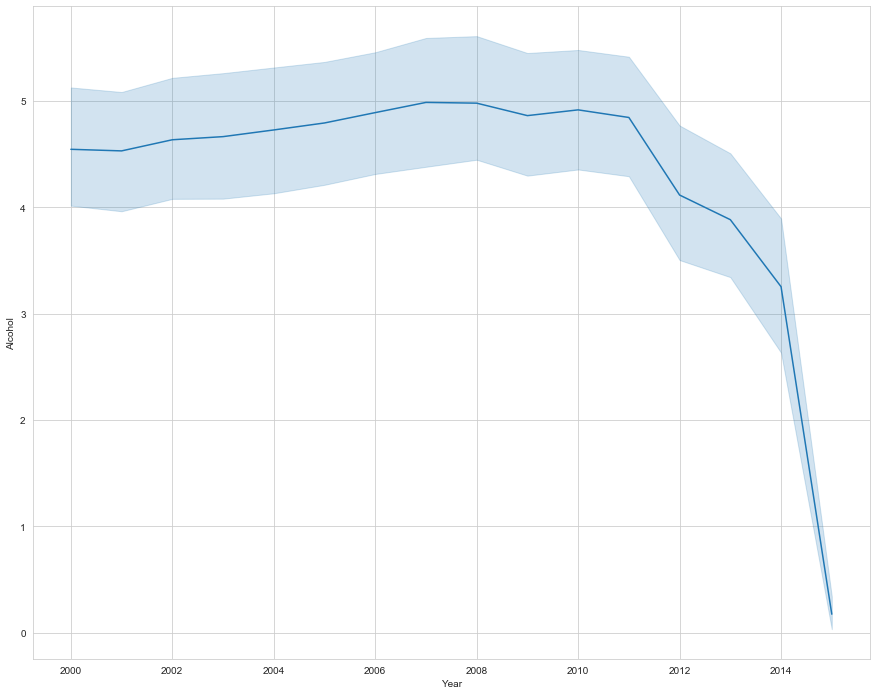

...

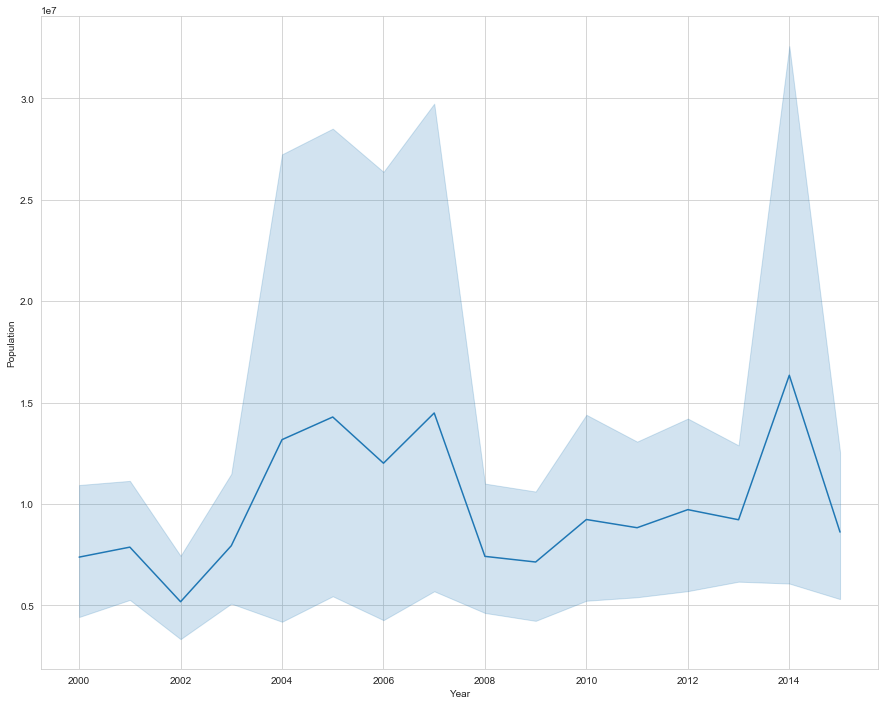

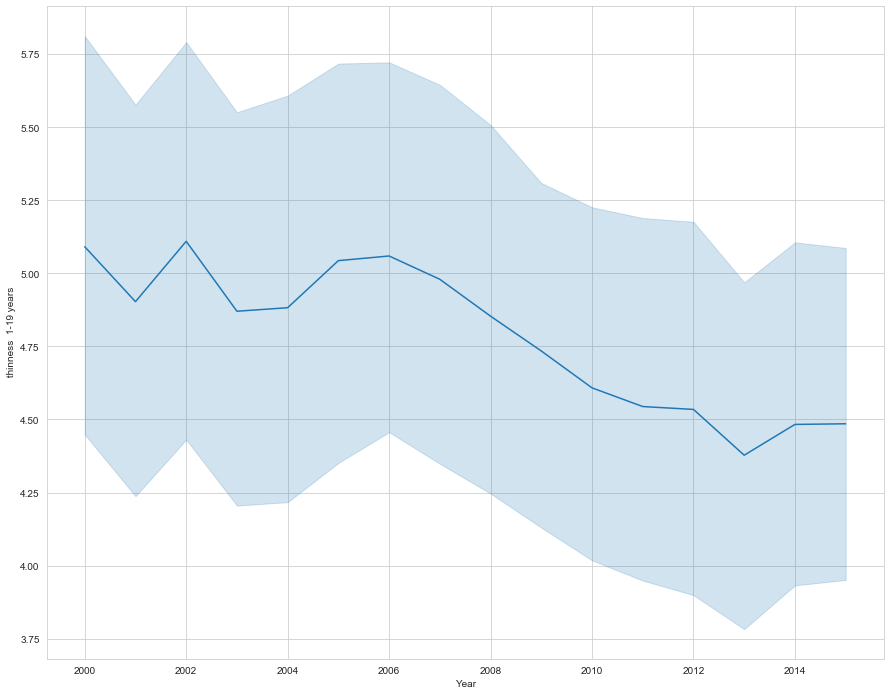

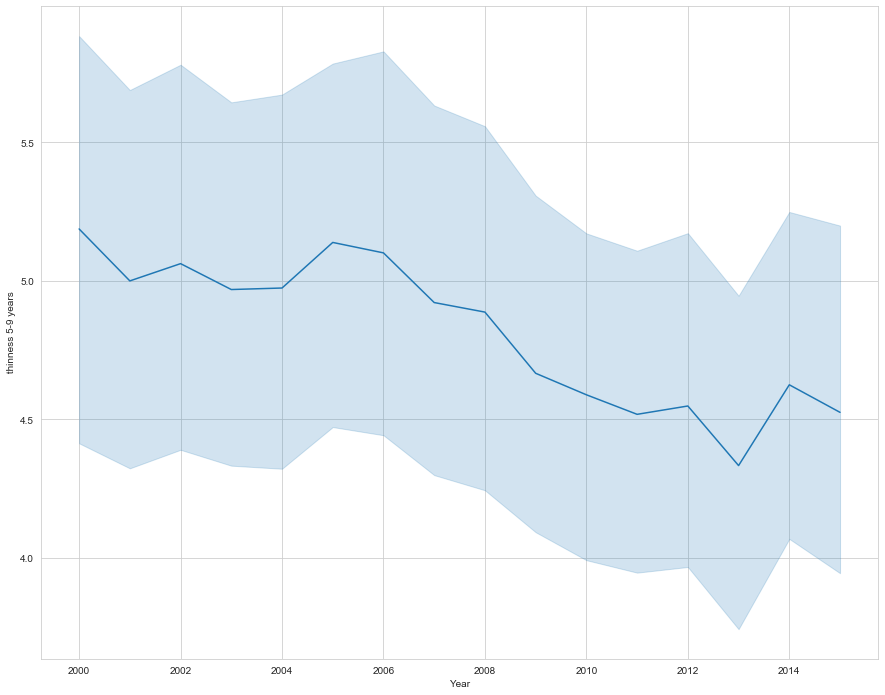

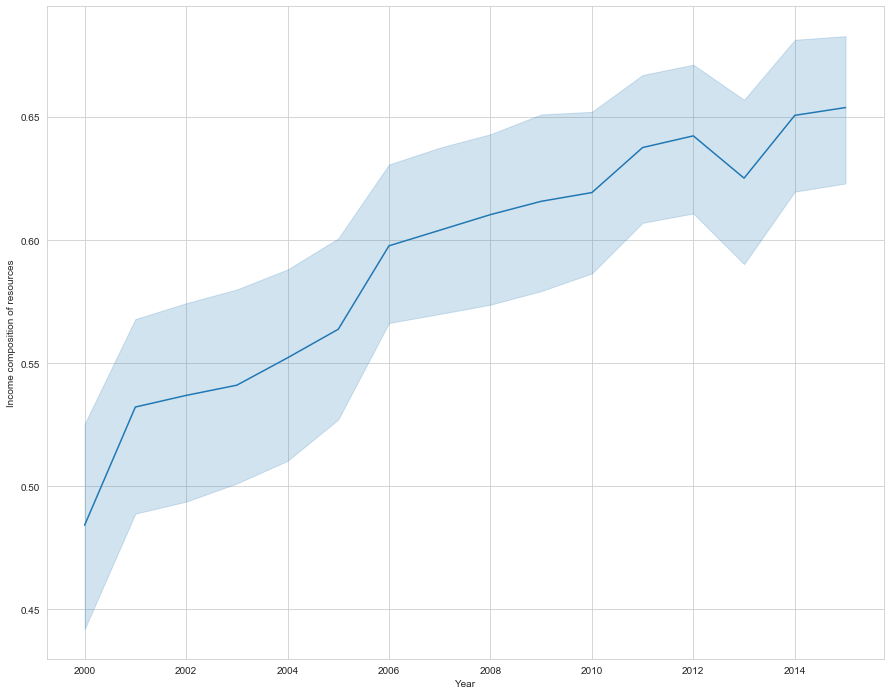

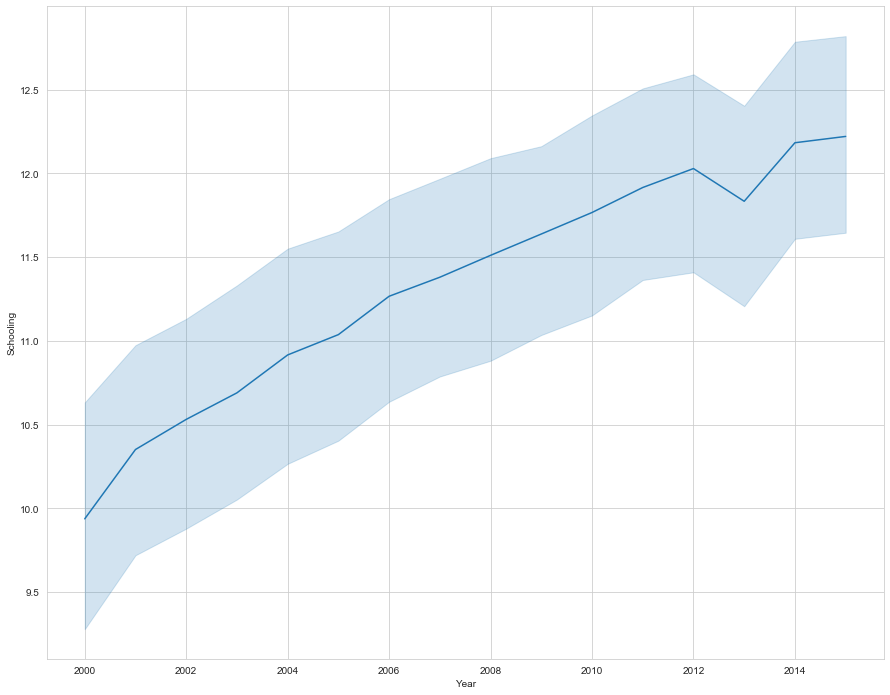

In [99]:
for i in [ 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling']:
    plt.figure(figsize=(15,12))
    sns.lineplot(x=df.Year,y=df[i],data=df)
    plt.show()

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


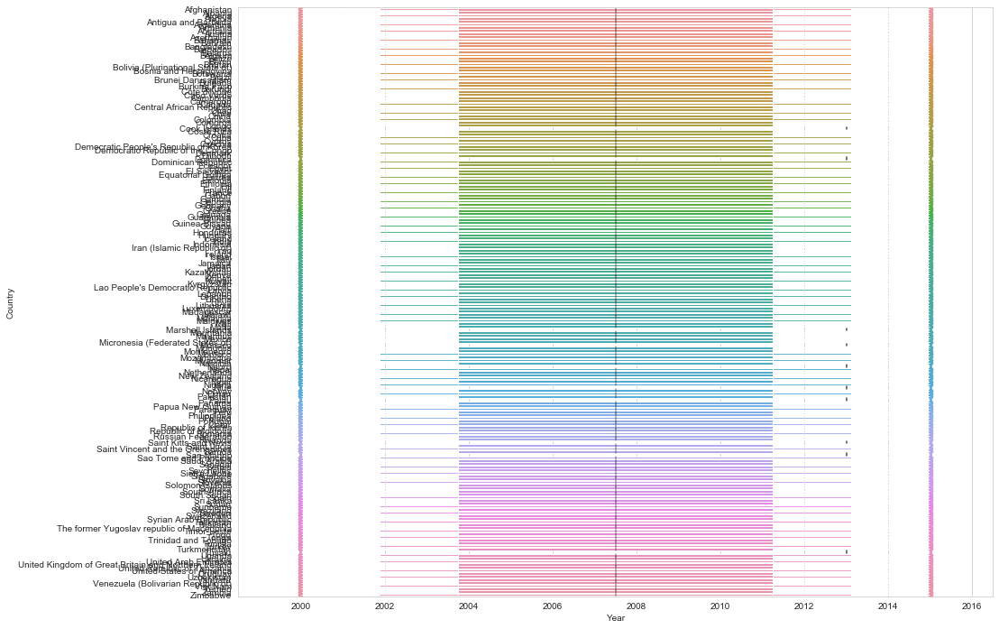

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


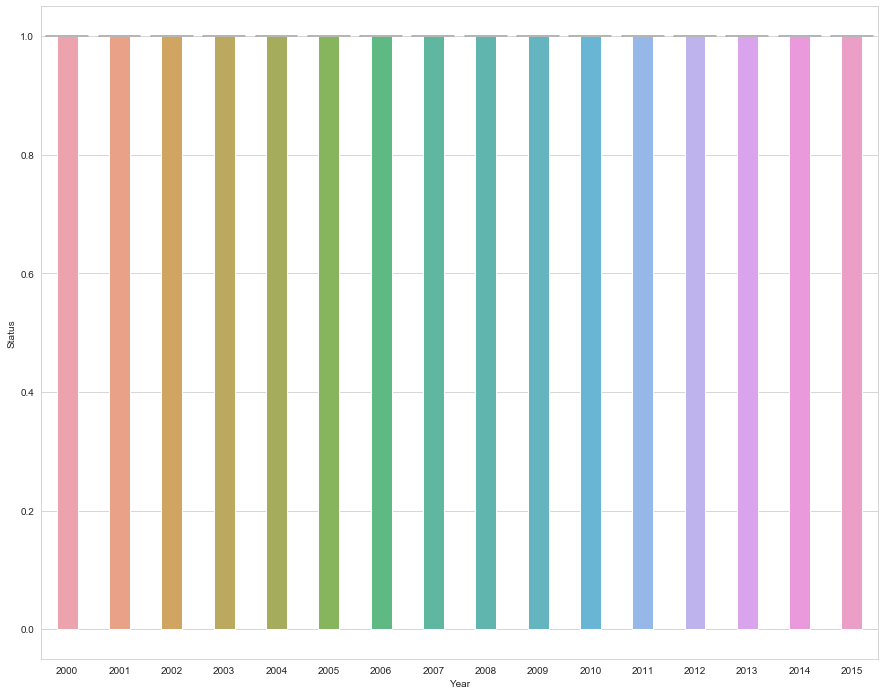

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


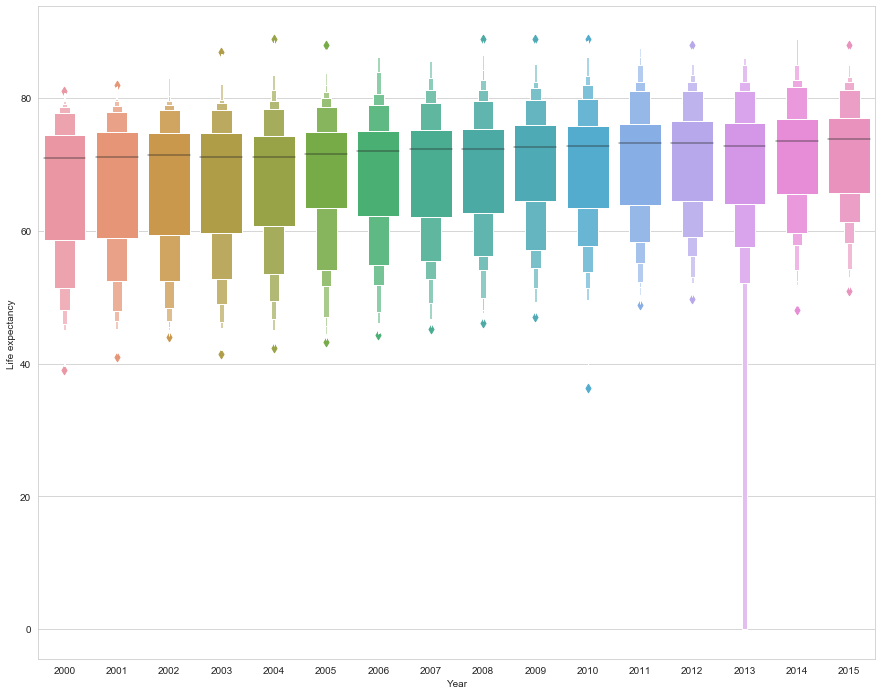

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


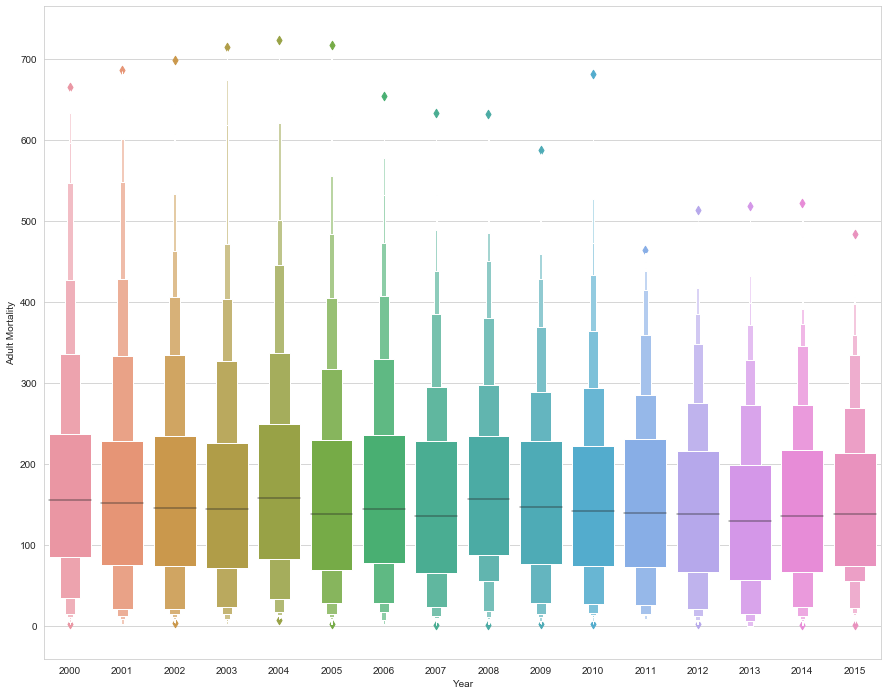

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


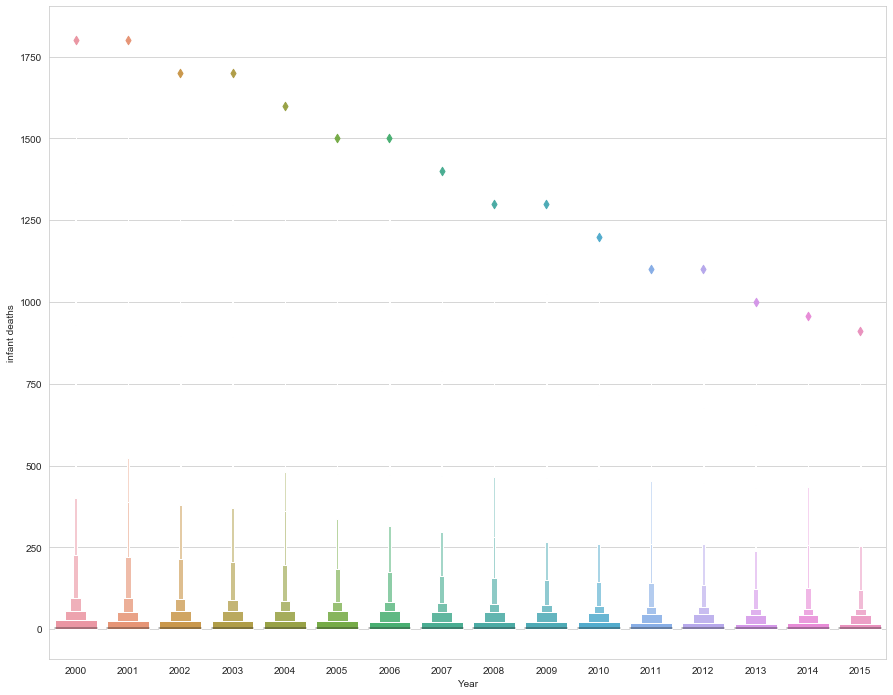

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


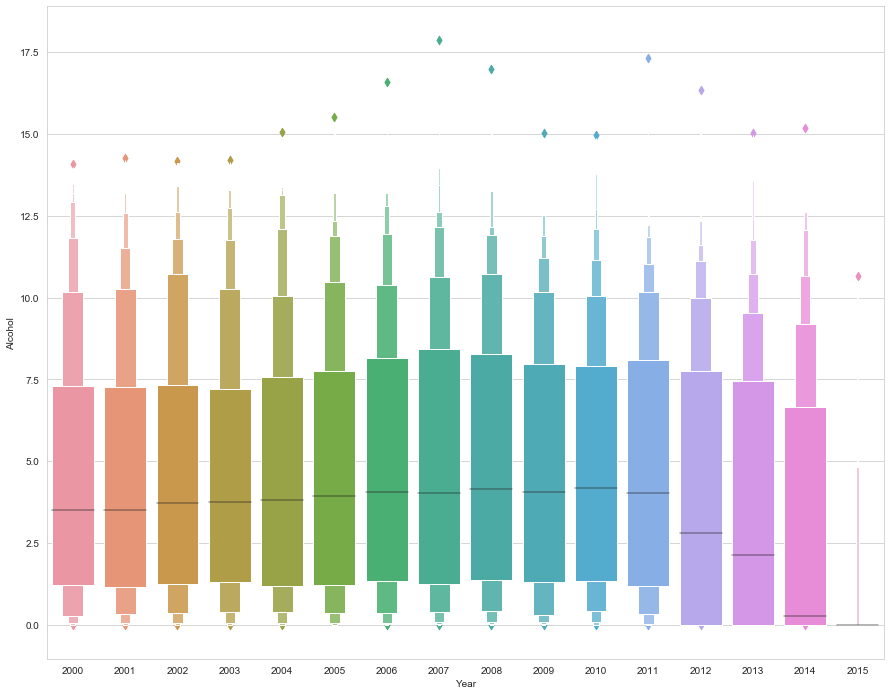

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


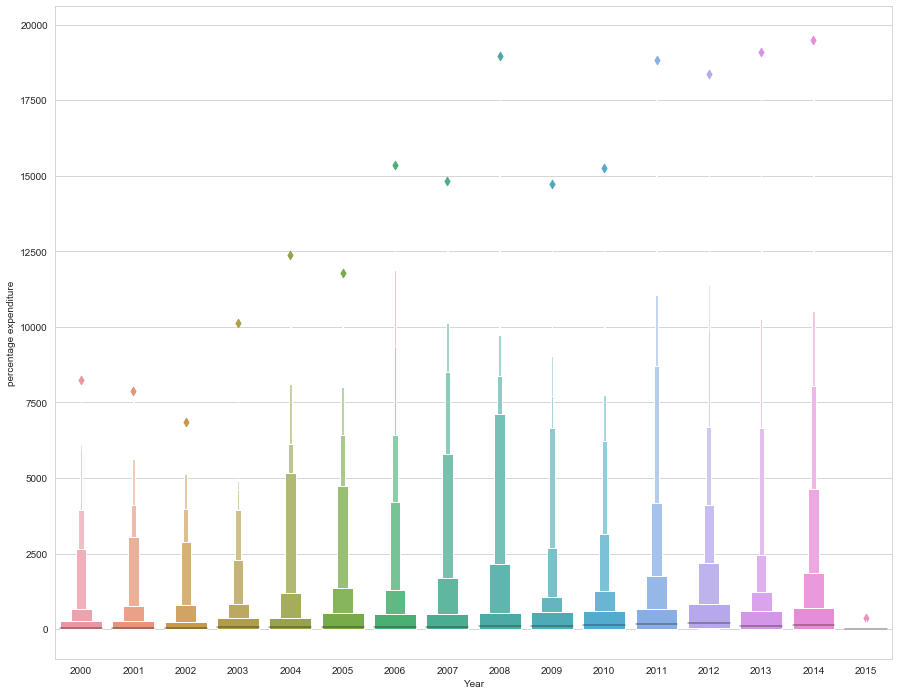

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


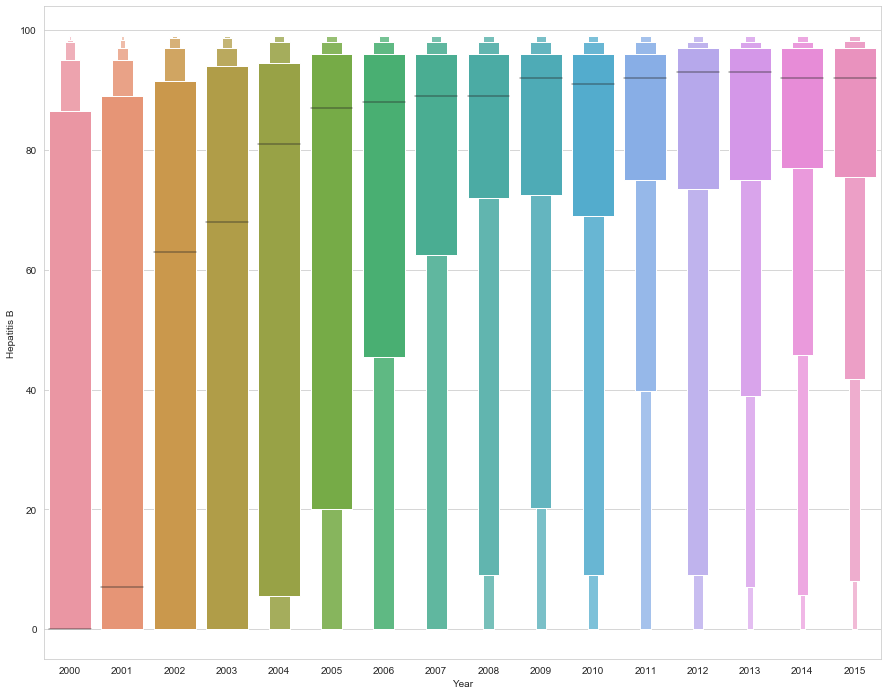

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


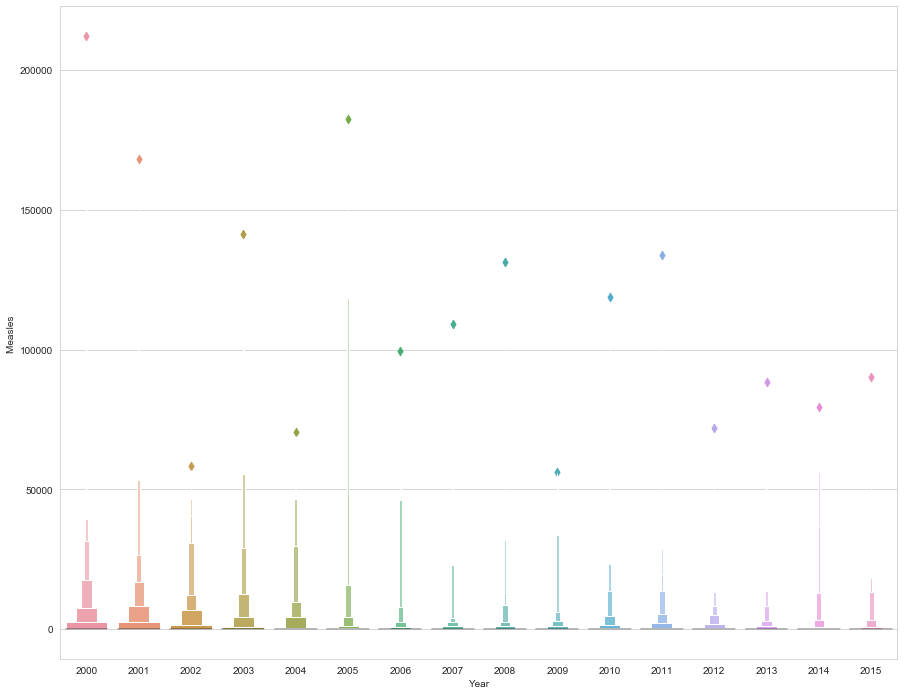

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


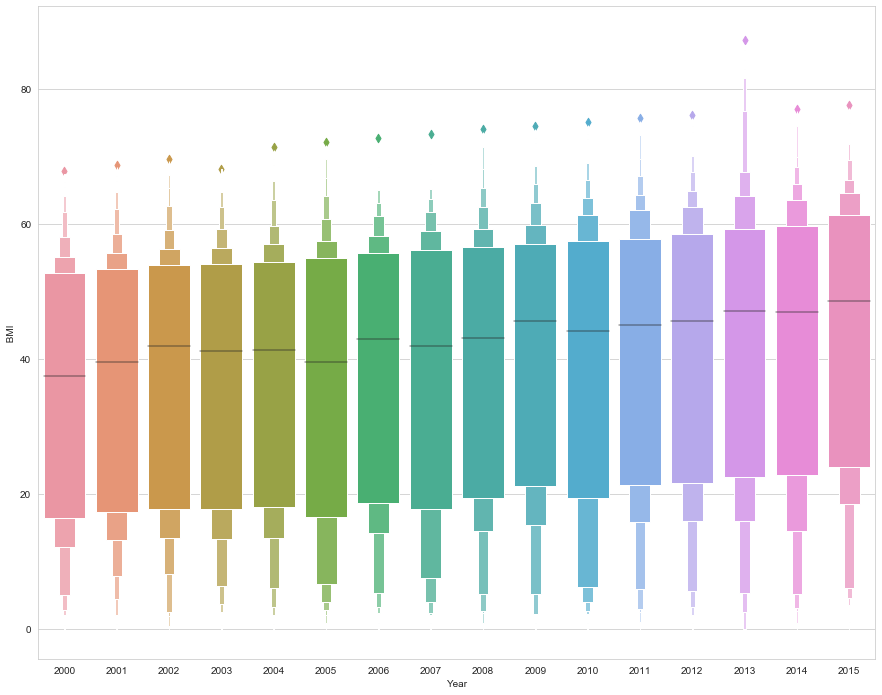

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


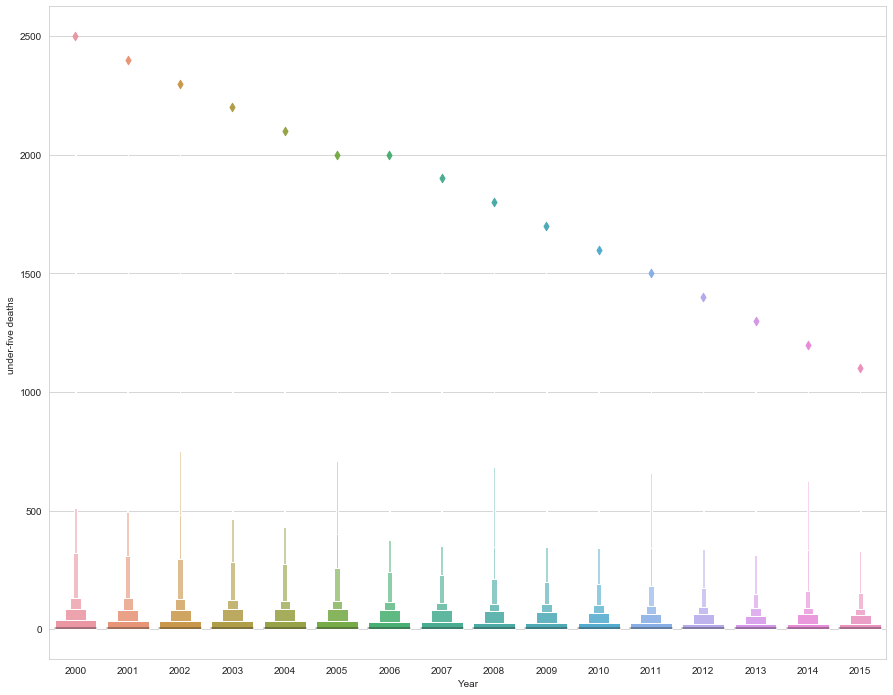

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


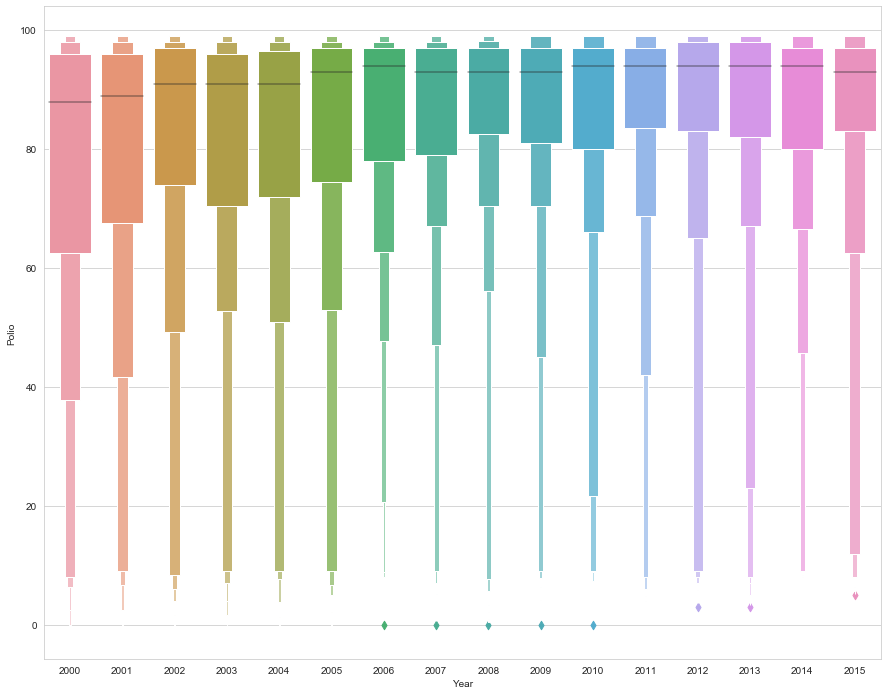

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


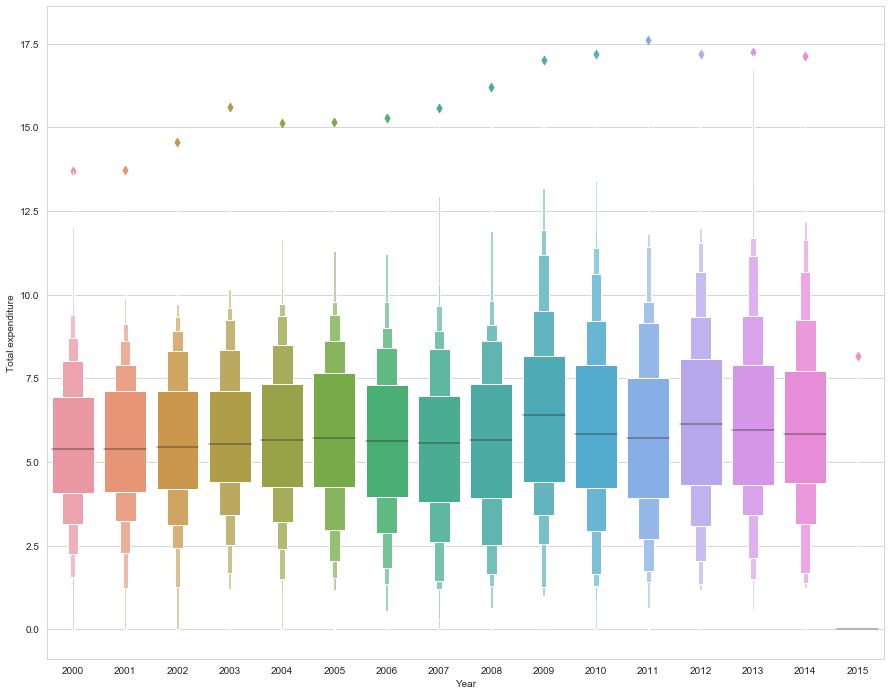

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


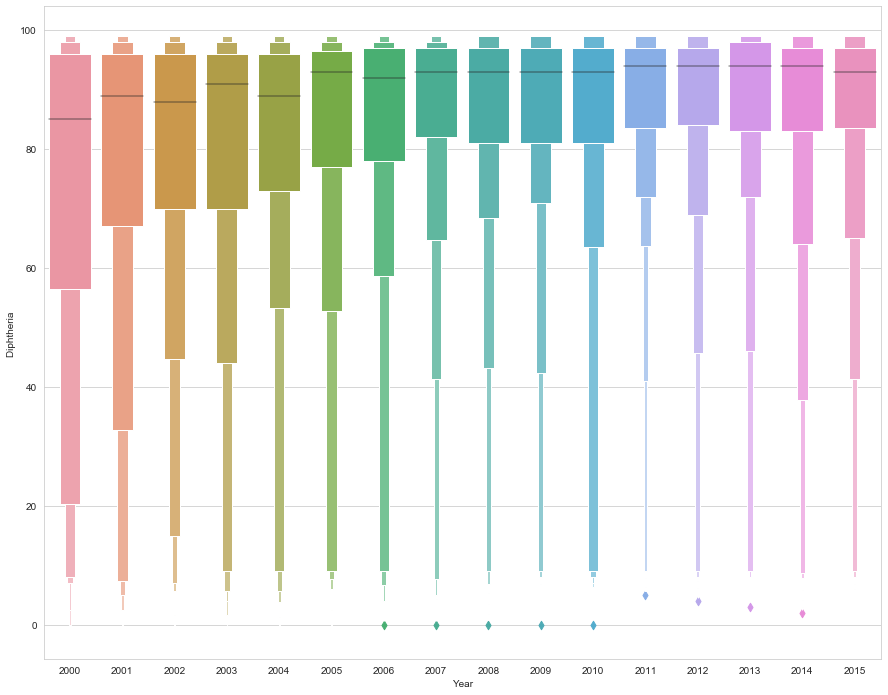

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


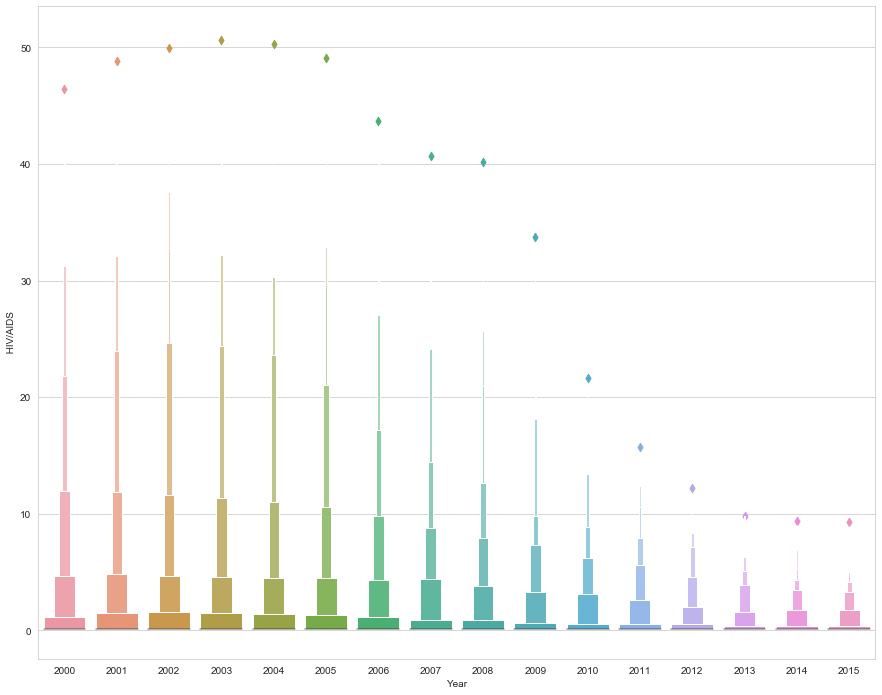

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


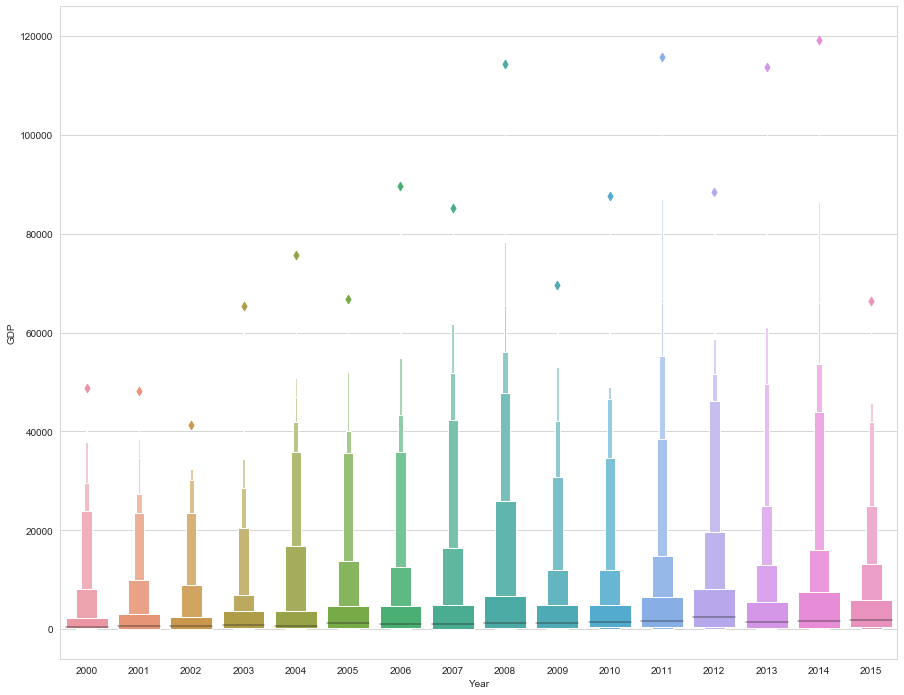

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


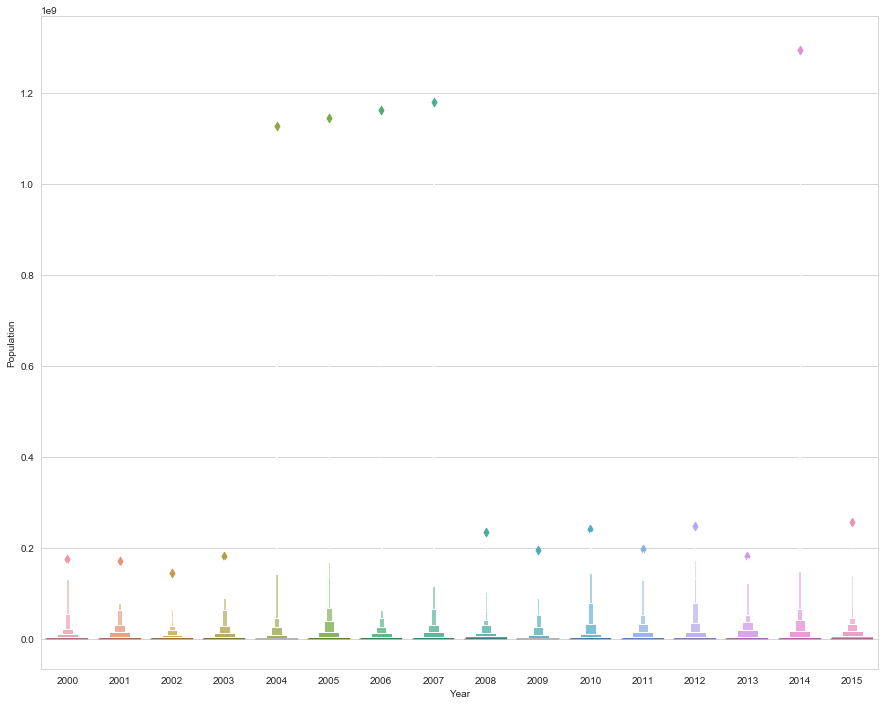

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


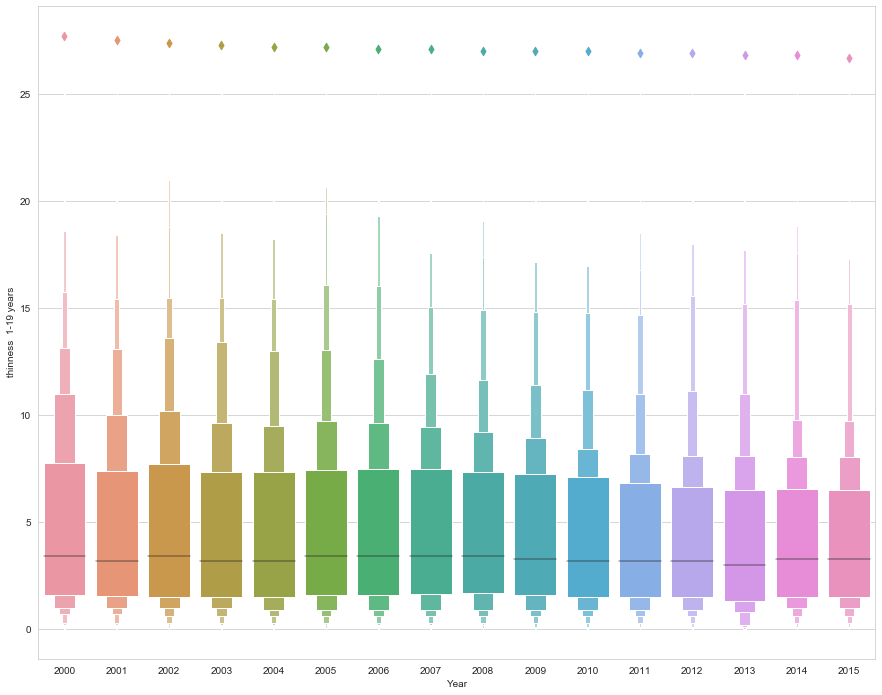

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


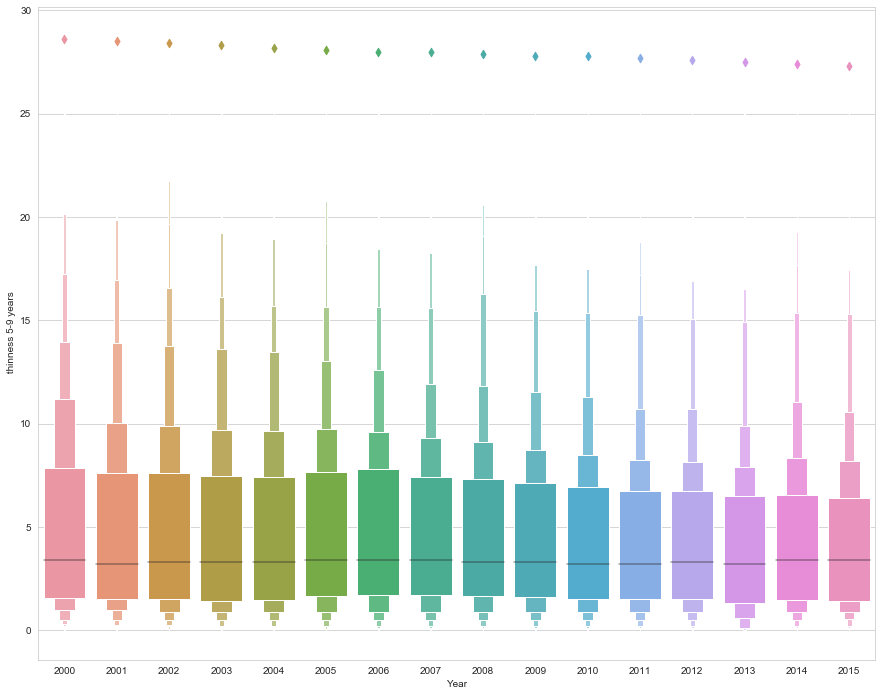

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


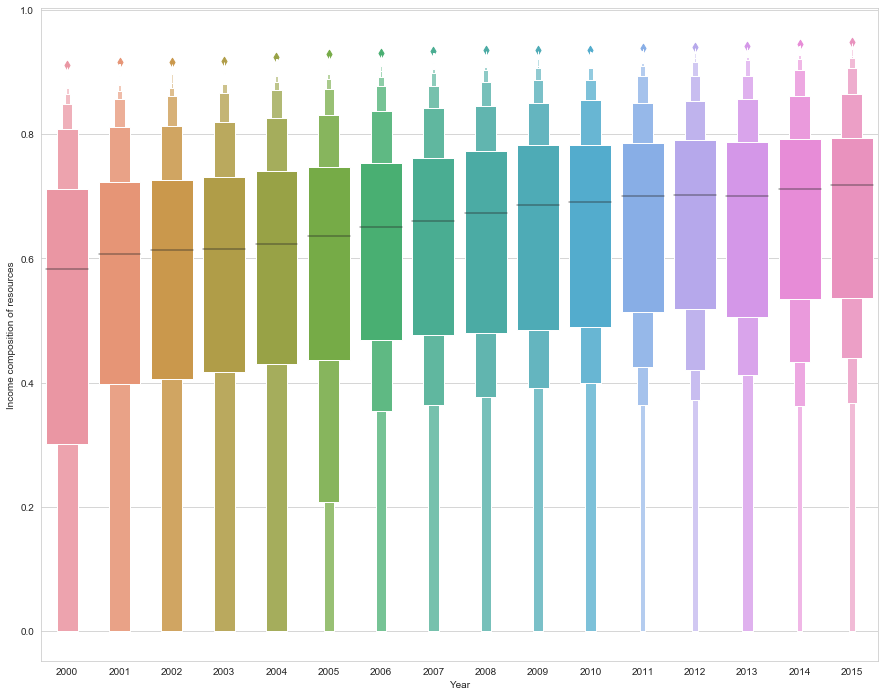

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


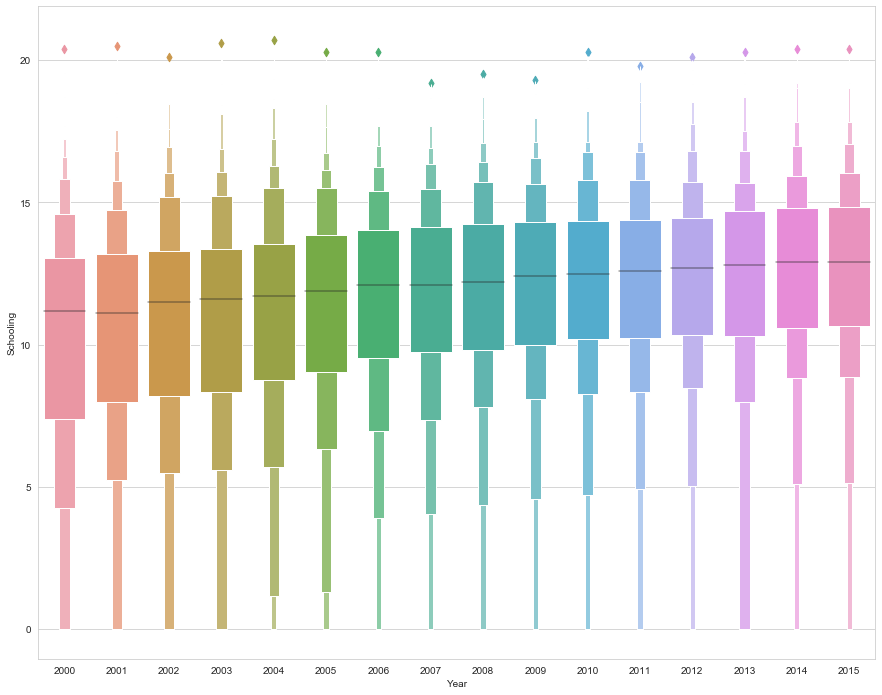

In [100]:
for i in [ 'Country','Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling']:
    plt.figure(figsize=(15,12))
    sns.lvplot(x=df.Year,y=df[i],data=df)
    plt.show()

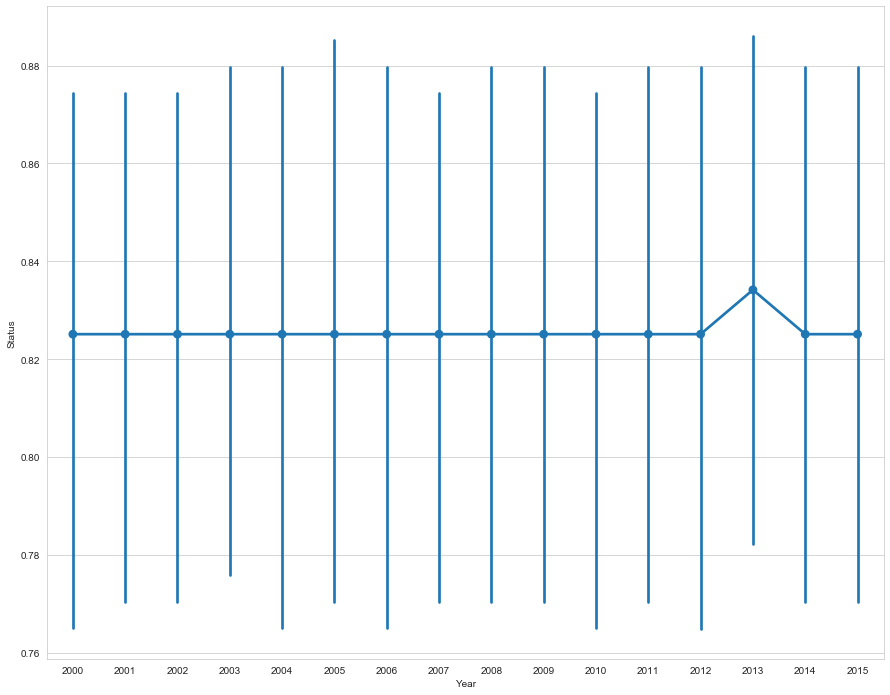

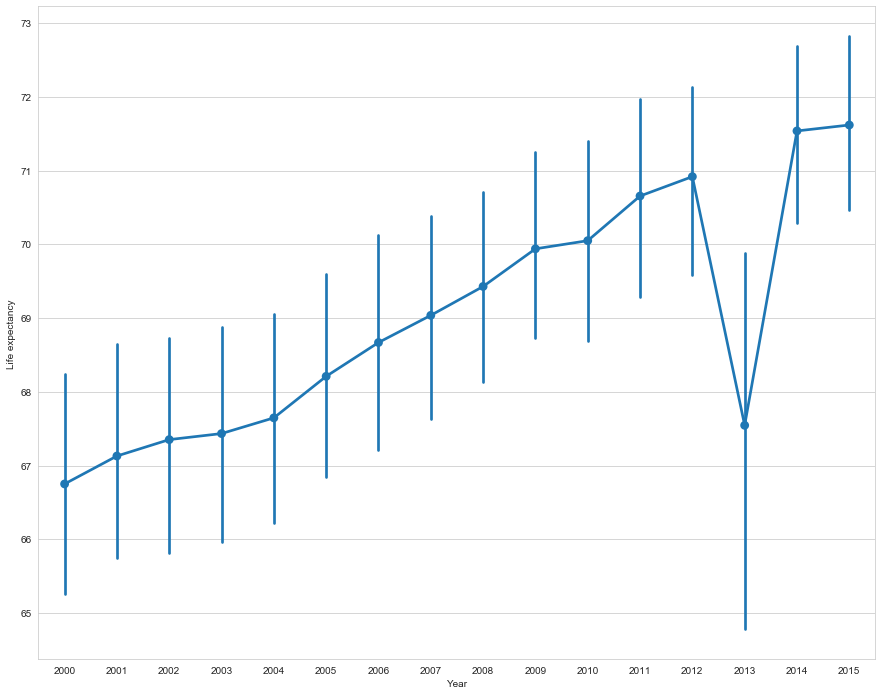

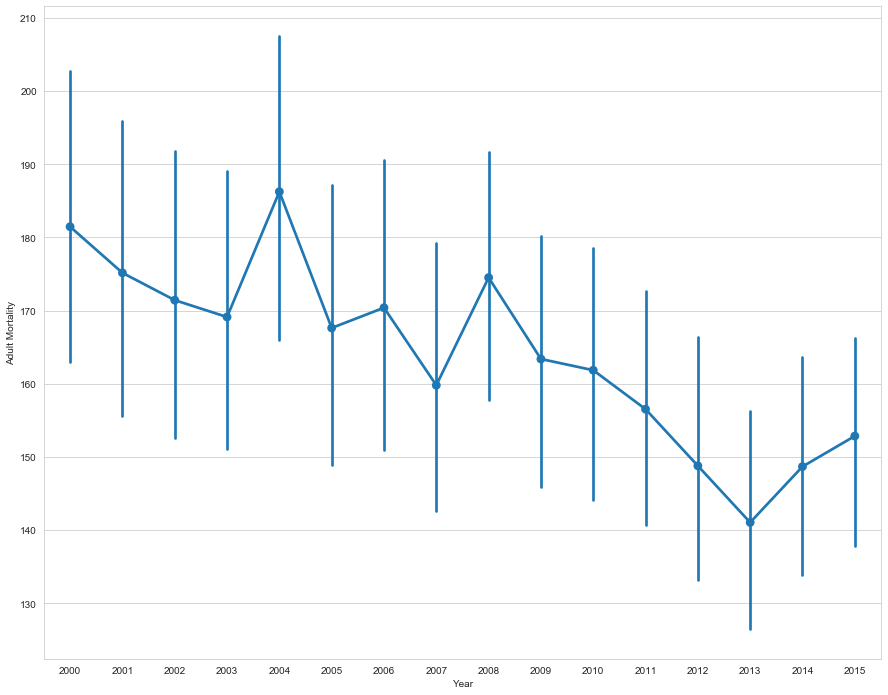

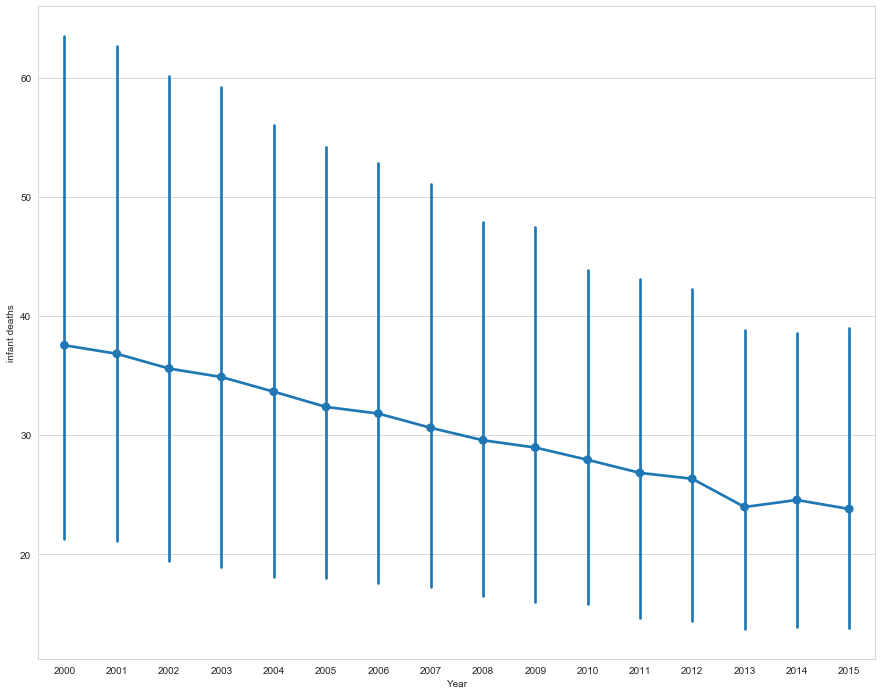

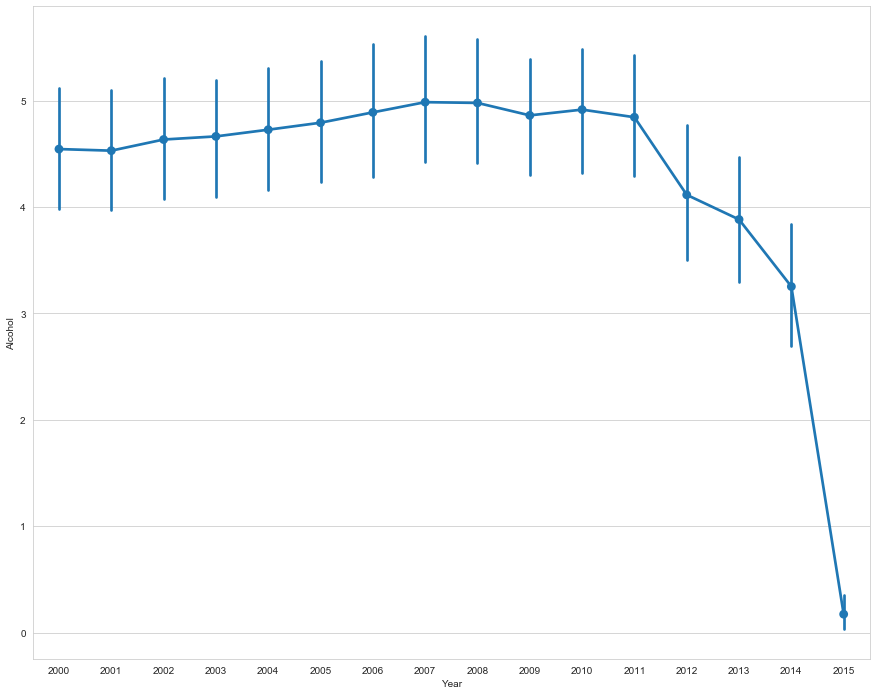

...

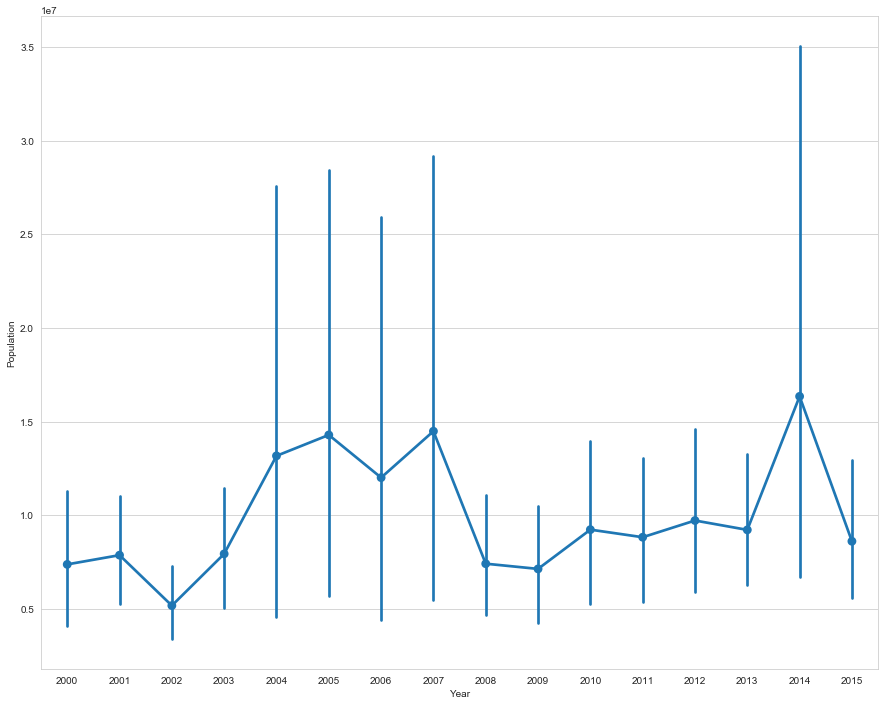

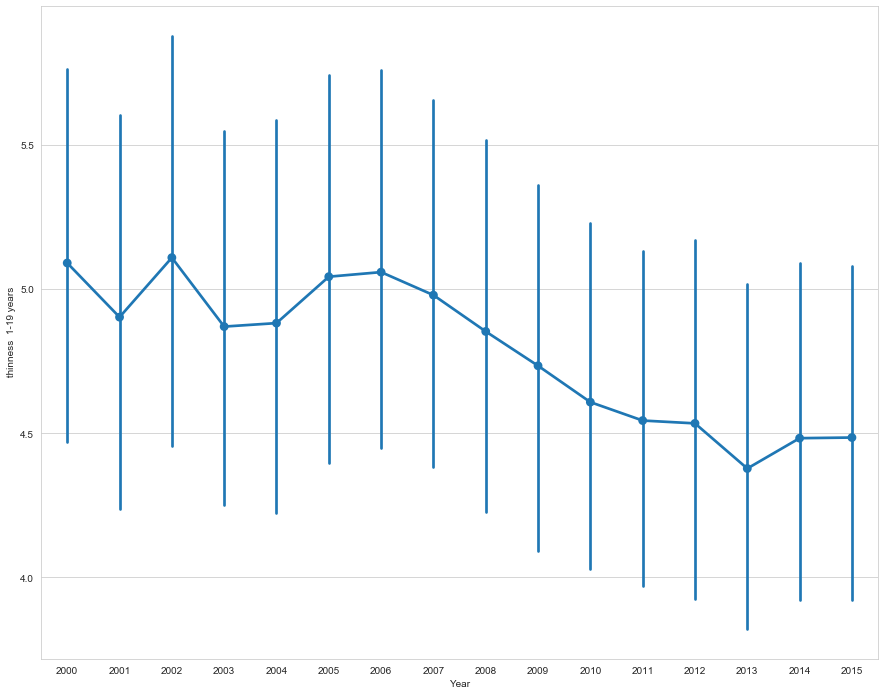

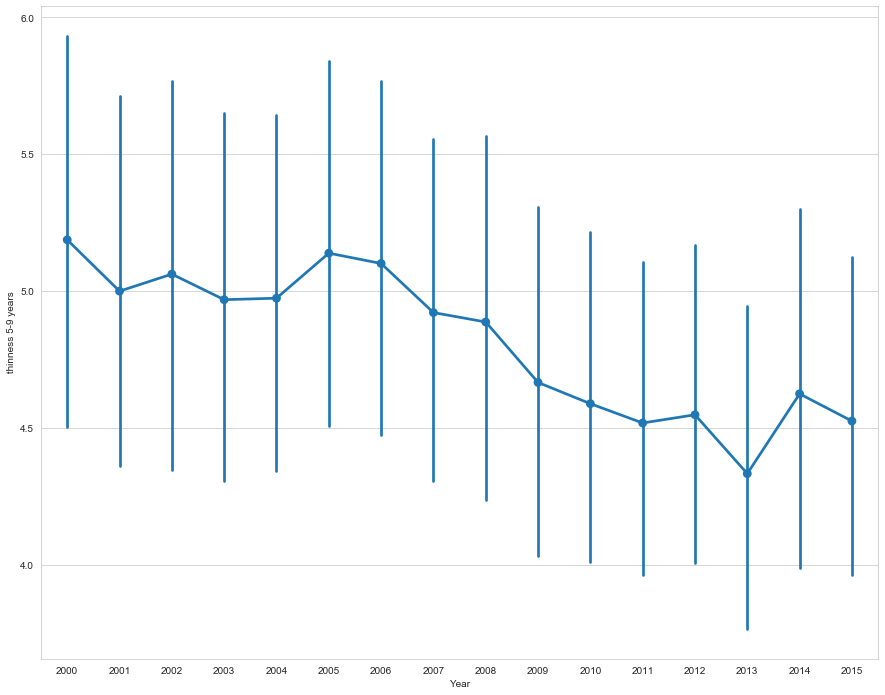

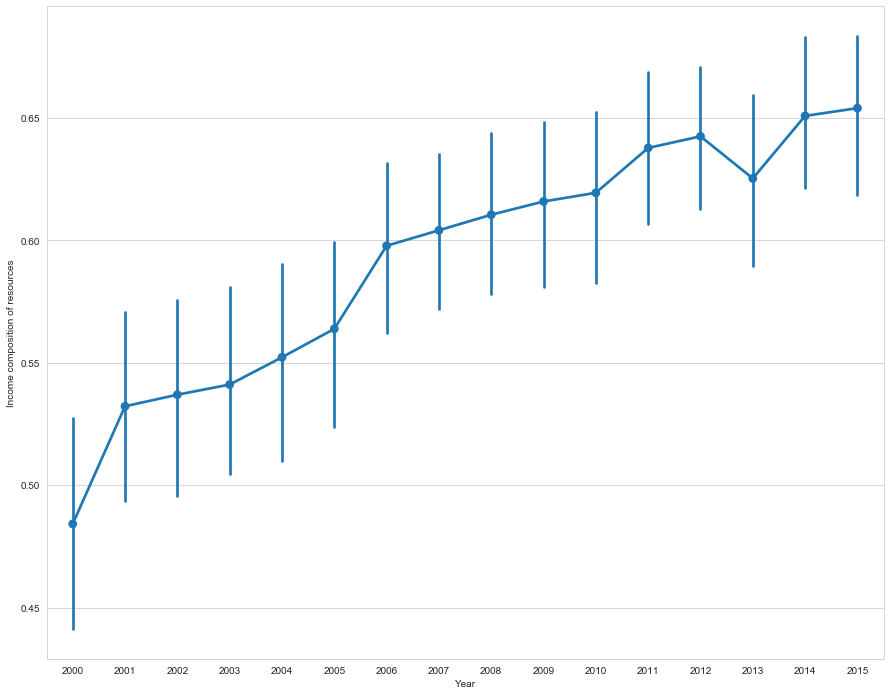

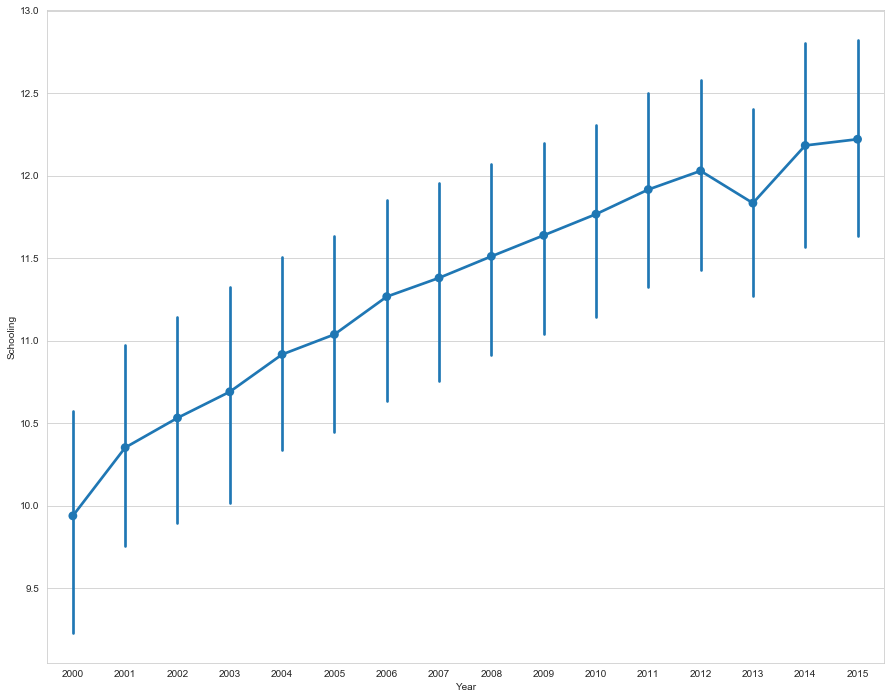

In [101]:
for i in [ 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling']:
    plt.figure(figsize=(15,12))
    sns.pointplot(x=df.Year,y=df[i],data=df)
    plt.show()

<Figure size 1080x864 with 0 Axes>

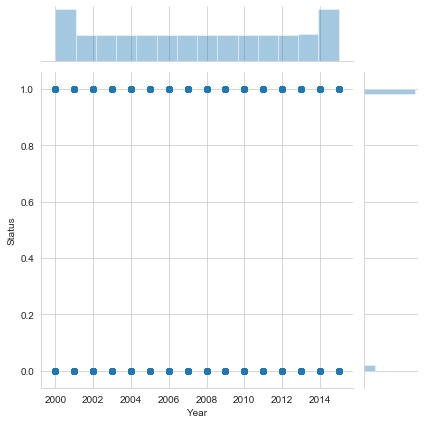

<Figure size 1080x864 with 0 Axes>

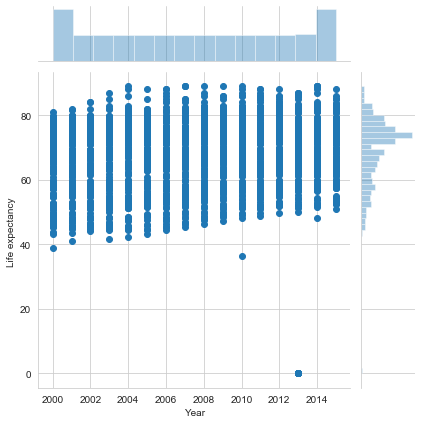

<Figure size 1080x864 with 0 Axes>

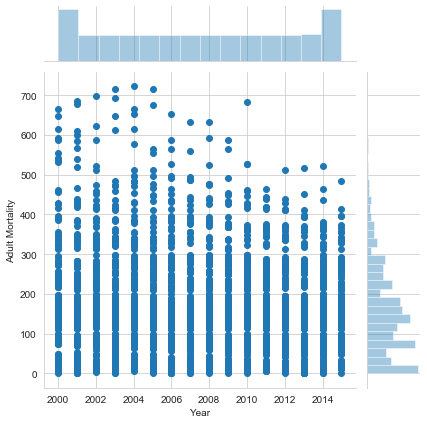

<Figure size 1080x864 with 0 Axes>

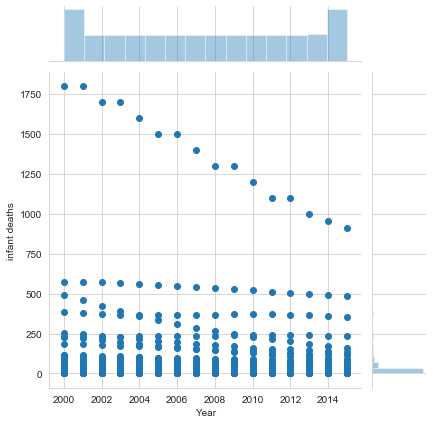

<Figure size 1080x864 with 0 Axes>

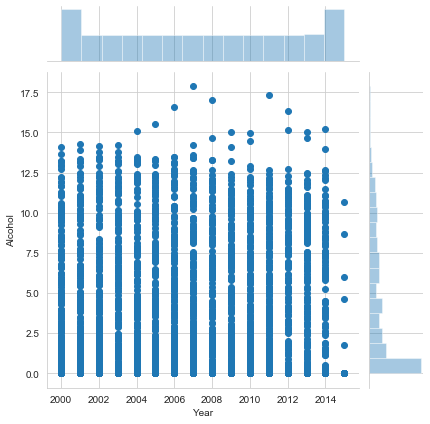

<Figure size 1080x864 with 0 Axes>

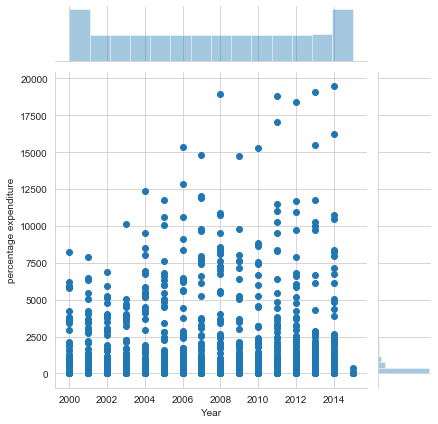

<Figure size 1080x864 with 0 Axes>

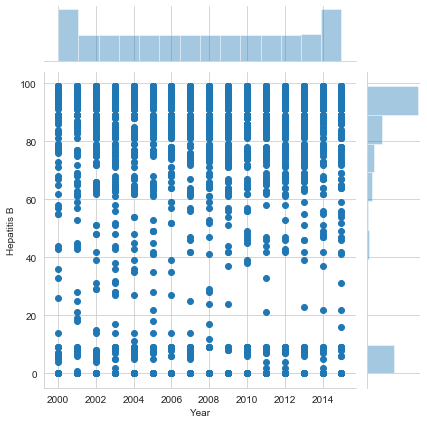

<Figure size 1080x864 with 0 Axes>

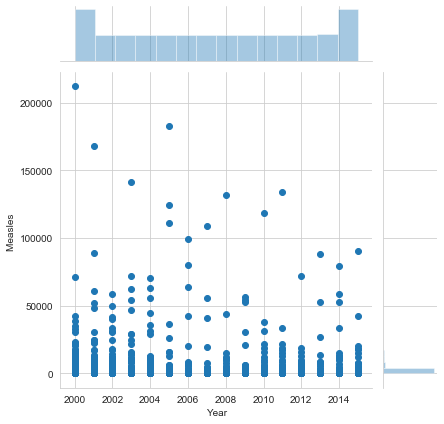

<Figure size 1080x864 with 0 Axes>

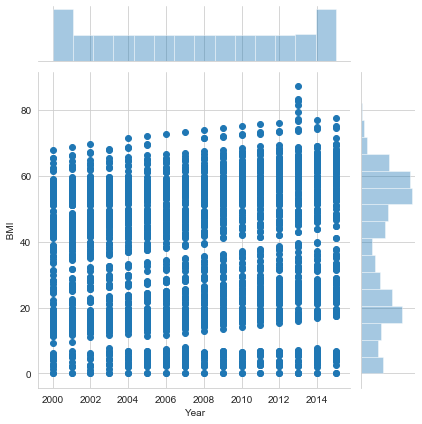

<Figure size 1080x864 with 0 Axes>

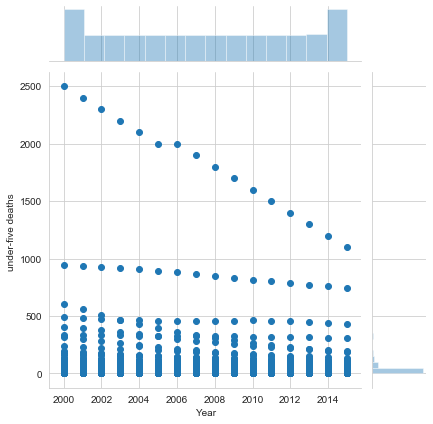

<Figure size 1080x864 with 0 Axes>

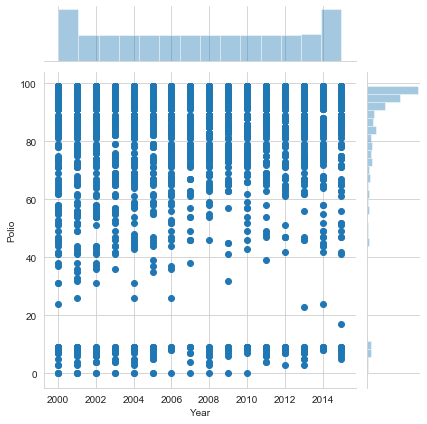

<Figure size 1080x864 with 0 Axes>

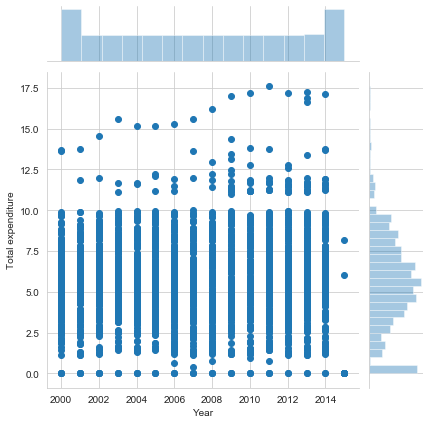

<Figure size 1080x864 with 0 Axes>

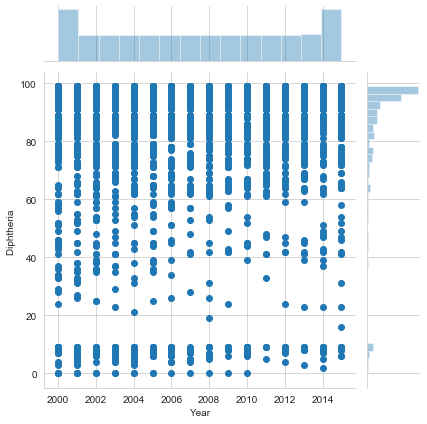

<Figure size 1080x864 with 0 Axes>

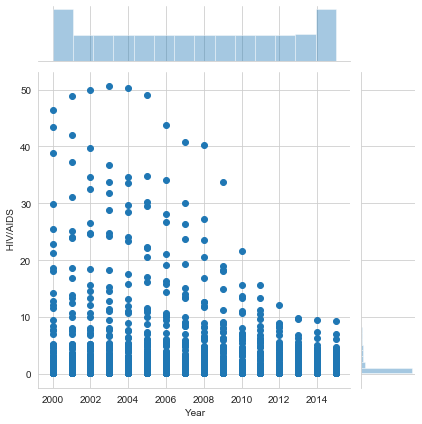

<Figure size 1080x864 with 0 Axes>

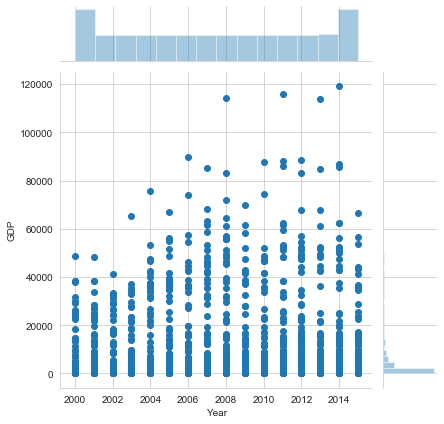

<Figure size 1080x864 with 0 Axes>

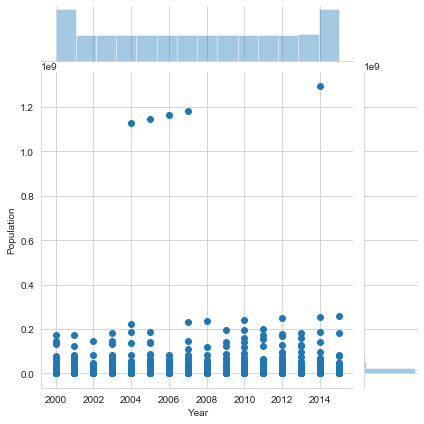

<Figure size 1080x864 with 0 Axes>

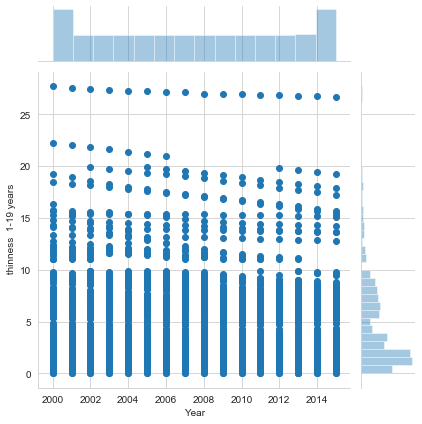

<Figure size 1080x864 with 0 Axes>

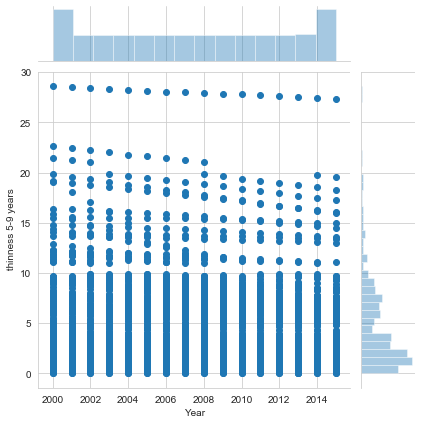

<Figure size 1080x864 with 0 Axes>

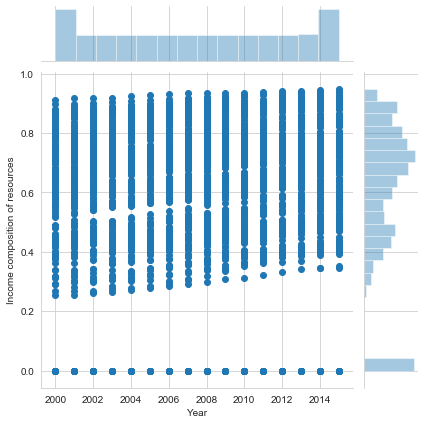

<Figure size 1080x864 with 0 Axes>

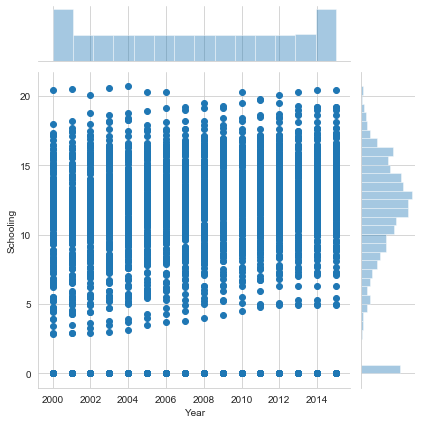

In [103]:
for i in [ 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling']:
    plt.figure(figsize=(15,12))
    sns.jointplot(x=df.Year,y=df[i],data=df)
    plt.show()

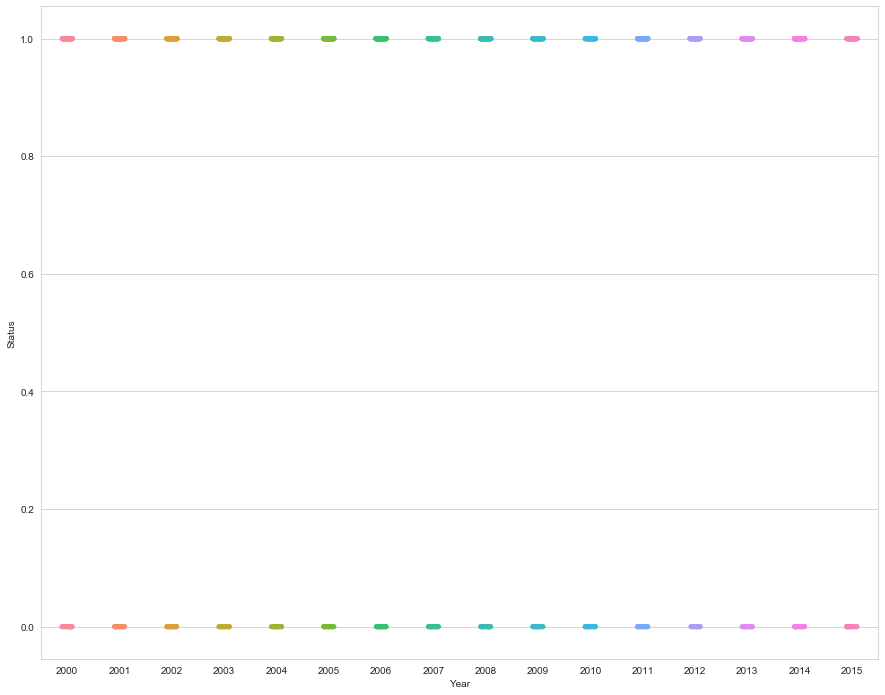

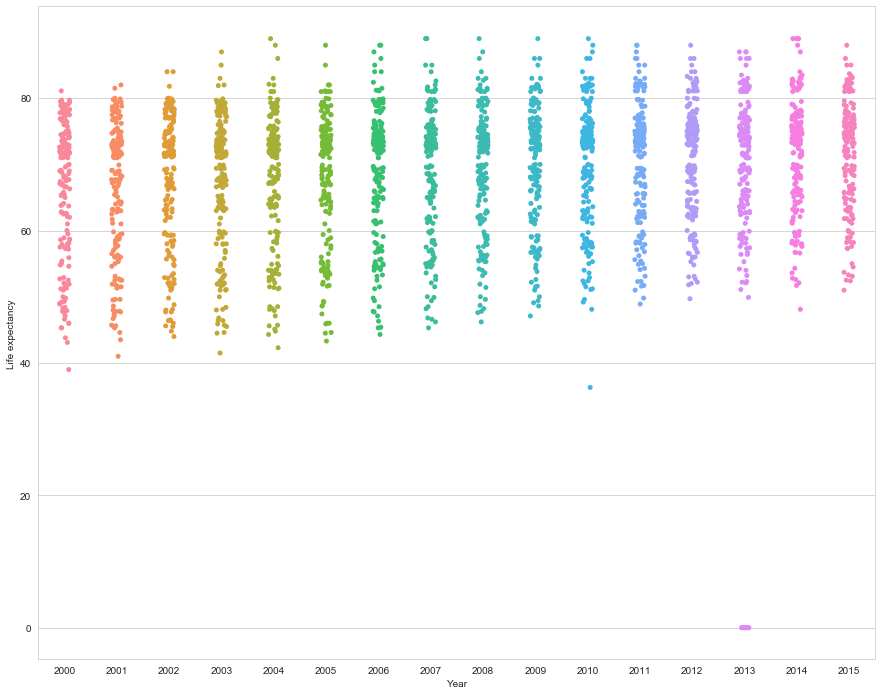

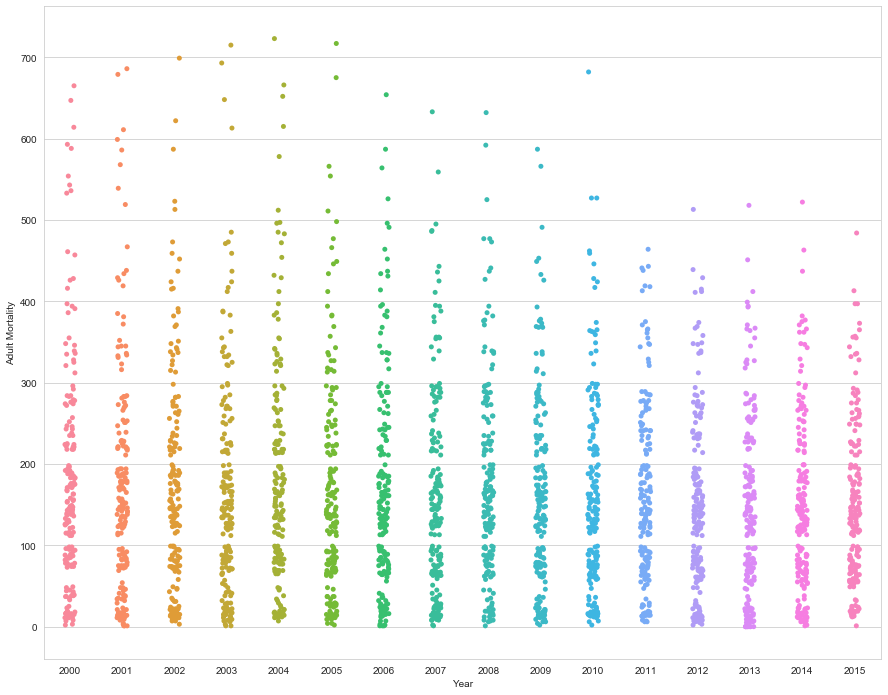

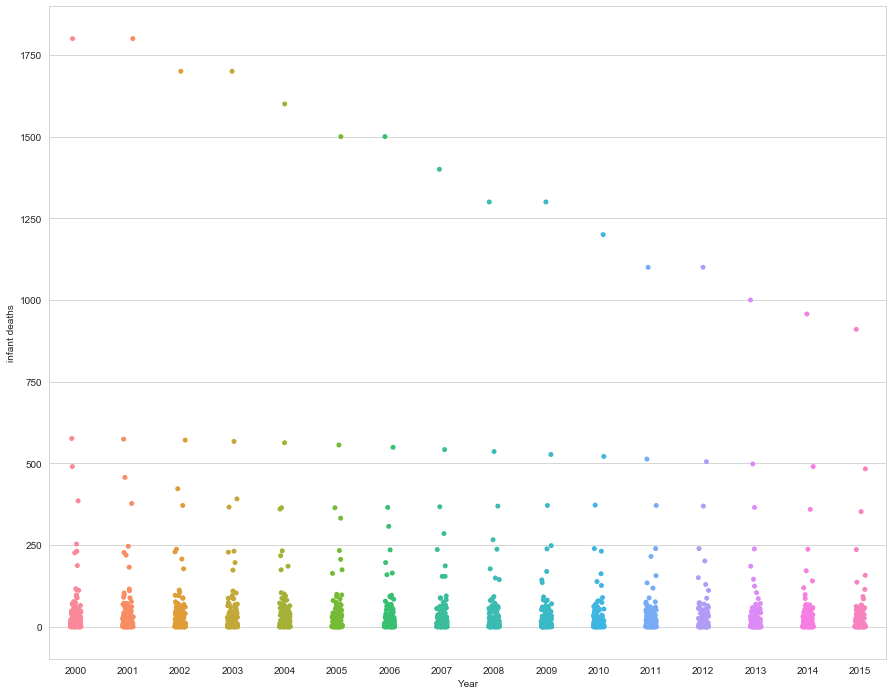

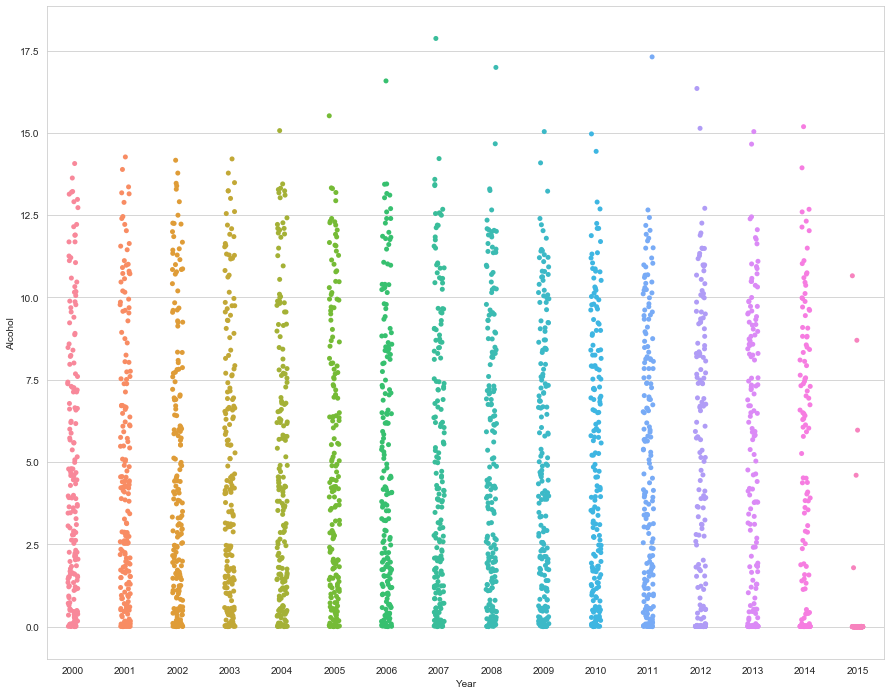

...

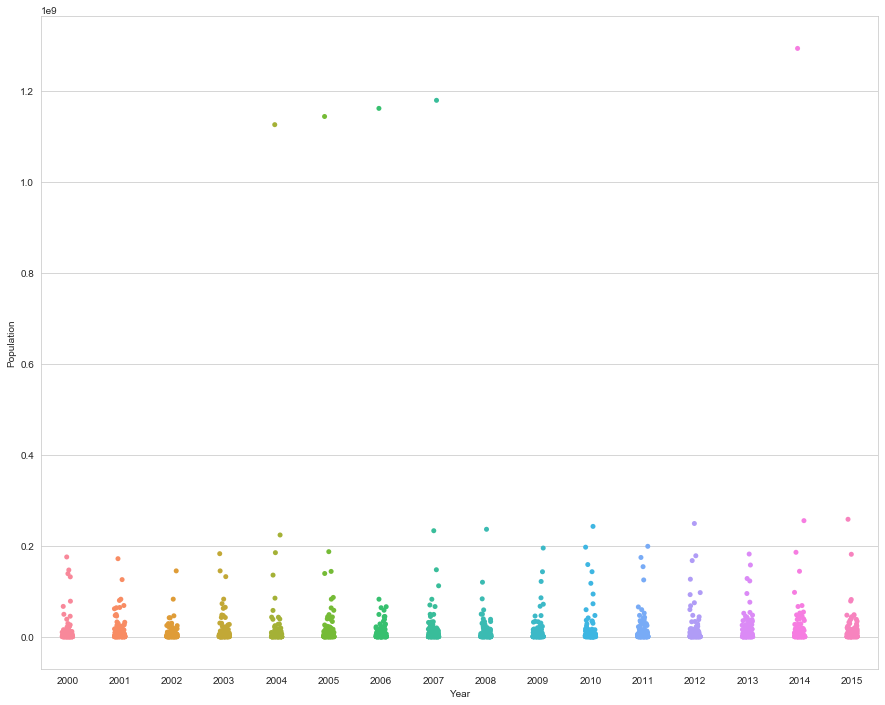

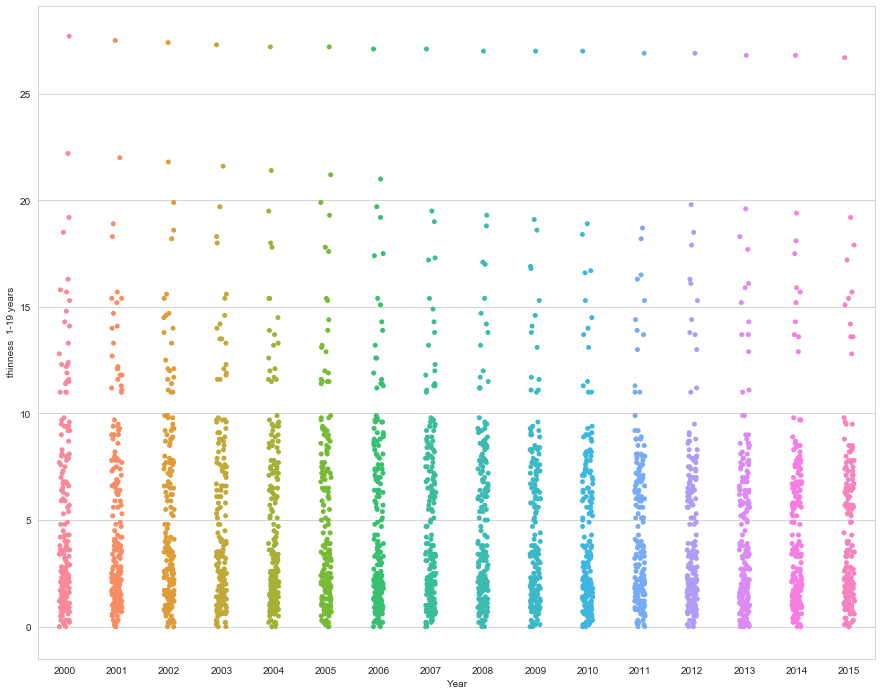

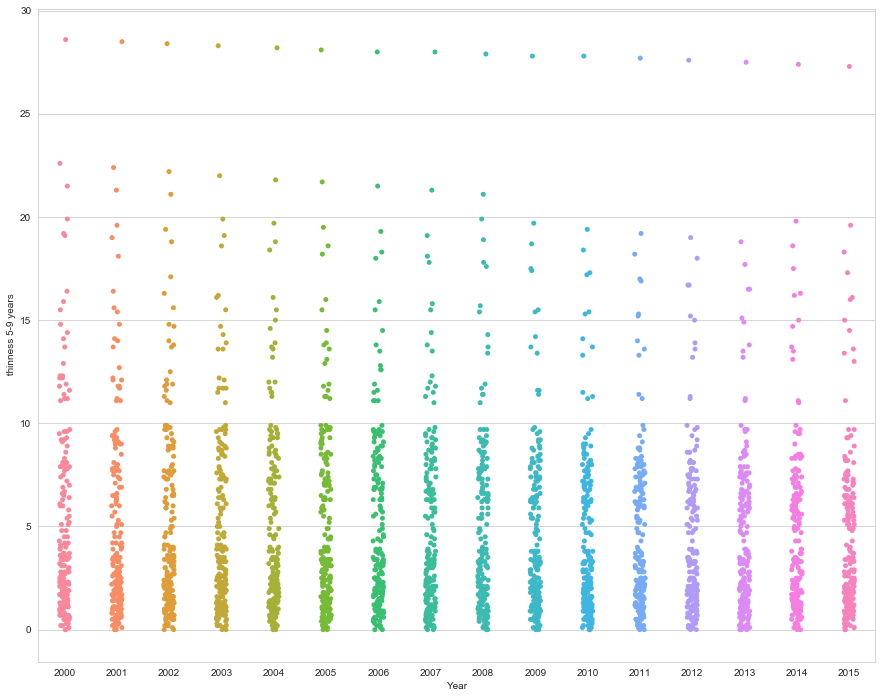

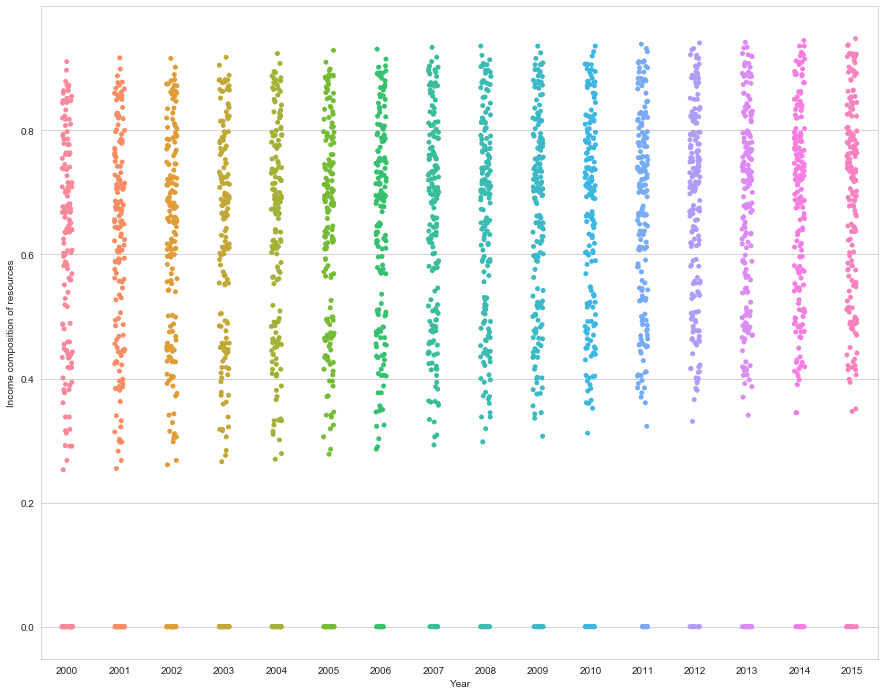

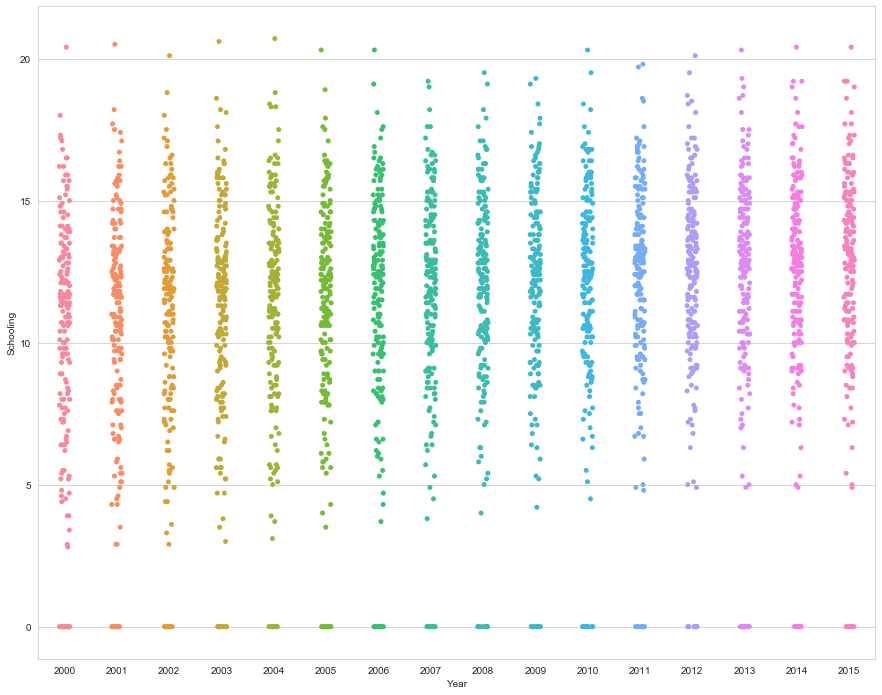

In [104]:
for i in [ 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling']:
    plt.figure(figsize=(15,12))
    sns.stripplot(x=df.Year,y=df[i],data=df)
    plt.show()

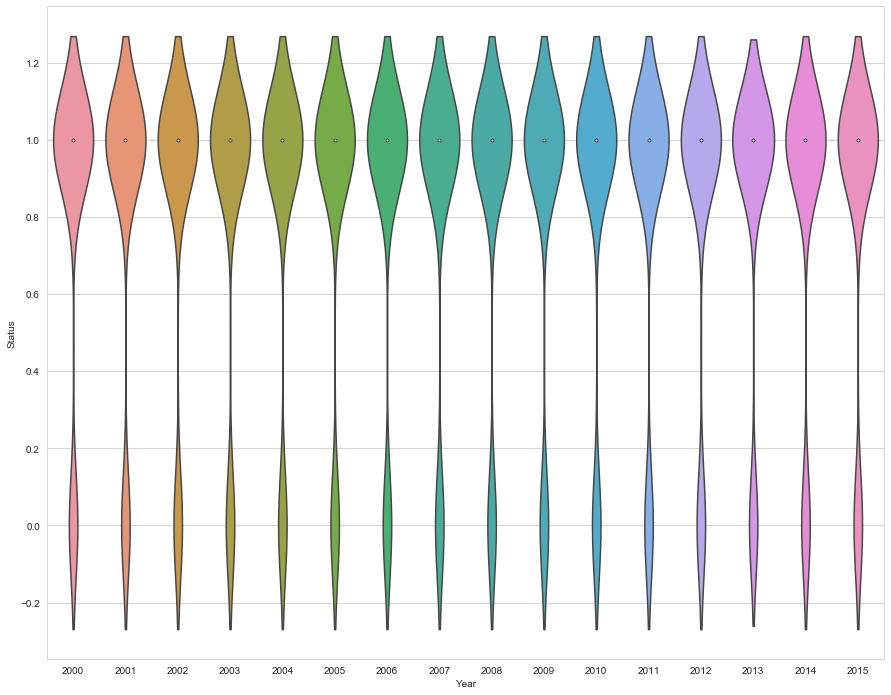

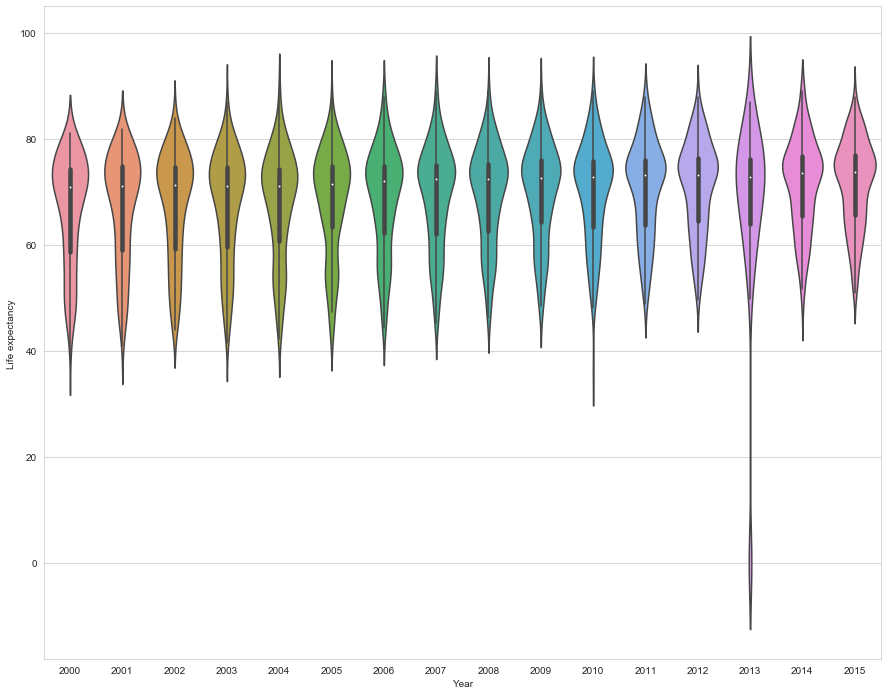

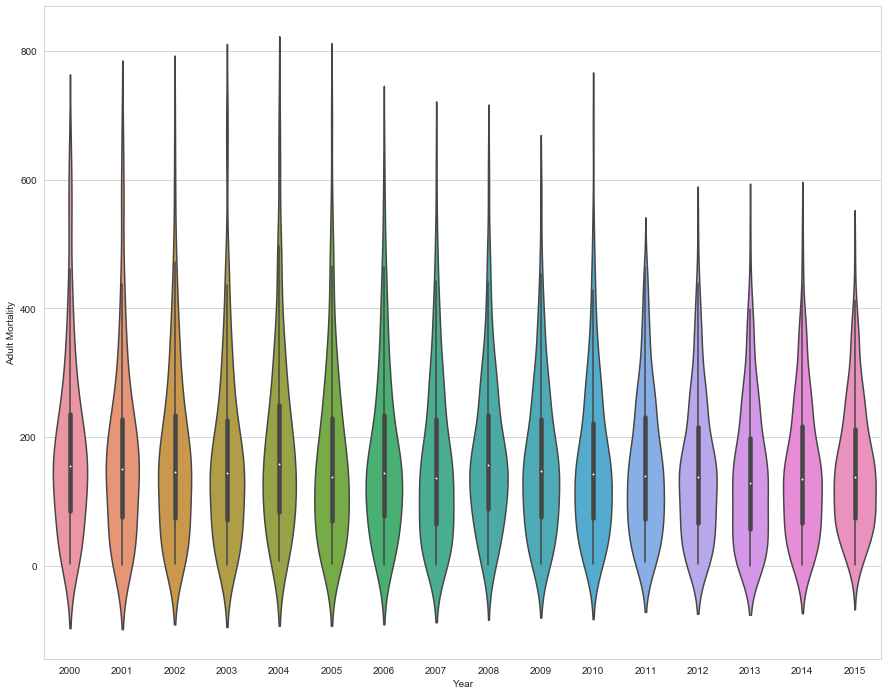

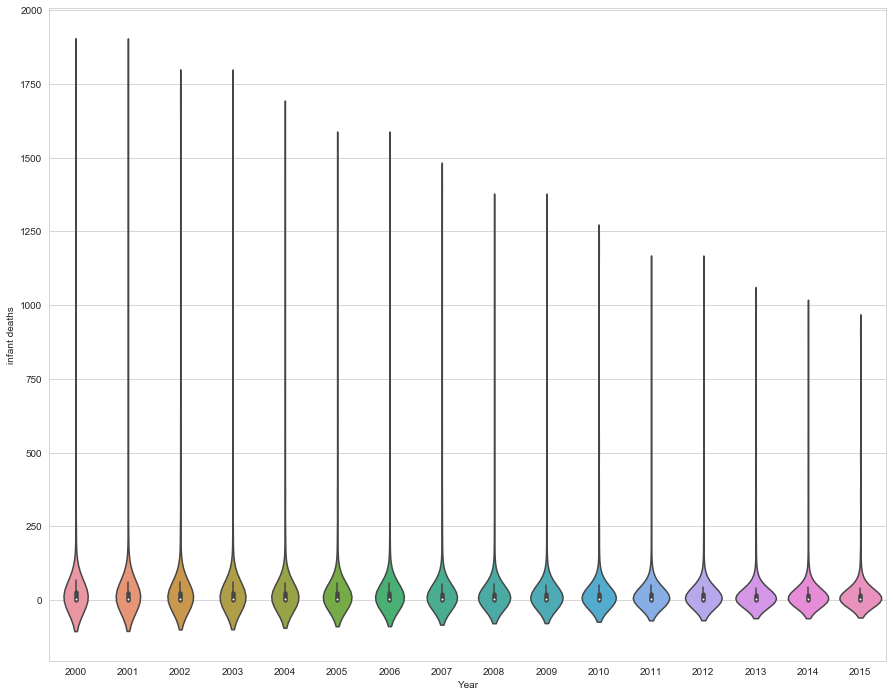

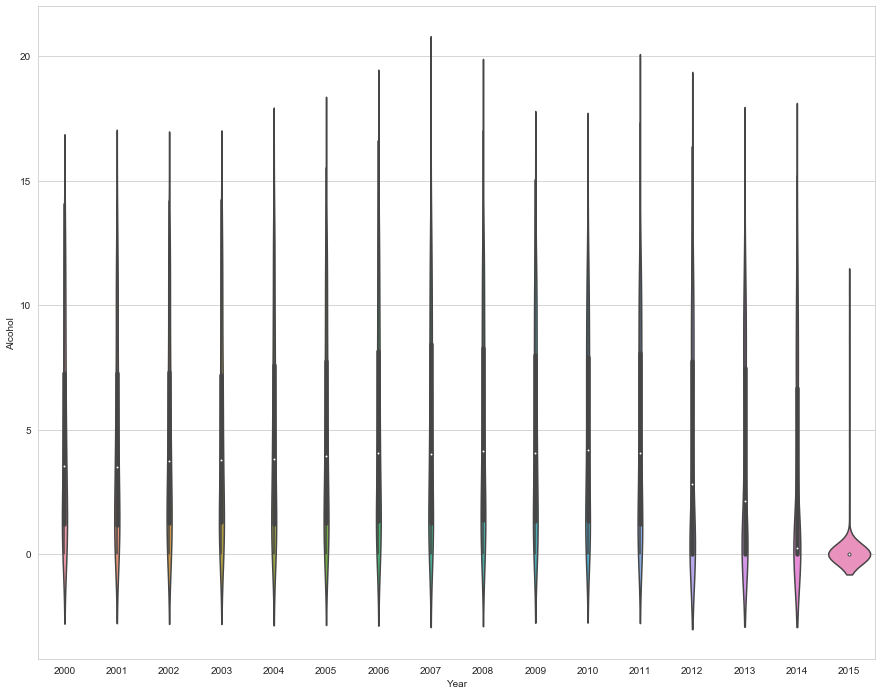

...

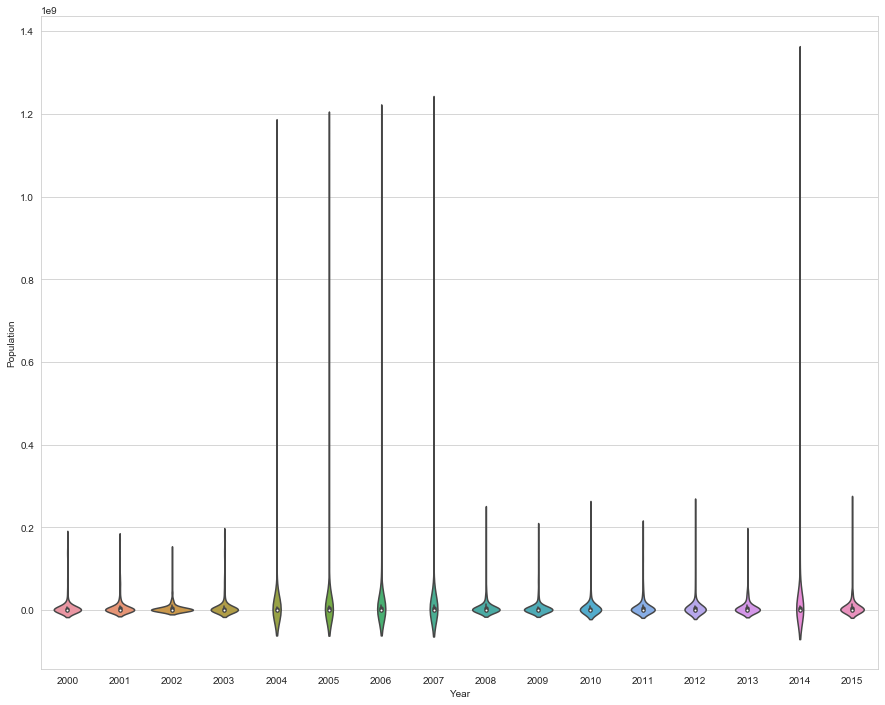

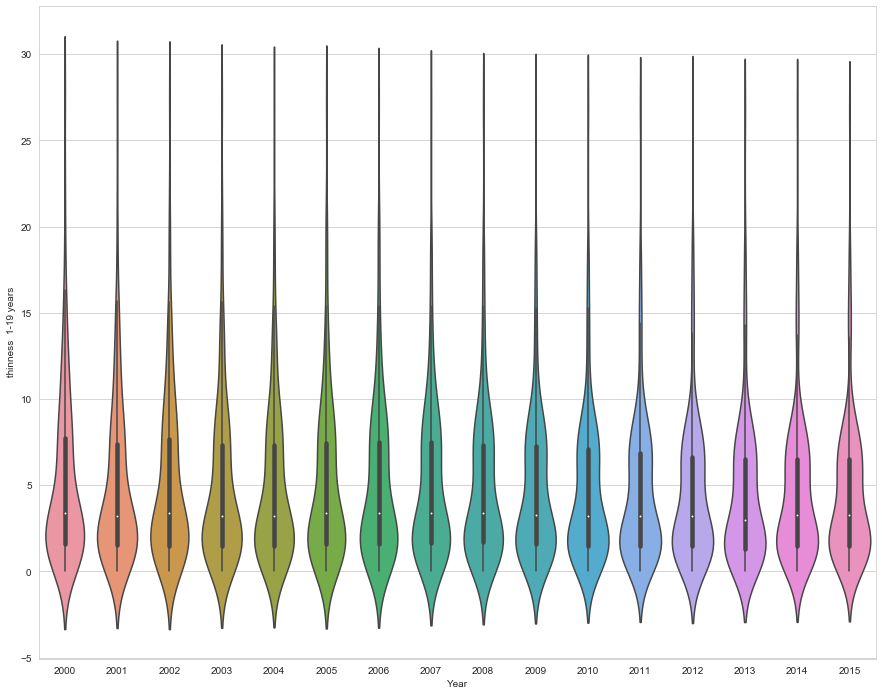

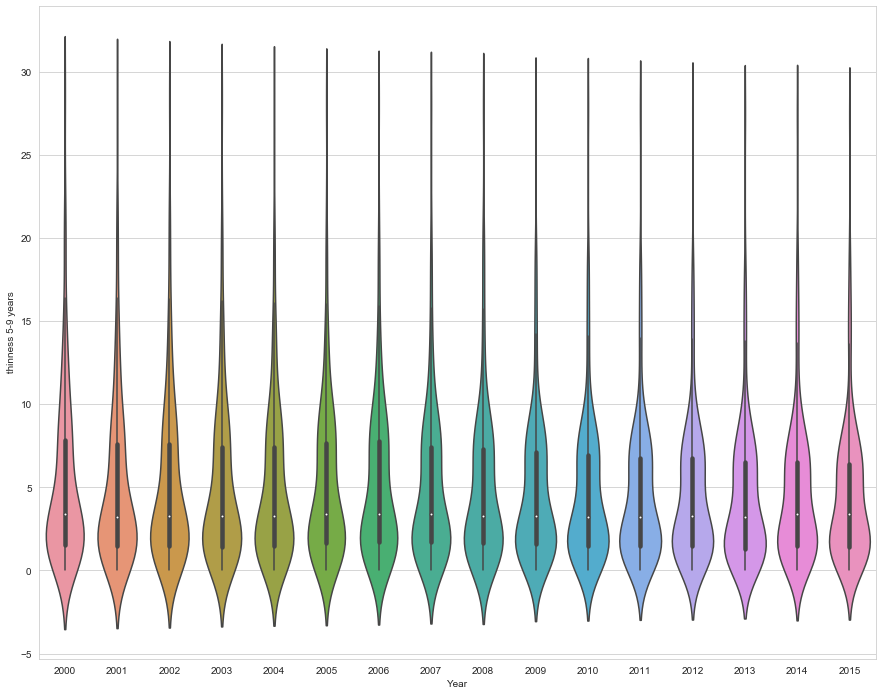

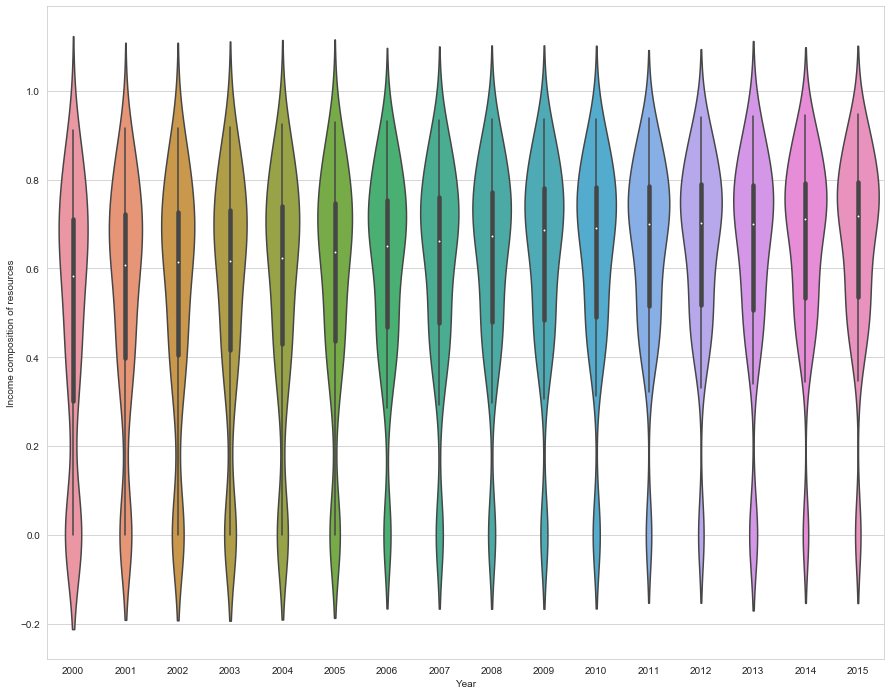

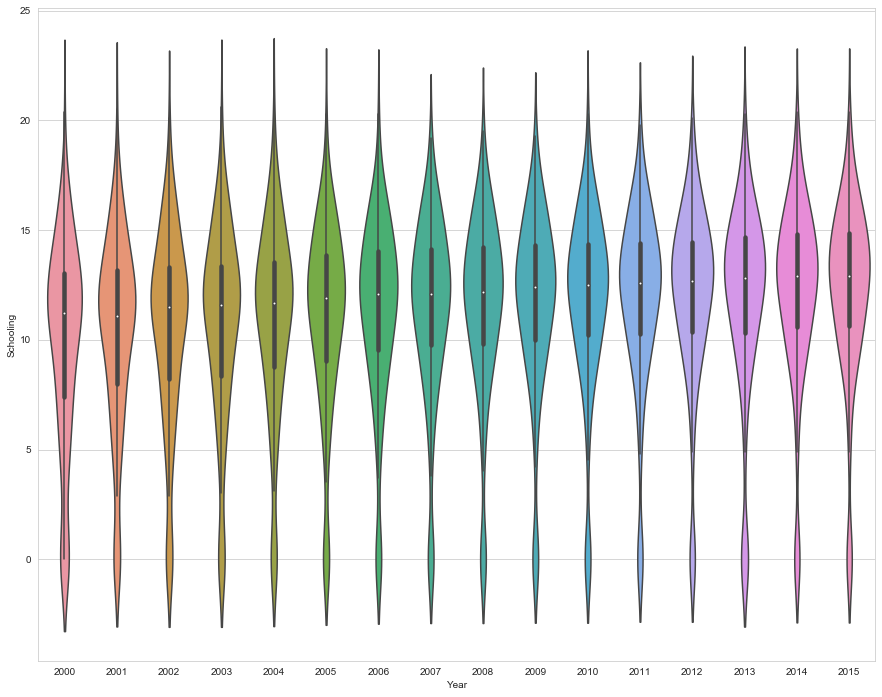

In [105]:
for i in [ 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling']:
    plt.figure(figsize=(15,12))
    sns.violinplot(x=df.Year,y=df[i],data=df)
    plt.show()

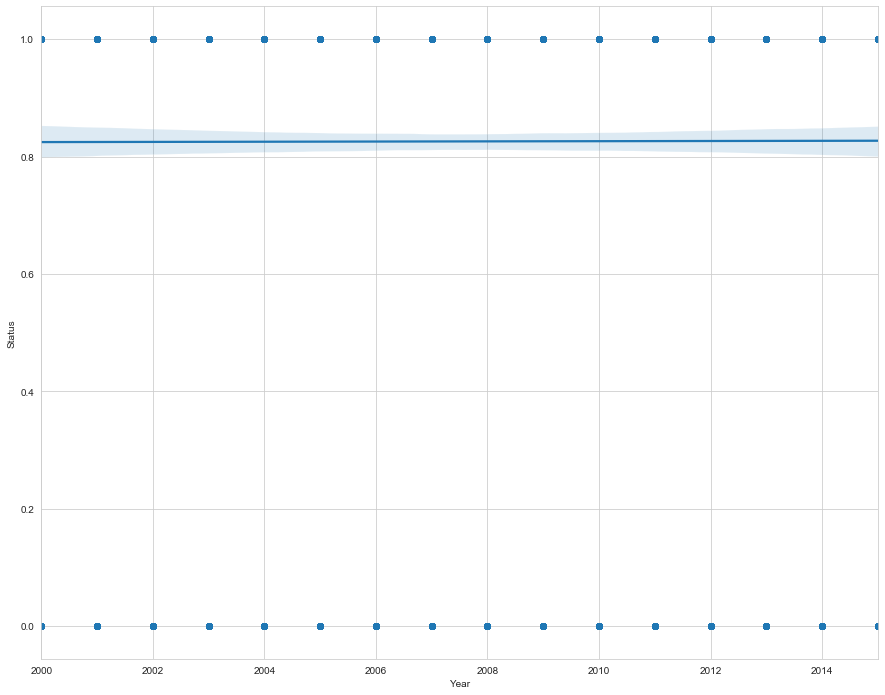

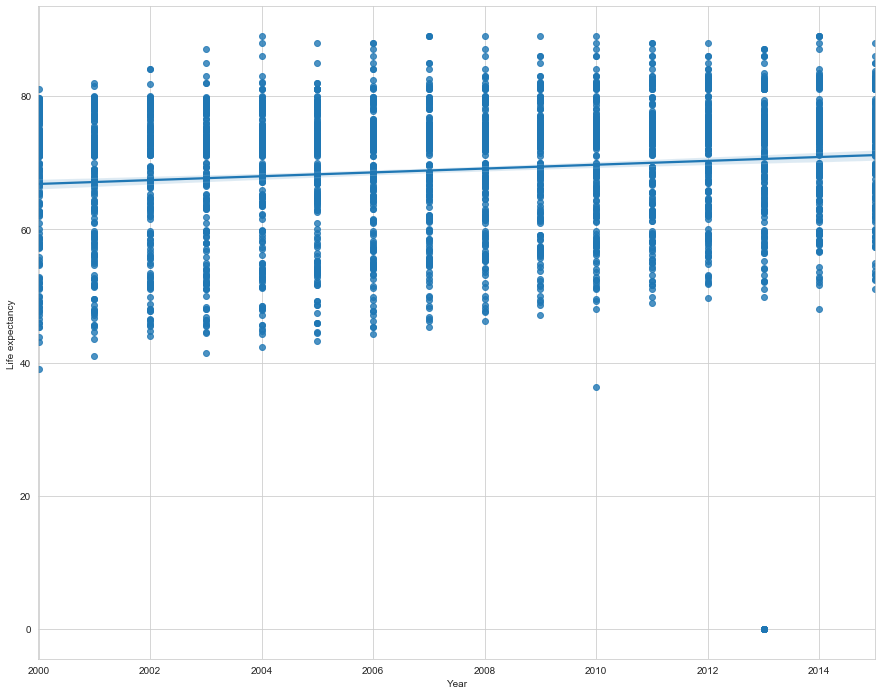

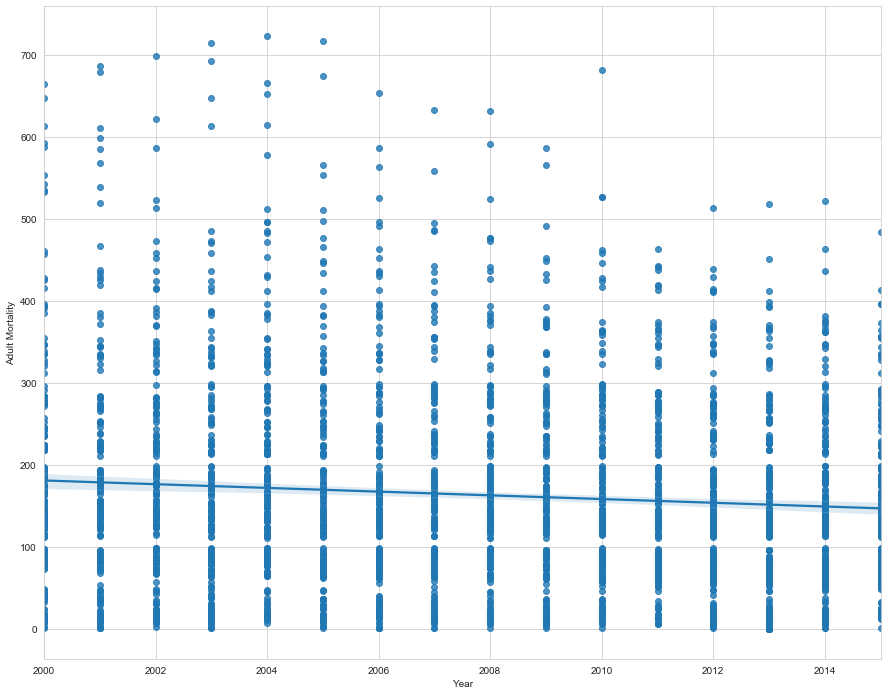

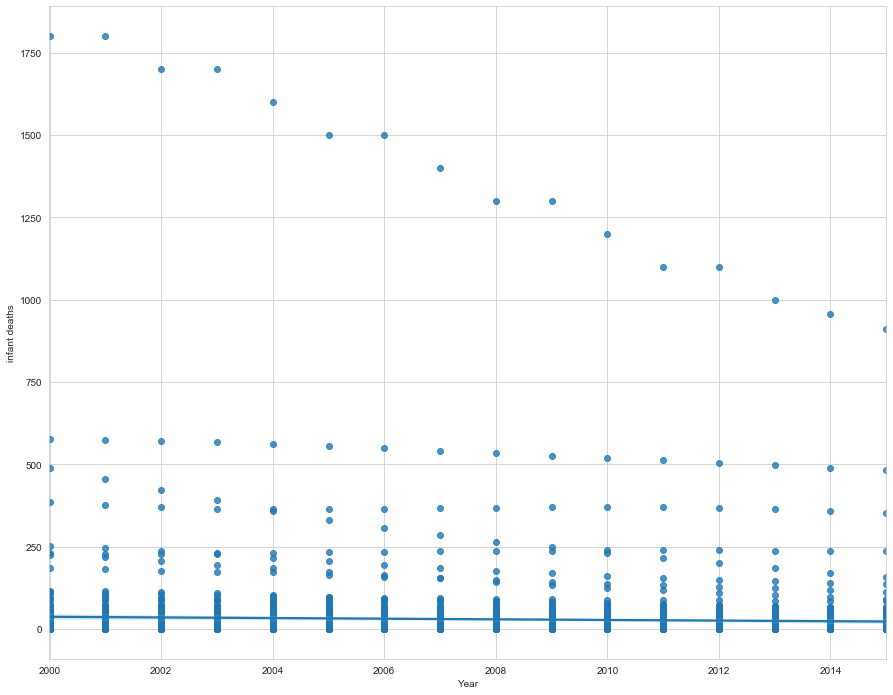

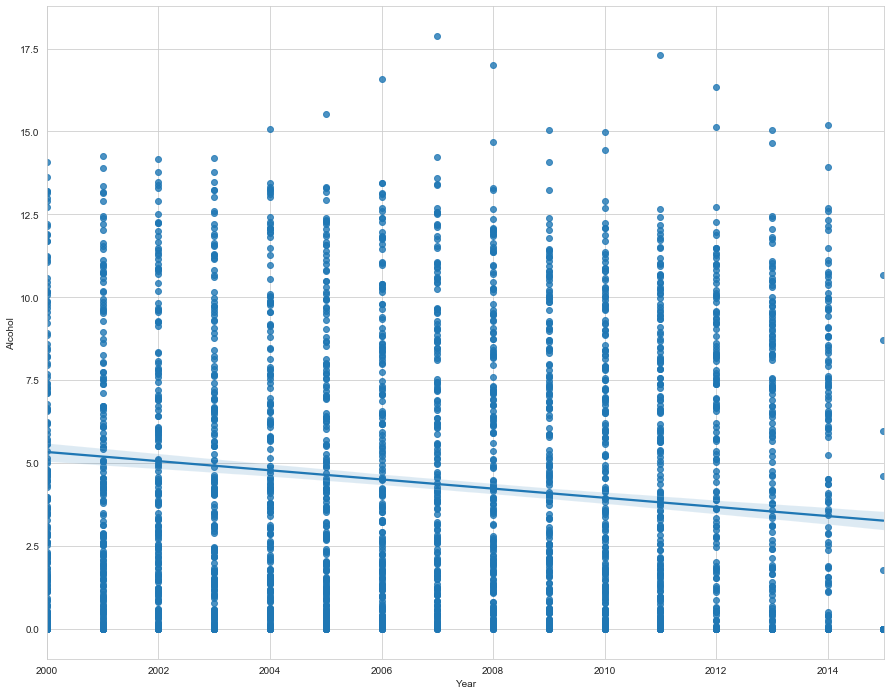

...

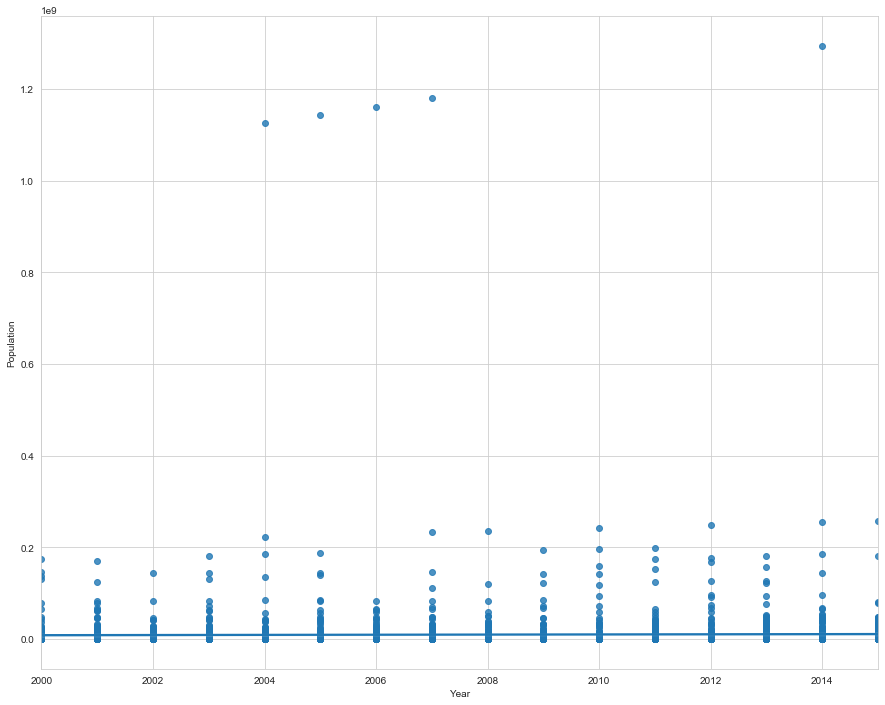

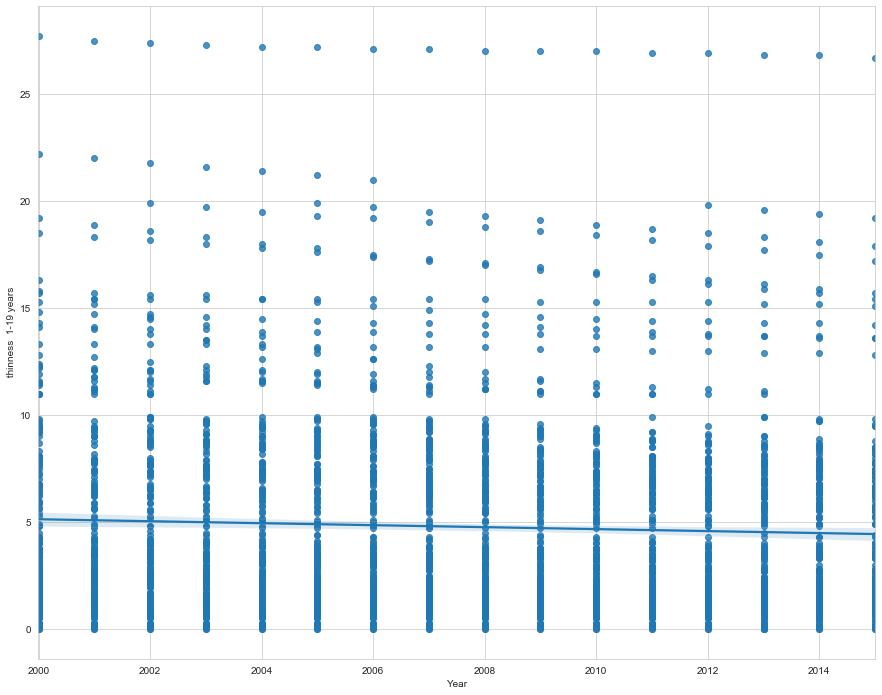

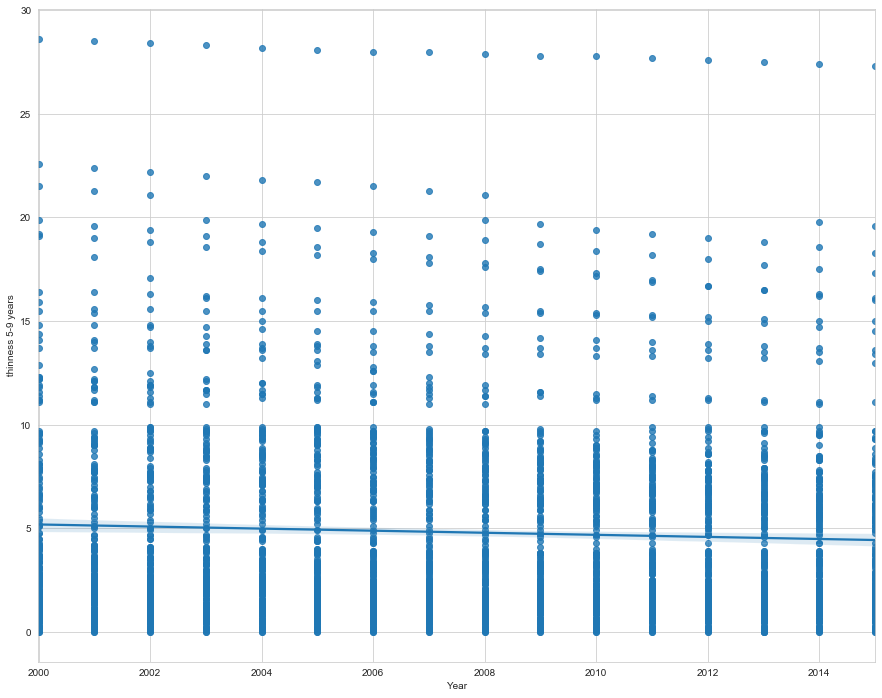

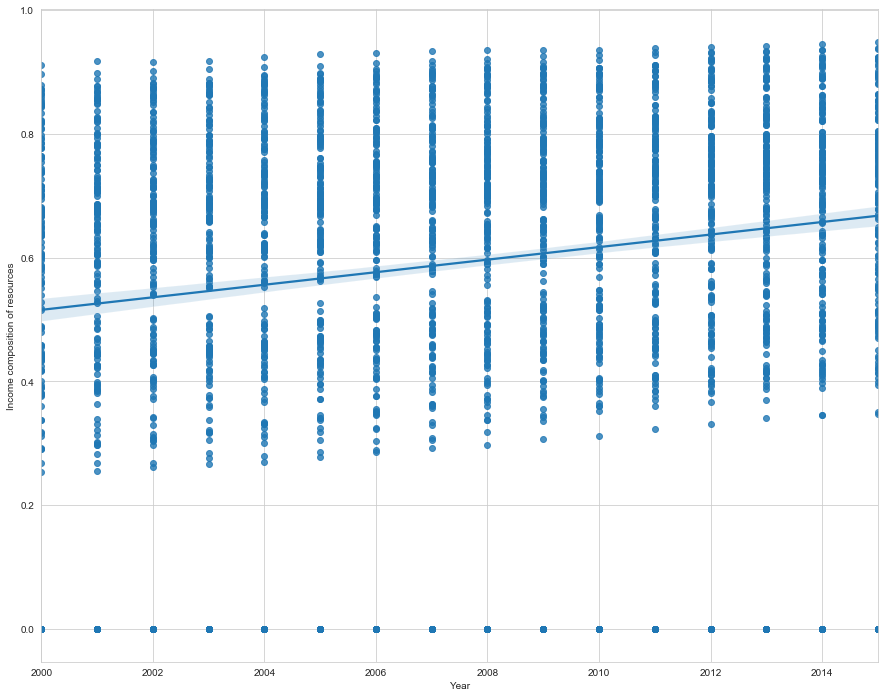

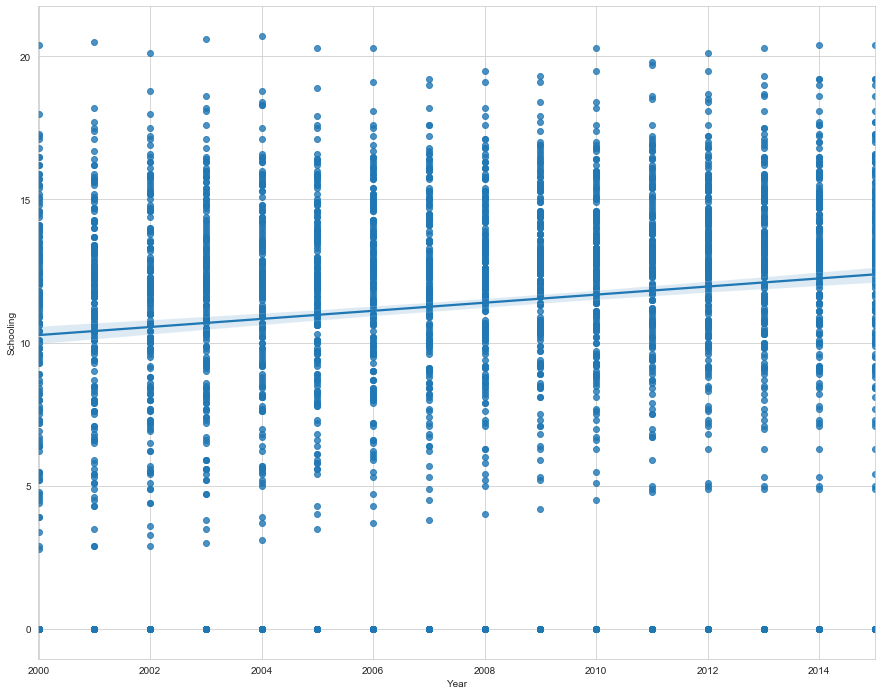

In [106]:
for i in [ 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling']:
    plt.figure(figsize=(15,12))
    sns.regplot(x=df.Year,y=df[i],data=df)
    plt.show()

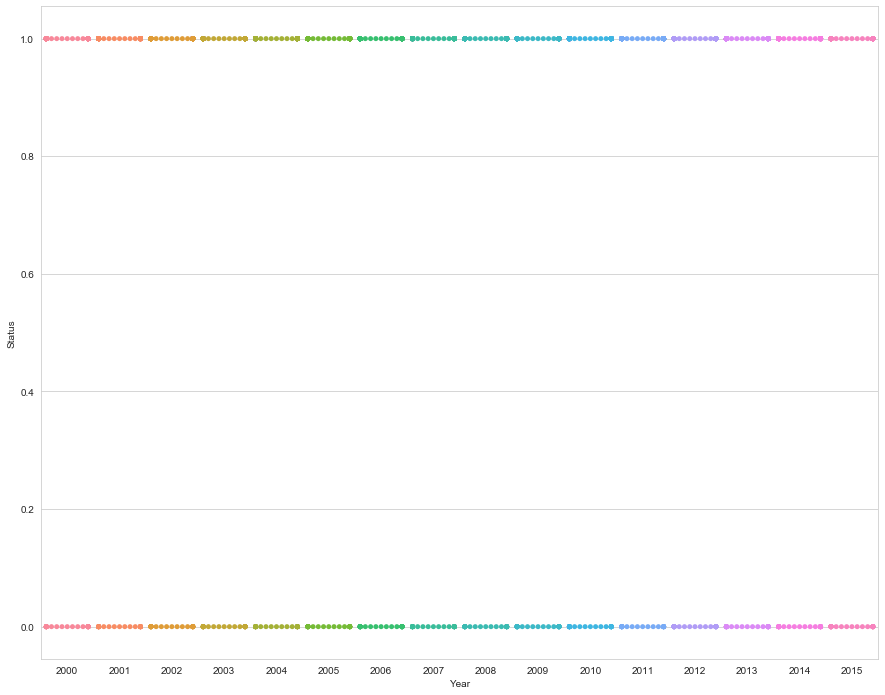

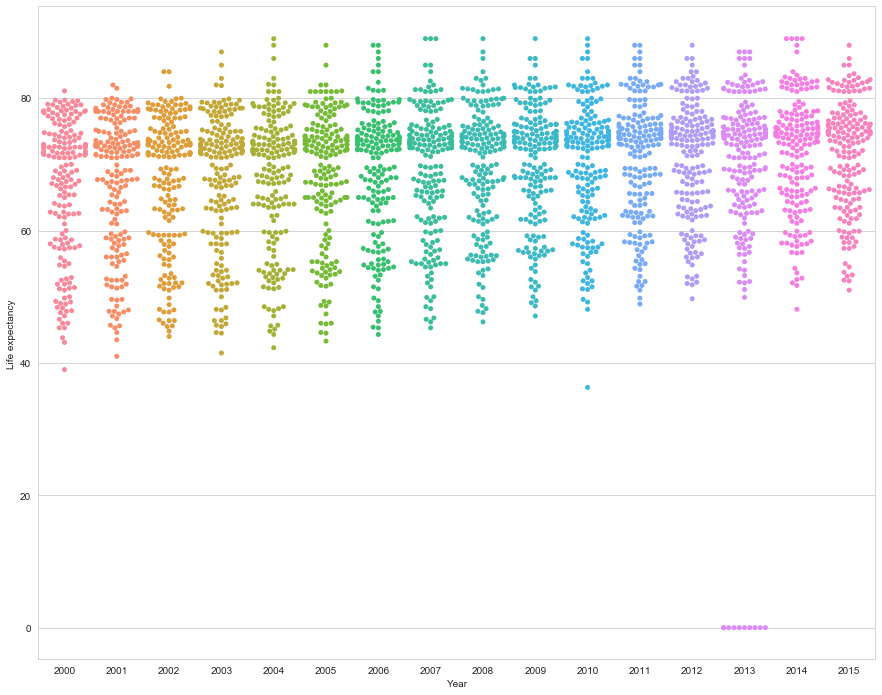

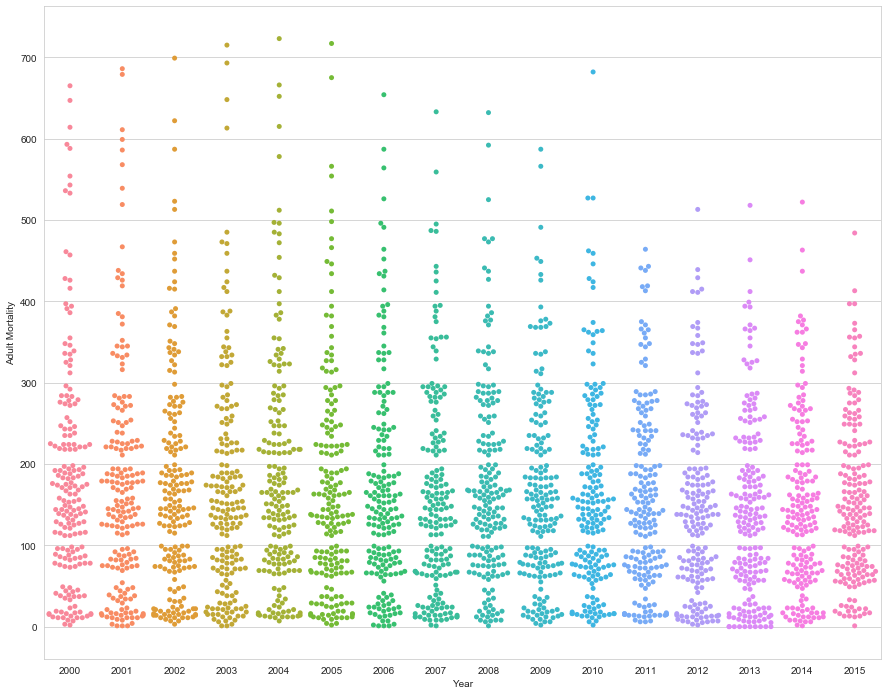

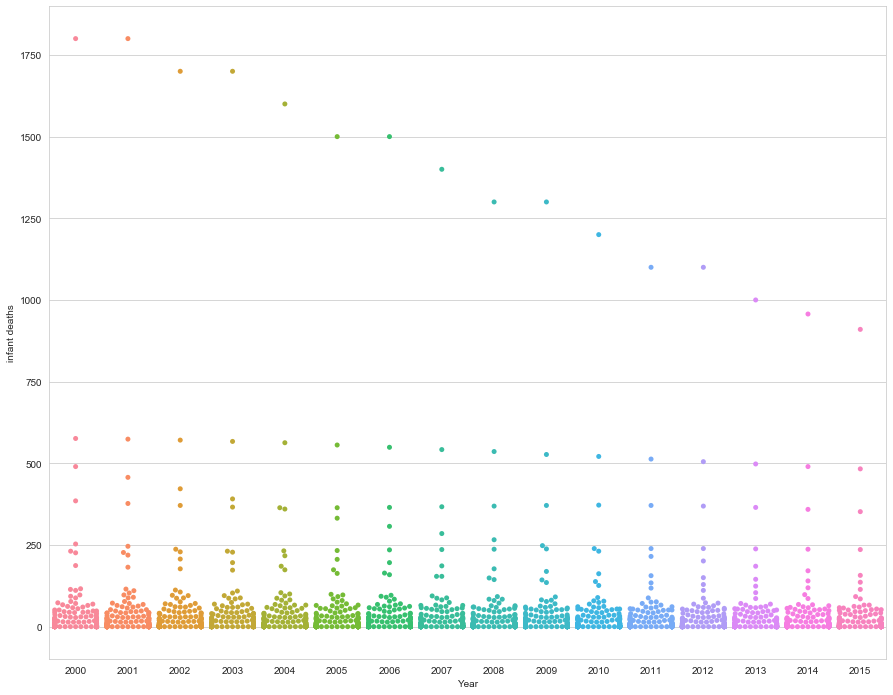

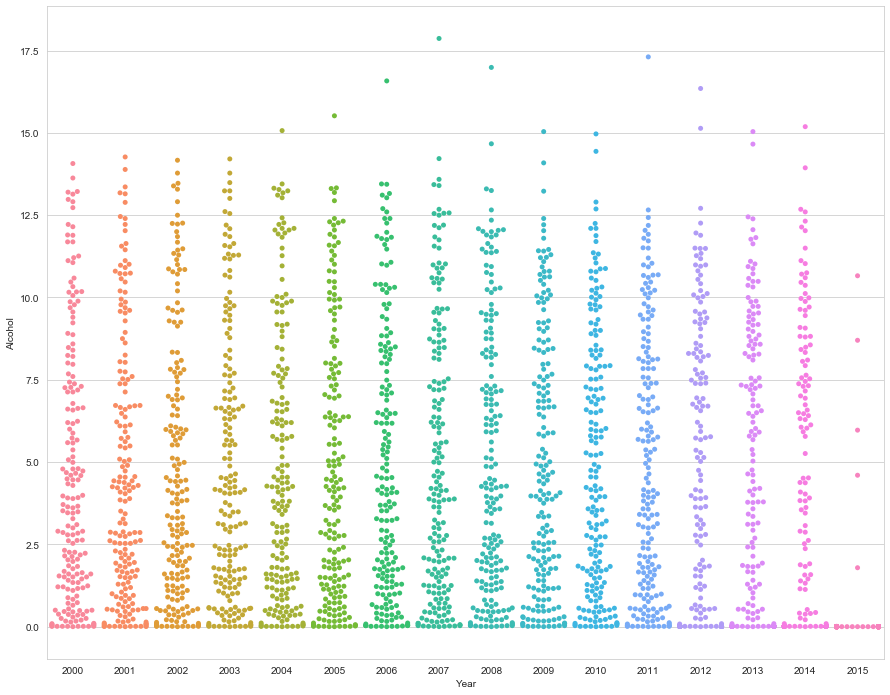

...

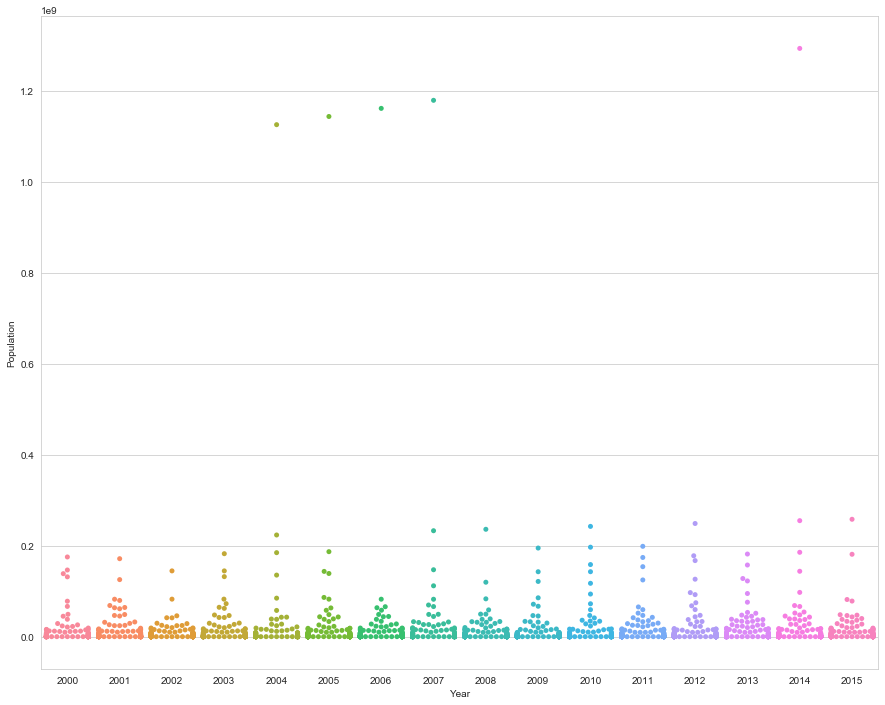

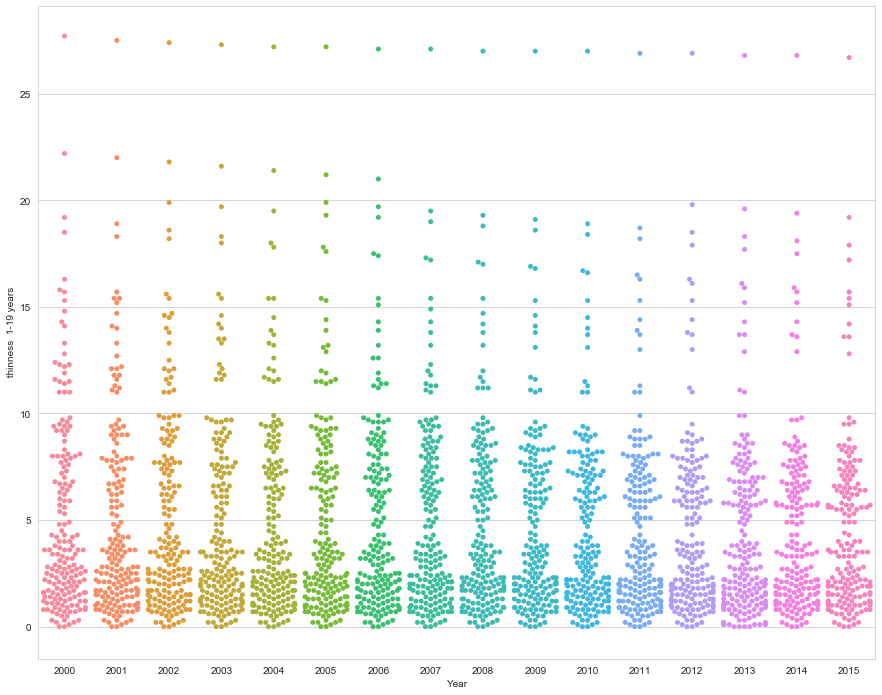

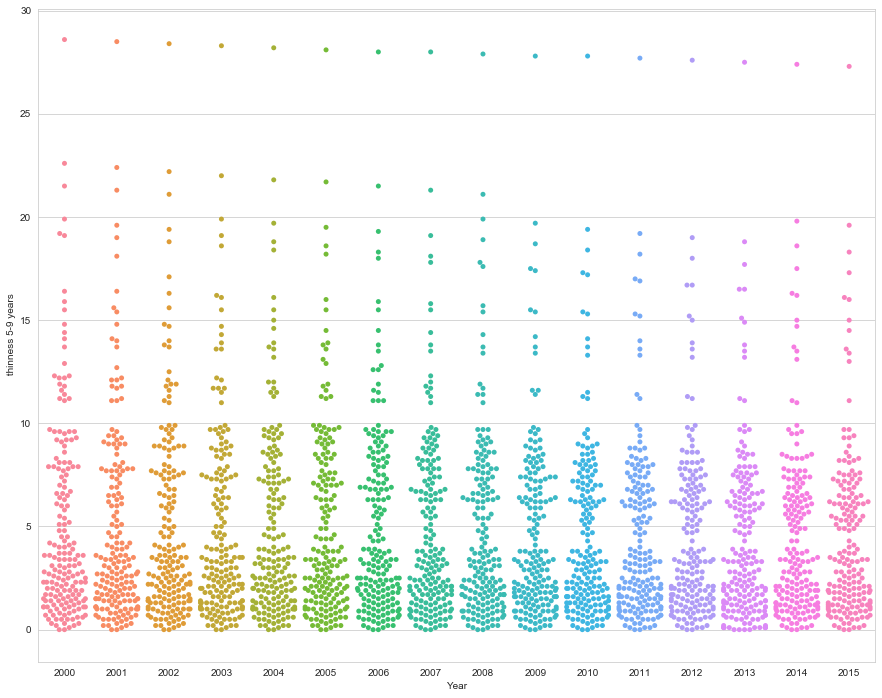

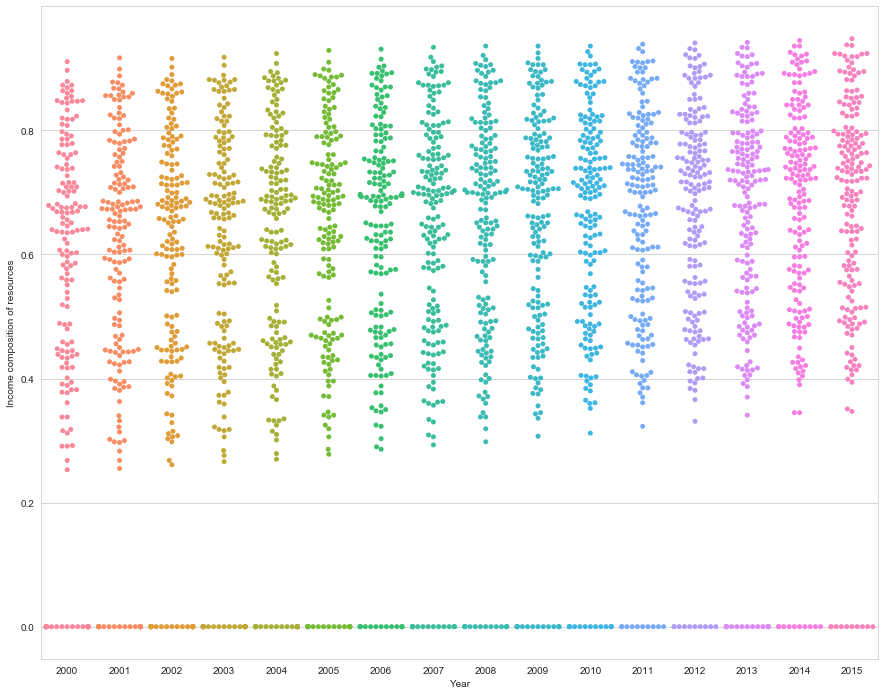

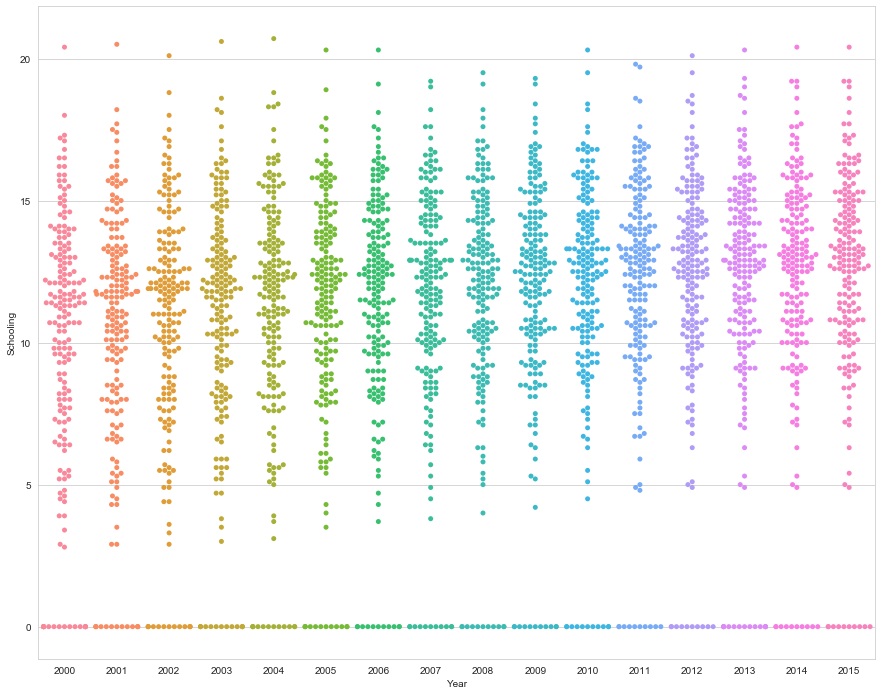

In [107]:
for i in [ 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling']:
    plt.figure(figsize=(15,12))
    sns.swarmplot(x=df.Year,y=df[i],data=df)
    plt.show()

In [108]:
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

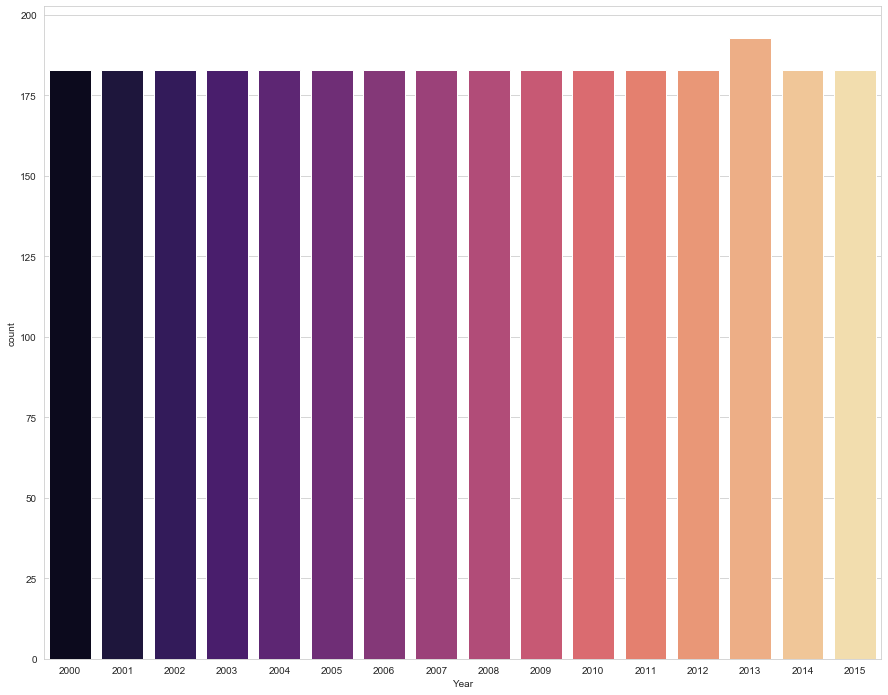

In [110]:
plt.figure(figsize=(15,12))
sns.countplot(x='Year',data=df,palette='magma')

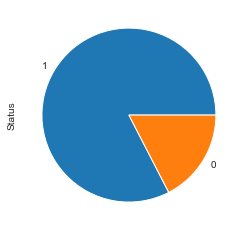

In [115]:
df.Status.value_counts().plot(kind='pie')

In [117]:
import sweetviz as sv

In [118]:
data=sv.analyze(df)
data.show_html('Analyze.html')

                                             |                                             | [  0%]   00:00 ->…

Report Analyze.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [119]:
from IPython.display import IFrame

In [120]:
IFrame(src='Analyze.html',width=1000,height=600)

In [121]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

In [122]:
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

In [124]:
man=MinMaxScaler()
feat=[ 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling']
df[feat]=man.fit_transform(df[feat])
df[feat]

,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,1.000000,1.0,0.730337,0.363762,0.034444,0.000560,0.003659,0.656566,0.005439,0.218786,...,0.060606,0.463636,0.656566,0.000000,0.004903,0.026074,0.620939,0.604895,0.505274,0.487923
1,0.933333,1.0,0.673034,0.374827,0.035556,0.000560,0.003774,0.626263,0.002319,0.213058,...,0.585859,0.464773,0.626263,0.000000,0.005141,0.000253,0.631769,0.611888,0.502110,0.483092
2,0.866667,1.0,0.673034,0.370678,0.036667,0.000560,0.003759,0.646465,0.002027,0.207331,...,0.626263,0.461932,0.646465,0.000000,0.005301,0.024525,0.638989,0.618881,0.495781,0.478261
3,0.800000,1.0,0.668539,0.376210,0.038333,0.000560,0.004014,0.676768,0.013135,0.201604,...,0.676768,0.484091,0.676768,0.000000,0.005622,0.002857,0.646209,0.629371,0.488397,0.473430
4,0.733333,1.0,0.665169,0.380360,0.039444,0.000560,0.000364,0.686869,0.014200,0.197022,...,0.686869,0.447159,0.686869,0.000000,0.000533,0.002302,0.657040,0.636364,0.478903,0.458937
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,0.266667,1.0,0.497753,1.000000,0.015000,0.243984,0.000000,0.686869,0.000146,0.310424,...,0.676768,0.405114,0.656566,0.663366,0.003813,0.009876,0.339350,0.328671,0.429325,0.444444
2934,0.200000,1.0,0.500000,0.988935,0.014444,0.227196,0.000000,0.070707,0.004703,0.305842,...,0.070707,0.370455,0.686869,0.724752,0.003804,0.009765,0.353791,0.346154,0.440928,0.458937
2935,0.133333,1.0,0.503371,0.100968,0.013889,0.247902,0.000000,0.737374,0.001433,0.301260,...,0.737374,0.371023,0.717172,0.786139,0.000481,0.000097,0.043321,0.045455,0.450422,0.483092
2936,0.066667,1.0,0.508989,0.948824,0.013889,0.096251,0.000000,0.767677,0.002493,0.296678,...,0.767677,0.350000,0.757576,0.831683,0.004603,0.009558,0.057762,0.059441,0.450422,0.473430


In [125]:
std=StandardScaler()
feat=['Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling']
df[feat]=std.fit_transform(df[feat])
df[feat]


,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,1.621762,0.459399,-0.386349,0.793736,0.268824,-1.051452,-0.335570,-0.018152,-0.110384,-0.923128,...,-3.132408,0.931823,-0.684260,-0.323445,-0.429458,0.440444,2.806470,2.767229,-0.449548,-0.287799
1,1.404986,0.459399,-0.880263,0.858029,0.285786,-1.051452,-0.334441,-0.095329,-0.168124,-0.947709,...,-0.989642,0.938781,-0.806510,-0.323445,-0.427337,-0.177477,2.874279,2.811554,-0.461496,-0.311246
2,1.188210,0.459399,-0.880263,0.833919,0.302749,-1.051452,-0.334594,-0.043877,-0.173531,-0.972289,...,-0.824814,0.921387,-0.725010,-0.323445,-0.425916,0.403364,2.919485,2.855879,-0.485391,-0.334693
3,0.971434,0.459399,-0.919001,0.866066,0.328193,-1.051452,-0.332096,0.033300,0.032045,-0.996869,...,-0.618779,1.057059,-0.602760,-0.323445,-0.423066,-0.115158,2.964692,2.922367,-0.513268,-0.358141
4,0.754658,0.459399,-0.948055,0.890176,0.345155,-1.051452,-0.367862,0.059025,0.051757,-1.016534,...,-0.577572,0.830939,-0.562011,-0.323445,-0.468297,-0.128444,3.032501,2.966692,-0.549111,-0.428482
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,-0.762774,0.459399,-2.391059,4.490596,-0.028022,0.014972,-0.371433,0.059025,-0.208332,-0.529843,...,-0.618779,0.573509,-0.684260,6.275044,-0.439146,0.052793,1.043428,1.016386,-0.736290,-0.498824
2934,-0.979550,0.459399,-2.371690,4.426303,-0.036503,-0.058574,-0.371433,-1.510240,-0.123991,-0.549507,...,-3.091200,0.361304,-0.562011,6.885650,-0.439222,0.050137,1.133840,1.127198,-0.692482,-0.428482
2935,-1.196326,0.459399,-2.342636,-0.733228,-0.044984,0.032133,-0.371433,0.187654,-0.184521,-0.569171,...,-0.371536,0.364783,-0.439761,7.496256,-0.468758,-0.181214,-0.810027,-0.778783,-0.656639,-0.311246
2936,-1.413102,0.459399,-2.294213,4.193240,-0.044984,-0.632237,-0.371433,0.264831,-0.164897,-0.588836,...,-0.247915,0.236068,-0.276761,7.949287,-0.432118,0.045185,-0.719614,-0.690133,-0.656639,-0.358141
